In [499]:
import pandas as pd
import numpy as np
import collections
import math
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import zero_one_loss, accuracy_score, mean_squared_error
from sklearn import tree
import random

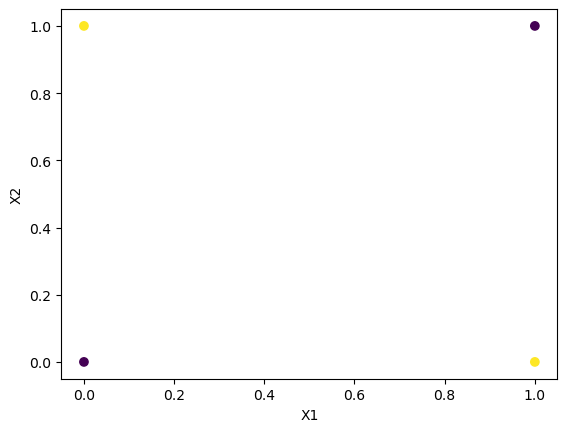

In [423]:
xor1=[1,1,0,0]
xor2=[0,1,0,1]
y=[1,0,0,1]
plt.scatter(xor1,xor2, c=y, label=y)
plt.xlabel('X1')
plt.ylabel('X2')
# plt.legend()
# plt.savefig('q2.png',dpi=500)

In [61]:
df = pd.read_csv('data/D1.txt', sep=' ',names=['f1','f2','y'])
df
x = df.drop('y',axis=1).values
y = df['y'].values
data = df.values

In [3]:
x

array([[0.264185, 0.178456],
       [0.409499, 0.213456],
       [0.926224, 0.540329],
       ...,
       [0.285166, 0.956678],
       [0.751571, 0.514041],
       [0.142654, 0.226182]])

In [4]:
y

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,

In [5]:
data

array([[0.264185, 0.178456, 0.      ],
       [0.409499, 0.213456, 1.      ],
       [0.926224, 0.540329, 1.      ],
       ...,
       [0.285166, 0.956678, 1.      ],
       [0.751571, 0.514041, 1.      ],
       [0.142654, 0.226182, 1.      ]])

In [6]:
np.unique(data[:,-1])


array([0., 1.])

In [495]:
# def entropy(df):
#     clases=[0.,1.]

#     e=0
#     for clas in clases:
#         n_c = sum(df[:,-1]==clas)
#         if n_c==0:
#             return 0
#         e-= np.dot(n_c/len(df) ,math.log2(n_c/len(df)))
#     return e
def entropy(df):
    if(len(df) == 0):
        return 0
    totalPositive = len(df[df[:,-1] == 1])
    totalNegative = len(df[df[:,-1] == 0])
    prob = [totalPositive/len(df), totalNegative/len(df)]
    if(prob[0] == 0 or prob[1] == 0):
        return 0
    basic_entropy = - np.dot(prob, np.log2(prob))

    return basic_entropy

def candidate_splits(df, feature):
    C=[]
    if len(df)==0:
        return 0,0
    clases=[0.,1.]
    Xi = df[:,feature].copy()
    Xi.sort()
    
#     vc = collections.Counter(df[:,-1])
    hy = entropy(df)
    if hy==0:
        return 0,0
    ig_tr = 0
    split=0
    for j in range(1,len(Xi)):
#         if df[-1,j] != df[-1,j+1]:
#             C.append((Xi[j]+Xi[j+1])/2)
        r = df[df[:,feature]<Xi[j]]
        l = df[df[:,feature]>=Xi[j]]

#         try:
        hyl = entropy(l)
        hyr = entropy(r)
        e_sum = (len(l)/len(df))*hyl + (len(r)/len(df))*hyr
#         if e_sum==0:
        print('feat',feature,' split',Xi[j],' infoGain',(hy - e_sum))
        try:
            hds = sum([(-(len(l)/len(df)) * math.log2(len(l)/len(df))), (-(len(r)/len(df)) * math.log2(len(r)/len(df)))])
        except:
            continue
        
        i_gain = (hy - e_sum)/ hds
        
        print('feat',feature,' split',Xi[j],' grainRatio',i_gain)
        if ig_tr<i_gain:
            ig_tr=i_gain
            split=Xi[j]
        
    return (split, ig_tr)
            
def findBestSplit(df):
    gr=0
    feature=0
    split=0
    for feat in range(len(df[0])-1):
        s, inf_gr = candidate_splits(df, feat)
        
#         print(s,inf_gr)
        if inf_gr>gr:
            gr=inf_gr
            feature = feat
            split=s
    if gr==0:
        return 0,0,0,0,0
    return(feature, gr,split, df[df[:,feature]>=split],df[df[:,feature]<split]) 

In [493]:
candidate_splits(druns.copy(),0)

feat 0  split 0.1  grainRatio 0.10051807676021828


(0.1, 0.10051807676021828)

In [496]:
findBestSplit(druns.copy())

feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.0  infoGain 0.0
feat 0  split 0.1  infoGain 0.04417739186726133
feat 0  split 0.1  grainRatio 0.10051807676021828
feat 1  split -1.0  infoGain 0.04417739186726133
feat 1  split -1.0  grainRatio 0.10051807676021828
feat 1  split 0.0  infoGain 0.03827452220629246
feat 1  split 0.0  grainRatio 0.055953759631263526
feat 1  split 1.0  infoGain 0.004886164091842726
feat 1  split 1.0  grainRatio 0.005780042205152319
feat 1  split 2.0  infoGain 0.0010821659130775263
feat 1  split 2.0  grainRatio 0.0011443495172767492
feat 1  split 3.0  infoGain 0.016313165825732057
feat 1  split 3.0  grainRatio 0.016411136842102134
feat 1  split 4.0  infoGain 0.04945207278939401
feat 1  split 4.0  grainRatio 0.049749064181778546
feat 1  split 

(1,
 0.4301569161309807,
 8.0,
 array([[0., 8., 1.]]),
 array([[ 0.1, -2. ,  0. ],
        [ 0. , -1. ,  1. ],
        [ 0. ,  0. ,  0. ],
        [ 0. ,  1. ,  0. ],
        [ 0. ,  2. ,  0. ],
        [ 0. ,  3. ,  0. ],
        [ 0. ,  4. ,  0. ],
        [ 0. ,  5. ,  0. ],
        [ 0. ,  6. ,  1. ],
        [ 0. ,  7. ,  0. ]]))

In [436]:
findBestSplit(np.array([[1, 1, 0],
        [1, 3, 1]]))

feat 1  split 3  infoGain 1.0
feat 1  split 3  grainRatio 1.0


(1, 1.0, 3, array([[1, 3, 1]]), array([[1, 1, 0]]))

In [437]:
Dtree(d3.copy())

feat 0  split 10  grainRatio 0.33155970728682876
feat 0  split 10  grainRatio 0.33155970728682876
feat 0  split 10  grainRatio 0.33155970728682876
feat 1  split 2  grainRatio 0.33155970728682876
feat 1  split 3  grainRatio 0.17606518336876092
feat 1  split 3  grainRatio 0.17606518336876092
feat 1  split 3  infoGain 1.0
feat 1  split 3  grainRatio 1.0


In [452]:
class TreeNode:
    n_nodes=0
    def __init__(self, threshold, feature, infoGrainRatio, isLeaf, count):
        
        self.node=TreeNode.n_nodes
        TreeNode.n_nodes+=1
        self.feature = feature
        self.threshold = threshold
        self.infoGainRatio = infoGrainRatio
        self.left = None
        self.right = None
        self.isLeaf = isLeaf
        self.output = None
        self.count = count

In [444]:
def Dtree(df):
    tpos = len(df[df[:,-1]==1])
    tneg = len(df[df[:,-1]==0])
    if tneg==0:
        leafNode = TreeNode(None,None,None,True, tpos)
        leafNode.output = 1
        return leafNode
    elif tpos==0:
        leafNode = TreeNode(None,None,None,True, tneg)
        leafNode.output = 0
        return leafNode
    feature, gr, split, dfl,dfr = findBestSplit(df)
#     print(dfl,dfr)
    if gr==0:
        if(tpos >= tneg):
            leafNode = TreeNode(None,None,None,True, tpos)
            leafNode.output = 1
        else:
            leafNode = TreeNode(None,None,None,True, tneg)
            leafNode.output = 0
        return leafNode
    rootN = TreeNode(split, feature, gr, False, len(df))
    rootN.left = Dtree(dfl)
    rootN.right = Dtree(dfr)
    
    return rootN
        

In [445]:
def traversePredict(node, row):
    if(node.isLeaf):
        return node.output
    elif(row[node.feature] < node.threshold):
        return traversePredict(node.right, row)
    else:
        b = traversePredict(node.left, row)
        return b
def predictions(node, df):
    predT = 0
    predF = 0
    preds=[]
    for row in range(0,len(df)):
        predict = traversePredict(node, df[row])
        preds.append(predict)
#         if(predict == df[row,-1]):
#             predT += 1
#         else:
#             predF += 1
    return (predT, predF, preds)

In [441]:
def visualise(d1root, level, parent):
    count = 0
    subTree = None
    if(parent != None):
        if(parent.left == d1root):
            subTree = "left"
        elif(parent.right == d1root):
            subTree = "right"
        else:
            subTree = None
            
    if(d1root.isLeaf):
        #Visualisation Print Statement
        print("{ node :",(d1root.node), "\n parentNode :", (None if parent==None else parent.node),  "\n leaf_level :", level, "\n isLeaf :", d1root.isLeaf, "\n count :", d1root.count, "\n predict :", d1root.output,"\n subTree :",subTree, "}")
        return 1
    else:
        #Visualisation Print Statement
        print("{ node :",(d1root.node), "\n parentNode :", (None if parent==None else parent.node), "\n root_level :", level, "\n threshold :", 'X'+str(d1root.feature+1)+'>='+str(d1root.threshold), "\n feature :", d1root.feature+1, "\n count :", d1root.count, "\n info_gain_ratio :", d1root.infoGainRatio, "\n subTree :",subTree, "}")
        
        if(d1root.left != None):
            count += visualise(d1root.left, level + 1, d1root)
        if(d1root.right != None):
            count += visualise(d1root.right, level + 1, d1root)
        return count + 1

In [442]:
druns = pd.read_table('Druns.txt',sep=' ',header=None,names=['f1','f2','y'])
druns = druns.values
drunsRoot = Dtree(druns)
prediction =  predictions(drunsRoot, druns)

feat 0  split 0.1  grainRatio 0.10051807676021828
feat 1  split -1.0  grainRatio 0.10051807676021828
feat 1  split 0.0  grainRatio 0.055953759631263526
feat 1  split 1.0  grainRatio 0.005780042205152319
feat 1  split 2.0  grainRatio 0.0011443495172767492
feat 1  split 3.0  grainRatio 0.016411136842102134
feat 1  split 4.0  grainRatio 0.049749064181778546
feat 1  split 5.0  grainRatio 0.111240295863398
feat 1  split 6.0  grainRatio 0.23609960614360795
feat 1  split 7.0  grainRatio 0.055953759631263526
feat 1  split 8.0  grainRatio 0.4301569161309807
feat 0  split 0.1  grainRatio 0.07280247297910734
feat 1  split -1.0  grainRatio 0.07280247297910734
feat 1  split 0.0  grainRatio 0.1206166388929235
feat 1  split 1.0  grainRatio 0.03661492441548469
feat 1  split 2.0  grainRatio 0.0076248906555897965
feat 1  split 3.0  grainRatio 0.0
feat 1  split 4.0  grainRatio 0.0076248906555897965
feat 1  split 5.0  grainRatio 0.03661492441548469
feat 1  split 6.0  grainRatio 0.1206166388929235
feat 1  

In [377]:
prediction

(0, 0, [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1])

In [378]:
druns[:,-1]

array([0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1.])

In [379]:
print("Node count: ",visualise(drunsRoot, 0, None))

{ node : 332 
 parentNode : None 
 root_level : 0 
 threshold : X2>=8.0 
 feature : 2 
 count : 11 
 info_gain_ratio : 0.4301569161309807 
 subTree : None }
{ node : 333 
 parentNode : 332 
 leaf_level : 1 
 isLeaf : True 
 count : 1 
 predict : 1 
 subTree : left }
{ node : 334 
 parentNode : 332 
 root_level : 1 
 threshold : X2>=0.0 
 feature : 2 
 count : 10 
 info_gain_ratio : 0.1206166388929235 
 subTree : right }
{ node : 335 
 parentNode : 334 
 root_level : 2 
 threshold : X2>=6.0 
 feature : 2 
 count : 8 
 info_gain_ratio : 0.36185425731195636 
 subTree : left }
{ node : 336 
 parentNode : 335 
 root_level : 3 
 threshold : X2>=7.0 
 feature : 2 
 count : 2 
 info_gain_ratio : 1.0 
 subTree : left }
{ node : 337 
 parentNode : 336 
 leaf_level : 4 
 isLeaf : True 
 count : 1 
 predict : 0 
 subTree : left }
{ node : 338 
 parentNode : 336 
 leaf_level : 4 
 isLeaf : True 
 count : 1 
 predict : 1 
 subTree : right }
{ node : 339 
 parentNode : 335 
 leaf_level : 3 
 isLeaf :

In [448]:
#D3 Leaves, Question 4
d3 = pd.read_csv('data/D3leaves.txt', sep=' ',names=['f1','f2','y'])
d3 = d3.values
d3Root = Dtree(d3.copy())
prediction = predictions(d3Root, d3.copy())
# correct  = prediction[0]
# incorrect = prediction[1]
print(prediction)
print(d3[:,-1])
#Visualise and print Nodes, Accuracy Score
# print("Accuracy :" ,correct/(correct + incorrect))
print("Node count: ",visualise(d3Root, 0 , None))

feat 0  split 10  grainRatio 0.33155970728682876
feat 0  split 10  grainRatio 0.33155970728682876
feat 0  split 10  grainRatio 0.33155970728682876
feat 1  split 2  grainRatio 0.33155970728682876
feat 1  split 3  grainRatio 0.17606518336876092
feat 1  split 3  grainRatio 0.17606518336876092
feat 1  split 3  infoGain 1.0
feat 1  split 3  grainRatio 1.0
(0, 0, [1, 1, 1, 0, 1])
[1 1 1 0 1]
{ node : 0 
 parentNode : None 
 root_level : 0 
 threshold : X1>=10 
 feature : 1 
 count : 5 
 info_gain_ratio : 0.33155970728682876 
 subTree : None }
{ node : 1 
 parentNode : 0 
 leaf_level : 1 
 isLeaf : True 
 count : 3 
 predict : 1 
 subTree : left }
{ node : 2 
 parentNode : 0 
 root_level : 1 
 threshold : X2>=3 
 feature : 2 
 count : 2 
 info_gain_ratio : 1.0 
 subTree : right }
{ node : 3 
 parentNode : 2 
 leaf_level : 2 
 isLeaf : True 
 count : 1 
 predict : 1 
 subTree : left }
{ node : 4 
 parentNode : 2 
 leaf_level : 2 
 isLeaf : True 
 count : 1 
 predict : 0 
 subTree : right }
Nod

In [381]:
d3

array([[10,  1,  1],
       [10,  2,  1],
       [10,  3,  1],
       [ 1,  1,  0],
       [ 1,  3,  1]], dtype=int64)

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


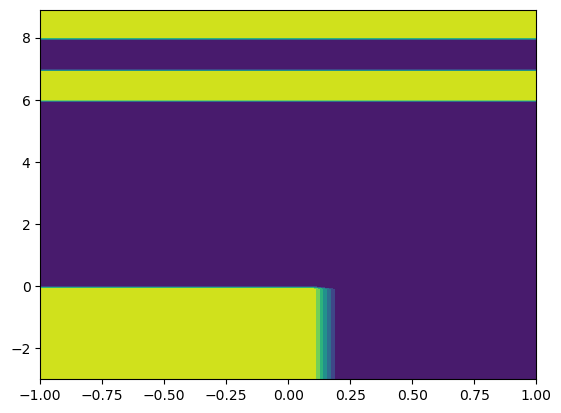

In [384]:
def plot_contourf(X,y, root):
    if type(X) != np.ndarray:
        X = X.to_numpy()
    xmin, xmax = X[:, 0].min()-1, X[:, 0].max()+1
    ymin, ymax = X[:, 1].min()-1, X[:, 1].max()+1
    zmin, zmax = y.min()-1, y.max()+1
    x_grid = np.arange(xmin, xmax, 0.1)
    y_grid = np.arange(ymin, ymax, 0.1)
#     z_grid = np.arange(zmin, zmax, 0.1)
    xaxis, yaxis = np.meshgrid(x_grid, y_grid)
    dt = DecisionTreeClassifier(random_state=101)
    r1, r2 = xaxis.flatten(), yaxis.flatten()
    r1, r2 = r1.reshape((len(r1), 1)), r2.reshape((len(r2), 1))
    grid = np.hstack((r1,r2))

    grid = pd.DataFrame(grid, columns = ['X1','X2'])
#     grid['y'] = y
#     dt.fit(X,y)
#     yhat=dt.predict(grid)
    _,_,yhat = predictions(root, grid.values)
#     print(yhat)
    yhat = np.array(yhat)

    zaxis = yhat.reshape(xaxis.shape)

    return plt.contourf(xaxis, yaxis, zaxis)
    
plot_contourf(druns[:,:-1], druns[:,-1], drunsRoot)

In [450]:
# For Question 5, D1

d1 =pd.read_csv('data/D1.txt', sep=' ',names=['f1','f2','y'])
d1 = d1.values
d1root = Dtree(d1)
prediction =  predictions(d1root, d1)
correct  = sum(prediction[2]==d1[:,-1])
incorrect = len(d1)-correct
print(correct, incorrect)
#Visualise and print Nodes, Accuracy Score
print("Accuracy :" ,correct/(correct + incorrect))
print("Node count: ",visualise(d1root, 0 , None))

feat 0  split 0.001405  grainRatio 0.024341952901856125
feat 0  split 0.001824  grainRatio 0.02669736730839621
feat 0  split 0.001943  grainRatio 0.02830507164956825
feat 0  split 0.003089  grainRatio 0.029572609146626034
feat 0  split 0.005812  grainRatio 0.03064007034545678
feat 0  split 0.006173  grainRatio 0.03157392575803687
feat 0  split 0.007471  grainRatio 0.03241142177432277
feat 0  split 0.008663  grainRatio 0.03317571481697702
feat 0  split 0.008861  grainRatio 0.033882271271310084
feat 0  split 0.009175  grainRatio 0.03454197947009826
feat 0  split 0.010672  grainRatio 0.03516282048662811
feat 0  split 0.01079  grainRatio 0.03575083443418143
feat 0  split 0.010938  grainRatio 0.03631071275468051
feat 0  split 0.011643  grainRatio 0.036846178627512716
feat 0  split 0.011844  grainRatio 0.009905777558334522
feat 0  split 0.012141  grainRatio 0.010961961003840625
feat 0  split 0.01228  grainRatio 0.011976205130441024
feat 0  split 0.012936  grainRatio 0.012950377966852451
feat

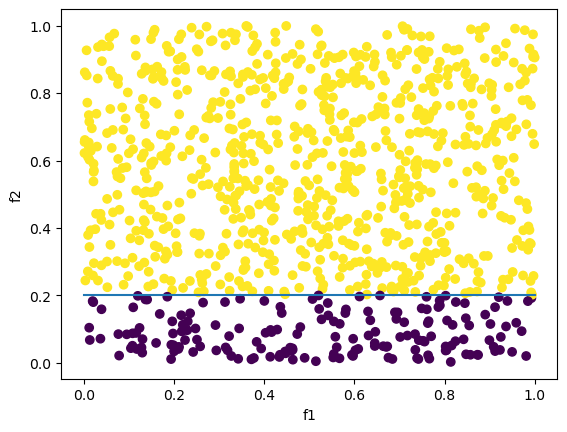

In [451]:
plt.scatter(d1[:,0],d1[:,1], c=d1[:,-1])
plt.xlabel("f1")
plt.ylabel("f2")
f2=np.empty(50); f2.fill(0.199725)
f1 = np.linspace(0,1)
plt.plot(f1, f2)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(d1.iloc[:,0],d1.iloc[:,1],d1.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
# plt.savefig('q5c.png',dpi=500)
plt.show()

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


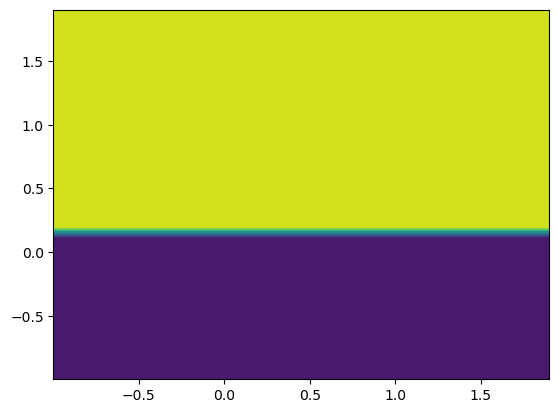

In [387]:
plot_contourf(d1[:,:-1], d1[:,-1], d1root)

In [453]:
# For Question 5, D2

d2 =pd.read_csv('data/D2.txt', sep=' ',names=['f1','f2','y'])
d2 = d2.values
d2root = Dtree(d2)
prediction =  predictions(d2root, d2)
correct  = sum(prediction[2]==d2[:,-1])
incorrect = len(d2)-correct
print(correct, incorrect)
#Visualise and print Nodes, Accuracy Score
print("Accuracy :" ,correct/(correct + incorrect))
print("Node count: ",visualise(d2root, 0 , None))

feat 0  split 0.002848  grainRatio 0.08571350658012974
feat 0  split 0.003742  grainRatio 0.09402289532964006
feat 0  split 0.004763  grainRatio 0.09970133062693452
feat 0  split 0.00582  grainRatio 0.10418327963476605
feat 0  split 0.011835  grainRatio 0.10796177069997162
feat 0  split 0.013345  grainRatio 0.11127070985870943
feat 0  split 0.013377  grainRatio 0.11424115034743362
feat 0  split 0.014763  grainRatio 0.11695456028803332
feat 0  split 0.017627  grainRatio 0.11946534723536818
feat 0  split 0.017791  grainRatio 0.12181181019026198
feat 0  split 0.018578  grainRatio 0.12402201929735342
feat 0  split 0.01863  grainRatio 0.1261172161680074
feat 0  split 0.020892  grainRatio 0.12811389797750228
feat 0  split 0.023088  grainRatio 0.1300251559436155
feat 0  split 0.023132  grainRatio 0.13186156864308277
feat 0  split 0.023776  grainRatio 0.13363181774746263
feat 0  split 0.027517  grainRatio 0.1353431242264076
feat 0  split 0.02822  grainRatio 0.137001564749553
feat 0  split 0.02

feat 0  split 0.99954  grainRatio 0.00941778872054261
feat 1  split 0.228825  grainRatio 0.00941778872054261
feat 1  split 0.22923  grainRatio 0.010486454545213275
feat 1  split 0.230273  grainRatio 0.011237975977540091
feat 1  split 0.234325  grainRatio 0.011844277925347804
feat 1  split 0.234851  grainRatio 0.012364954349422357
feat 1  split 0.234851  grainRatio 0.012364954349422357
feat 1  split 0.242906  grainRatio 0.008467285589583776
feat 1  split 0.243049  grainRatio 0.005538105334855693
feat 1  split 0.244365  grainRatio 0.0035842622009492637
feat 1  split 0.246661  grainRatio 0.0022620909263062717
feat 1  split 0.247736  grainRatio 0.0013660078273363546
feat 1  split 0.248934  grainRatio 0.0007667367011746515
feat 1  split 0.249355  grainRatio 0.0003796543265130213
feat 1  split 0.251102  grainRatio 0.00014750962395220535
feat 1  split 0.257297  grainRatio 0.008231583052189352
feat 1  split 0.257736  grainRatio 0.006678266113241894
feat 1  split 0.25797  grainRatio 0.005403447

feat 0  split 0.32701  grainRatio 0.05650149501416887
feat 0  split 0.327548  grainRatio 0.057019916794419576
feat 0  split 0.328461  grainRatio 0.05754567958923059
feat 0  split 0.328603  grainRatio 0.05807894180406307
feat 0  split 0.331763  grainRatio 0.058619866341380424
feat 0  split 0.334572  grainRatio 0.05916862076140542
feat 0  split 0.334845  grainRatio 0.05972537744978743
feat 0  split 0.337672  grainRatio 0.060290313792530234
feat 0  split 0.340265  grainRatio 0.06086361235854749
feat 0  split 0.341054  grainRatio 0.06144546109023909
feat 0  split 0.341515  grainRatio 0.062036053502499466
feat 0  split 0.343437  grainRatio 0.06263558889059859
feat 0  split 0.344933  grainRatio 0.06324427254739798
feat 0  split 0.345416  grainRatio 0.06386231599039553
feat 0  split 0.345689  grainRatio 0.06448993719912113
feat 0  split 0.346082  grainRatio 0.06512736086343654
feat 0  split 0.347109  grainRatio 0.06577481864332854
feat 0  split 0.347878  grainRatio 0.06643254944082058
feat 0 

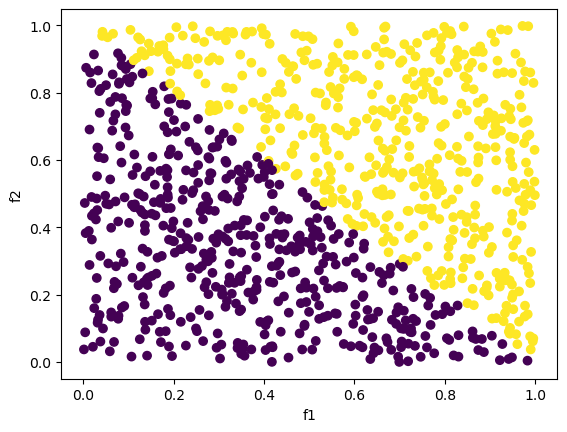

In [454]:
plt.scatter(d2[:,0],d2[:,1], c=d2[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
# plt.savefig('q6a.png',dpi=500)

plt.show()

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


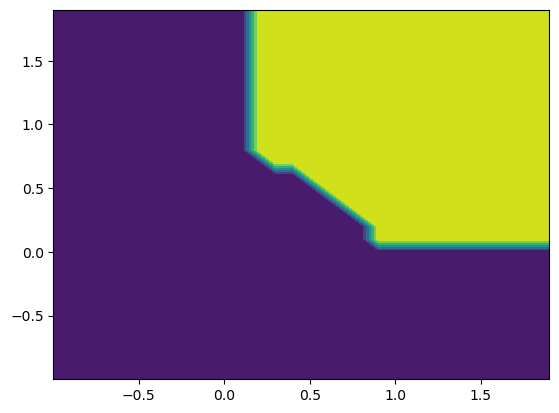

In [390]:
plot_contourf(d2[:,:-1], d2[:,-1], d2root)

In [462]:
error=[]

feat 0  split -0.923198  grainRatio 0.1593904921287026
feat 0  split -0.887316  grainRatio 0.19421812706864736
feat 0  split -0.853883  grainRatio 0.22447389176876748
feat 0  split -0.798185  grainRatio 0.04932861257569575
feat 0  split -0.738441  grainRatio 0.08153106481291442
feat 0  split -0.691951  grainRatio 0.026990297890478947
feat 0  split -0.629311  grainRatio 0.005453737572133071
feat 0  split -0.59618  grainRatio 0.01867778468621143
feat 0  split -0.54514  grainRatio 0.03712928182987632
feat 0  split -0.482669  grainRatio 0.014711614263624682
feat 0  split -0.442618  grainRatio 0.003367171880517088
feat 0  split -0.329659  grainRatio 0.012641190984879558
feat 0  split -0.307283  grainRatio 0.02716323752569459
feat 0  split -0.286152  grainRatio 0.04686013513163868
feat 0  split -0.254817  grainRatio 0.02568611789394888
feat 0  split -0.18703  grainRatio 0.04556599707503495
feat 0  split -0.127044  grainRatio 0.02568611789394888
feat 0  split -0.087135  grainRatio 0.011613647

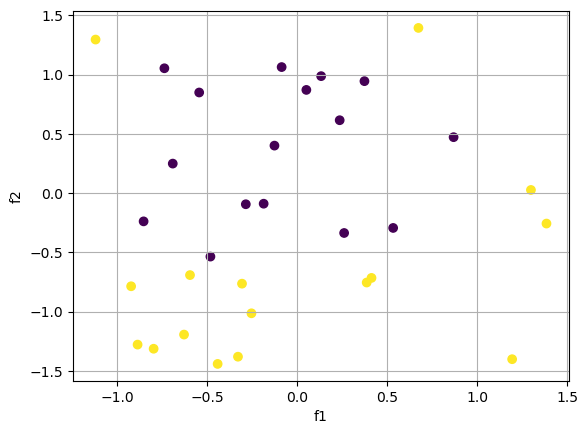

In [463]:
dbig = pd.read_csv('data/Dbig.txt', sep=' ',names=['f1','f2','y'])
dbig_tr, dbig_ts = train_test_split(dbig, train_size=8192)
dbig_tr, dbig_ts = dbig_tr.values, dbig_ts.values
dBigTrain32 = dbig_tr[0:32]
dBigTrain32Root = Dtree(dBigTrain32)
node32 = visualise(dBigTrain32Root, 0, None)
print("Node count: ",node32)
ratio = predictions(dBigTrain32Root, dbig_ts)
correct  = sum(ratio[2]==dbig_ts[:,-1])
incorrect = len(dbig_ts)-correct
err32 = incorrect/(correct+incorrect)
error.append(err32)
# correct  = prediction[0]
# incorrect = prediction[1]

#Visualise and print Nodes, Accuracy Score
print("Accuracy :" , correct/(correct+incorrect), err32)


plt.scatter(dBigTrain32[:,0],dBigTrain32[:,1], c=dBigTrain32[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
plt.grid(True)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(dBigTrain32.iloc[:,0],dBigTrain32.iloc[:,1],dBigTrain32.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
plt.show()


C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


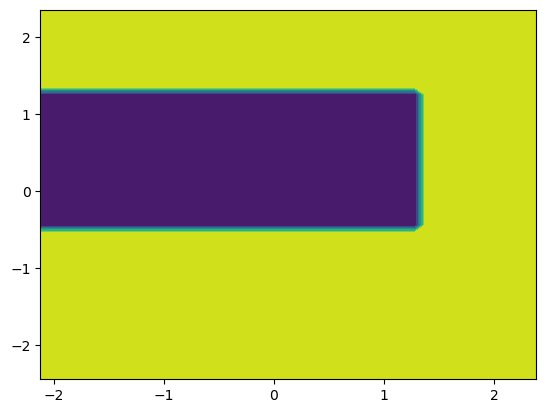

In [464]:
plot_contourf(dBigTrain32[:,:-1], dBigTrain32[:,-1], dBigTrain32Root)

feat 0  split -1.340619  grainRatio 0.09419038802826285
feat 0  split -1.320248  grainRatio 0.10750250627724477
feat 0  split -1.255988  grainRatio 0.1174082357989433
feat 0  split -1.252079  grainRatio 0.12577736444187523
feat 0  split -1.245265  grainRatio 0.13326365715170416
feat 0  split -1.205472  grainRatio 0.14018120043212062
feat 0  split -1.179407  grainRatio 0.1467080025722
feat 0  split -1.134266  grainRatio 0.15295605329984374
feat 0  split -1.120676  grainRatio 0.15900116059455519
feat 0  split -1.11328  grainRatio 0.16489754152614172
feat 0  split -1.000033  grainRatio 0.17068569353676513
feat 0  split -0.99018  grainRatio 0.09387137564676393
feat 0  split -0.979929  grainRatio 0.10152755891412796
feat 0  split -0.970706  grainRatio 0.06410725824664472
feat 0  split -0.948964  grainRatio 0.040188688223025244
feat 0  split -0.923198  grainRatio 0.02422242256989345
feat 0  split -0.918731  grainRatio 0.029626873617965697
feat 0  split -0.911604  grainRatio 0.017860944888377

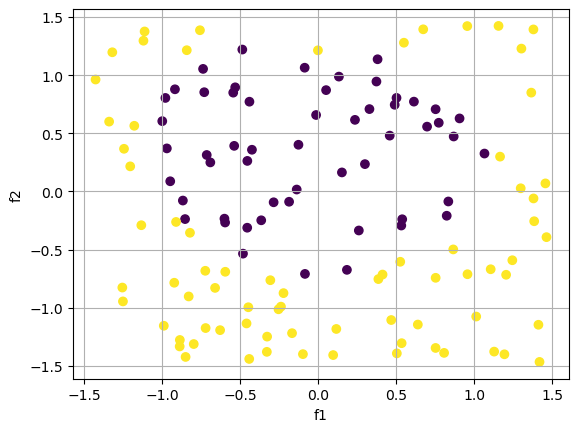

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


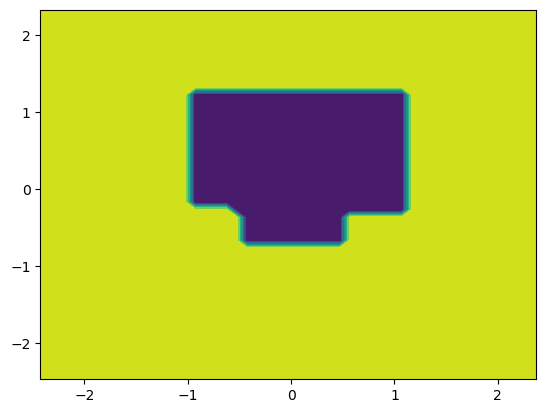

In [465]:
dBigTrain128 = dbig_tr[0:128]
dBigTrain128Root = Dtree(dBigTrain128)
node128 = visualise(dBigTrain128Root, 0, None)
print("Node count: ",node128)
ratio = predictions(dBigTrain128Root, dbig_ts)
correct  = sum(ratio[2]==dbig_ts[:,-1])
incorrect = len(dbig_ts)-correct
err128 = incorrect/(correct+incorrect)
error.append(err128)

# correct  = prediction[0]
# incorrect = prediction[1]

#Visualise and print Nodes, Accuracy Score
print("Accuracy :" , correct/(correct+incorrect), err128)


plt.scatter(dBigTrain128[:,0],dBigTrain128[:,1], c=dBigTrain128[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
plt.grid(True)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(dBigTrain32.iloc[:,0],dBigTrain32.iloc[:,1],dBigTrain32.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
plt.show()
plot_contourf(dBigTrain128[:,:-1], dBigTrain128[:,-1], dBigTrain128Root)

feat 0  split -1.475915  grainRatio 0.0772221110256988
feat 0  split -1.451751  grainRatio 0.08552623217353962
feat 0  split -1.450329  grainRatio 0.09131073433797252
feat 0  split -1.442056  grainRatio 0.09594422873094874
feat 0  split -1.428979  grainRatio 0.09989968232082554
feat 0  split -1.427526  grainRatio 0.10340230543939993
feat 0  split -1.41711  grainRatio 0.10657863148920467
feat 0  split -1.407825  grainRatio 0.10950749707989761
feat 0  split -1.389771  grainRatio 0.11224165321744847
feat 0  split -1.389399  grainRatio 0.1148182948915376
feat 0  split -1.384358  grainRatio 0.11726472391668608
feat 0  split -1.349386  grainRatio 0.11960162884519969
feat 0  split -1.340619  grainRatio 0.12184509797492553
feat 0  split -1.337215  grainRatio 0.1240079137291086
feat 0  split -1.326381  grainRatio 0.12610041747867423
feat 0  split -1.320248  grainRatio 0.12813110622534646
feat 0  split -1.316329  grainRatio 0.13010705568786884
feat 0  split -1.315767  grainRatio 0.13203422744285

feat 0  split 0.111802  grainRatio 0.00029145031781391327
feat 0  split 0.116355  grainRatio 0.00042620761605233925
feat 0  split 0.121315  grainRatio 0.0005866038567155888
feat 0  split 0.129404  grainRatio 0.0007727224059828261
feat 0  split 0.132267  grainRatio 0.0009846651034078192
feat 0  split 0.144219  grainRatio 0.0012225524135882975
feat 0  split 0.147016  grainRatio 0.0014865236084818751
feat 0  split 0.151599  grainRatio 0.0017767369809083091
feat 0  split 0.15268  grainRatio 0.0020933700898617415
feat 0  split 0.152742  grainRatio 0.002436620038369346
feat 0  split 0.183591  grainRatio 0.0028067037847221477
feat 0  split 0.184303  grainRatio 0.003203858488023277
feat 0  split 0.19636  grainRatio 0.003628341889102784
feat 0  split 0.199238  grainRatio 0.0040804327279701045
feat 0  split 0.205969  grainRatio 0.004560431199096632
feat 0  split 0.21747  grainRatio 0.005068659445951559
feat 0  split 0.222784  grainRatio 0.005605462096350882
feat 0  split 0.224809  grainRatio 0.0

feat 0  split 0.697379  grainRatio 0.009174986094975586
feat 0  split 0.706948  grainRatio 0.009011155945169201
feat 0  split 0.712346  grainRatio 0.008847753497680948
feat 0  split 0.72155  grainRatio 0.008684641403596368
feat 0  split 0.729243  grainRatio 0.008521671708905323
feat 0  split 0.752136  grainRatio 0.008358683894088607
feat 0  split 0.759357  grainRatio 0.008195502492943206
feat 0  split 0.772302  grainRatio 0.008031934173064116
feat 0  split 0.784121  grainRatio 0.007867764120023928
feat 0  split 0.788976  grainRatio 0.007702751510092404
feat 0  split 0.82333  grainRatio 0.007536623774002614
feat 0  split 0.833673  grainRatio 0.007369069233516188
feat 0  split 0.851538  grainRatio 0.007199727511825448
feat 0  split 0.859516  grainRatio 0.007028176842240095
feat 0  split 0.862749  grainRatio 0.006853916965344967
feat 0  split 0.868018  grainRatio 0.006676345603300283
feat 0  split 0.869453  grainRatio 0.006494725329123722
feat 0  split 0.888303  grainRatio 0.0063081356200

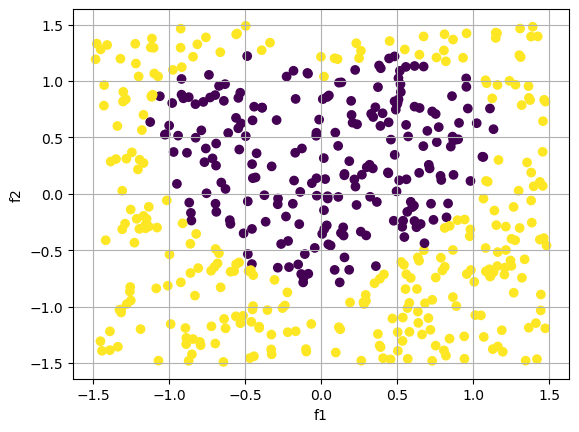

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


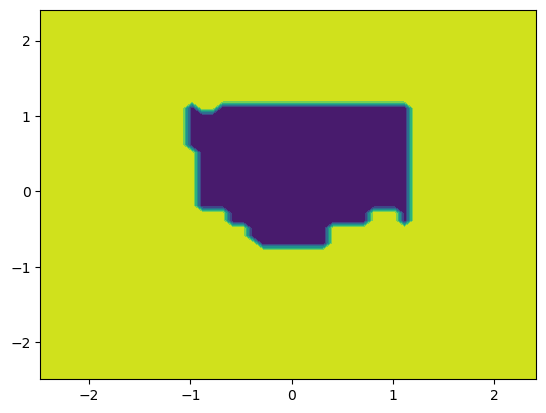

In [466]:
dBigTrain512 = dbig_tr[0:512]
dBigTrain512Root = Dtree(dBigTrain512)
node512 = visualise(dBigTrain512Root, 0, None)
print("Node count: ",node512)
ratio = predictions(dBigTrain512Root, dbig_ts)
correct  = sum(ratio[2]==dbig_ts[:,-1])
incorrect = len(dbig_ts)-correct
err512 = incorrect/(correct+incorrect)
error.append(err512)
# correct  = prediction[0]
# incorrect = prediction[1]

#Visualise and print Nodes, Accuracy Score
print("Accuracy :" , correct/(correct+incorrect), err512)


plt.scatter(dBigTrain512[:,0],dBigTrain512[:,1], c=dBigTrain512[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
plt.grid(True)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(dBigTrain32.iloc[:,0],dBigTrain32.iloc[:,1],dBigTrain32.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
plt.show()
plot_contourf(dBigTrain512[:,:-1], dBigTrain512[:,-1], dBigTrain512Root)

feat 0  split -1.49888  grainRatio 0.059419376050806105
feat 0  split -1.498142  grainRatio 0.06463492818743224
feat 0  split -1.493254  grainRatio 0.06814134059763707
feat 0  split -1.488037  grainRatio 0.07087487698647398
feat 0  split -1.486455  grainRatio 0.07315555725881265
feat 0  split -1.485485  grainRatio 0.07513463650394528
feat 0  split -1.484234  grainRatio 0.07689661429881398
feat 0  split -1.484117  grainRatio 0.07849389462377751
feat 0  split -1.483808  grainRatio 0.07996140479556318
feat 0  split -1.483188  grainRatio 0.08132368852841541
feat 0  split -1.482934  grainRatio 0.08259870698076065
feat 0  split -1.482072  grainRatio 0.08380003344179356
feat 0  split -1.481382  grainRatio 0.08493819655793494
feat 0  split -1.47815  grainRatio 0.08602154188584508
feat 0  split -1.475915  grainRatio 0.08705680622720242
feat 0  split -1.473025  grainRatio 0.08804951307324536
feat 0  split -1.472859  grainRatio 0.08900425246903554
feat 0  split -1.46803  grainRatio 0.089924883826

feat 0  split 0.807216  grainRatio 0.09098575280306437
feat 0  split 0.807892  grainRatio 0.09062640980616583
feat 0  split 0.808171  grainRatio 0.09182264248264585
feat 0  split 0.810305  grainRatio 0.09146230732639798
feat 0  split 0.81035  grainRatio 0.09110227588424466
feat 0  split 0.811319  grainRatio 0.09074254710065531
feat 0  split 0.812103  grainRatio 0.09038311992819227
feat 0  split 0.812117  grainRatio 0.09002399332758113
feat 0  split 0.813194  grainRatio 0.08966516626778576
feat 0  split 0.819043  grainRatio 0.08930663772608036
feat 0  split 0.819884  grainRatio 0.08894840668812765
feat 0  split 0.82007  grainRatio 0.08859047214805482
feat 0  split 0.821651  grainRatio 0.08823283310853461
feat 0  split 0.82333  grainRatio 0.08943050508330477
feat 0  split 0.824037  grainRatio 0.09064306920829054
feat 0  split 0.825893  grainRatio 0.09028307828337538
feat 0  split 0.829102  grainRatio 0.08992337182487607
feat 0  split 0.82911  grainRatio 0.08956394878556978
feat 0  split 

feat 1  split -0.058461  grainRatio 0.08357454548790658
feat 1  split -0.057106  grainRatio 0.08396601291083715
feat 1  split -0.055791  grainRatio 0.08333892221913411
feat 1  split -0.054928  grainRatio 0.08271486273941353
feat 1  split -0.049269  grainRatio 0.08209382049204879
feat 1  split -0.043432  grainRatio 0.0814757816419623
feat 1  split -0.043102  grainRatio 0.08186338374475173
feat 1  split -0.042295  grainRatio 0.08225214445230206
feat 1  split -0.042153  grainRatio 0.08163458050853567
feat 1  split -0.042101  grainRatio 0.08101999048007151
feat 1  split -0.041723  grainRatio 0.08040836096626248
feat 1  split -0.041562  grainRatio 0.07979967870443849
feat 1  split -0.038902  grainRatio 0.07919393056838192
feat 1  split -0.03859  grainRatio 0.07957755774039521
feat 1  split -0.038372  grainRatio 0.07897346824231236
feat 1  split -0.036522  grainRatio 0.07837228592121594
feat 1  split -0.035177  grainRatio 0.07777399805609483
feat 1  split -0.033757  grainRatio 0.077178592056

feat 0  split -0.555105  grainRatio 0.029398995115045973
feat 0  split -0.554209  grainRatio 0.028924379871542664
feat 0  split -0.553543  grainRatio 0.02845489850237727
feat 0  split -0.551606  grainRatio 0.028811273641344438
feat 0  split -0.545801  grainRatio 0.028344179889260898
feat 0  split -0.54514  grainRatio 0.02788213743723621
feat 0  split -0.544457  grainRatio 0.02742510497872081
feat 0  split -0.54173  grainRatio 0.026973041759493166
feat 0  split -0.540127  grainRatio 0.027320389405933617
feat 0  split -0.539819  grainRatio 0.027669509687889504
feat 0  split -0.539002  grainRatio 0.02721700288289428
feat 0  split -0.535193  grainRatio 0.026769389196184216
feat 0  split -0.532466  grainRatio 0.026326629541730717
feat 0  split -0.527202  grainRatio 0.025888685349227895
feat 0  split -0.526186  grainRatio 0.02545551855588782
feat 0  split -0.521141  grainRatio 0.025027091598408935
feat 0  split -0.519341  grainRatio 0.0246033674051093
feat 0  split -0.515748  grainRatio 0.02

feat 1  split -0.156045  grainRatio 0.029225365963036615
feat 1  split -0.155852  grainRatio 0.028764032821869866
feat 1  split -0.154843  grainRatio 0.029119313203106314
feat 1  split -0.151866  grainRatio 0.028660181563474045
feat 1  split -0.151731  grainRatio 0.02901460161858607
feat 1  split -0.14889  grainRatio 0.029370784478635104
feat 1  split -0.14684  grainRatio 0.0297287270386248
feat 1  split -0.146401  grainRatio 0.029266549836049035
feat 1  split -0.145818  grainRatio 0.029623648856704356
feat 1  split -0.144354  grainRatio 0.029163632051569657
feat 1  split -0.14023  grainRatio 0.028708339148515307
feat 1  split -0.140119  grainRatio 0.02906201405851871
feat 1  split -0.138928  grainRatio 0.029417457764680632
feat 1  split -0.138051  grainRatio 0.029774667418420577
feat 1  split -0.136835  grainRatio 0.030133640259759398
feat 1  split -0.136035  grainRatio 0.02967271161636162
feat 1  split -0.134207  grainRatio 0.029216440940690563
feat 1  split -0.132994  grainRatio 0.0

feat 0  split -0.379145  grainRatio 0.051555634824405075
feat 0  split -0.378984  grainRatio 0.0510378606060193
feat 0  split -0.377345  grainRatio 0.0516632561574854
feat 0  split -0.374661  grainRatio 0.051146002980703396
feat 0  split -0.373662  grainRatio 0.050632160101426765
feat 0  split -0.372552  grainRatio 0.05012170794942612
feat 0  split -0.372076  grainRatio 0.049614627168721726
feat 0  split -0.371289  grainRatio 0.049110898615194416
feat 0  split -0.371288  grainRatio 0.04861050335423307
feat 0  split -0.37081  grainRatio 0.04811342265842235
feat 0  split -0.370348  grainRatio 0.04761963800526471
feat 0  split -0.368553  grainRatio 0.04712913107494099
feat 0  split -0.365654  grainRatio 0.04773231161906362
feat 0  split -0.364017  grainRatio 0.047242168463246796
feat 0  split -0.358911  grainRatio 0.04675526787020879
feat 0  split -0.357554  grainRatio 0.046271592111091706
feat 0  split -0.354106  grainRatio 0.045791123650859
feat 0  split -0.353907  grainRatio 0.04531384

feat 1  split 0.732433  grainRatio 0.028411539436898992
feat 1  split 0.732811  grainRatio 0.028845268265995466
feat 1  split 0.733305  grainRatio 0.029283347286707638
feat 1  split 0.735396  grainRatio 0.02972581004042794
feat 1  split 0.736562  grainRatio 0.030172690504094997
feat 1  split 0.738923  grainRatio 0.03062402309670212
feat 1  split 0.74273  grainRatio 0.031079842685930694
feat 1  split 0.744334  grainRatio 0.03154018459491686
feat 1  split 0.744859  grainRatio 0.03200508460914657
feat 1  split 0.745483  grainRatio 0.03150184802460318
feat 1  split 0.74627  grainRatio 0.03196782620200314
feat 1  split 0.746679  grainRatio 0.03243843118860496
feat 1  split 0.748346  grainRatio 0.03291370021075135
feat 1  split 0.74976  grainRatio 0.03339367098696196
feat 1  split 0.752951  grainRatio 0.03387838173556483
feat 1  split 0.753653  grainRatio 0.03436787118247993
feat 1  split 0.755142  grainRatio 0.03486217856916287
feat 1  split 0.755625  grainRatio 0.03536134366070892
feat 1  

feat 1  split -0.606691  grainRatio 0.1215667457745806
feat 1  split -0.604568  grainRatio 0.12306755996761352
feat 1  split -0.603195  grainRatio 0.12456796093867419
feat 1  split -0.593198  grainRatio 0.12203772809425839
feat 1  split -0.590698  grainRatio 0.12352881462757127
feat 1  split -0.588412  grainRatio 0.12501965826221498
feat 1  split -0.586676  grainRatio 0.12651026951076538
feat 1  split -0.582019  grainRatio 0.12401026220680897
feat 1  split -0.580881  grainRatio 0.12156505649285596
feat 1  split -0.579937  grainRatio 0.12303807338783922
feat 1  split -0.577866  grainRatio 0.12063714766956454
feat 1  split -0.577068  grainRatio 0.11828768307928166
feat 1  split -0.576102  grainRatio 0.11598817593587944
feat 1  split -0.573915  grainRatio 0.11743472447089444
feat 1  split -0.572141  grainRatio 0.1188817432936137
feat 1  split -0.57107  grainRatio 0.1203292334008025
feat 1  split -0.568269  grainRatio 0.11805149440926355
feat 1  split -0.566868  grainRatio 0.11949079741494

feat 0  split 0.674387  grainRatio 0.06197324464376454
feat 0  split 0.674853  grainRatio 0.06049846024170132
feat 0  split 0.678575  grainRatio 0.05903441856183118
feat 0  split 0.67888  grainRatio 0.05998189502809347
feat 0  split 0.680146  grainRatio 0.05851720639698772
feat 0  split 0.684929  grainRatio 0.05706341185535525
feat 0  split 0.684934  grainRatio 0.05562063963743953
feat 0  split 0.687464  grainRatio 0.054189023876619384
feat 0  split 0.687548  grainRatio 0.05510388092796465
feat 0  split 0.68833  grainRatio 0.05367162794862415
feat 0  split 0.693987  grainRatio 0.05458870042443411
feat 0  split 0.697379  grainRatio 0.05552018504320335
feat 0  split 0.700903  grainRatio 0.05646635120569443
feat 0  split 0.701488  grainRatio 0.05742747510463673
feat 0  split 0.702842  grainRatio 0.058403839940001236
feat 0  split 0.703588  grainRatio 0.05939573614267467
feat 0  split 0.706948  grainRatio 0.0604034616069264
feat 0  split 0.712252  grainRatio 0.06142732193209031
feat 0  spl

feat 0  split 0.557719  grainRatio 0.04514088638863402
feat 0  split 0.558052  grainRatio 0.04576420351847855
feat 0  split 0.559892  grainRatio 0.0463952822553137
feat 0  split 0.565303  grainRatio 0.047034238578627624
feat 0  split 0.566618  grainRatio 0.047681190823090074
feat 0  split 0.570696  grainRatio 0.04833625973734637
feat 0  split 0.571174  grainRatio 0.04664296547128929
feat 0  split 0.57286  grainRatio 0.0472939591401392
feat 0  split 0.573591  grainRatio 0.047953247844431966
feat 0  split 0.579185  grainRatio 0.04625843941332084
feat 0  split 0.582268  grainRatio 0.046913629420898266
feat 0  split 0.588431  grainRatio 0.04757729961456868
feat 0  split 0.592421  grainRatio 0.04824958251847468
feat 0  split 0.595096  grainRatio 0.04893061345951556
feat 0  split 0.598093  grainRatio 0.049620530640407126
feat 0  split 0.599971  grainRatio 0.050319475215048745
feat 0  split 0.600341  grainRatio 0.0510275913662827
feat 0  split 0.602068  grainRatio 0.05174502638613594
feat 0  

feat 0  split 0.380163  grainRatio 0.005555394521322712
feat 0  split 0.385306  grainRatio 0.005704294805347204
feat 0  split 0.388792  grainRatio 0.005855641864433808
feat 0  split 0.391241  grainRatio 0.006009459879153064
feat 0  split 0.393003  grainRatio 0.0061657734382081384
feat 0  split 0.394343  grainRatio 0.006324607545836018
feat 0  split 0.403179  grainRatio 0.006485987629377409
feat 0  split 0.403457  grainRatio 0.006649939547020938
feat 0  split 0.403669  grainRatio 0.006816489595724141
feat 0  split 0.404849  grainRatio 0.00698566451931819
feat 0  split 0.405947  grainRatio 0.007157491516798396
feat 0  split 0.406125  grainRatio 0.007331998250808068
feat 0  split 0.406467  grainRatio 0.0075092128563205044
feat 0  split 0.41014  grainRatio 0.007689163949521647
feat 0  split 0.414294  grainRatio 0.007871880636901822
feat 0  split 0.414429  grainRatio 0.008057392524562265
feat 0  split 0.418537  grainRatio 0.008245729727737258
feat 0  split 0.419237  grainRatio 0.00843692288

feat 0  split 0.98088  grainRatio 0.06548897387974809
feat 0  split 0.995138  grainRatio 0.07175889196793035
feat 0  split 0.996485  grainRatio 0.07877592764505939
feat 0  split 1.005493  grainRatio 0.0702911488693591
feat 0  split 1.005865  grainRatio 0.06170548070744861
feat 0  split 1.007646  grainRatio 0.06877408436263865
feat 0  split 1.007708  grainRatio 0.07685350709810573
feat 0  split 1.010951  grainRatio 0.08614689040012614
feat 0  split 1.019083  grainRatio 0.09691489646725189
feat 0  split 1.020438  grainRatio 0.08621247366584835
feat 0  split 1.021825  grainRatio 0.09828245783551309
feat 0  split 1.02535  grainRatio 0.1126595216360865
feat 0  split 1.028892  grainRatio 0.10039422911306478
feat 0  split 1.02947  grainRatio 0.08752859022650647
feat 0  split 1.032036  grainRatio 0.07405396544779909
feat 0  split 1.034398  grainRatio 0.08923091703656078
feat 0  split 1.043962  grainRatio 0.07395694054767998
feat 0  split 1.044529  grainRatio 0.05784313457214806
feat 0  split 1

feat 1  split -0.318475  grainRatio 0.16394189783795665
feat 1  split -0.317698  grainRatio 0.16223198852521784
feat 1  split -0.315799  grainRatio 0.16054546577855475
feat 1  split -0.315639  grainRatio 0.16432807159779195
feat 1  split -0.313431  grainRatio 0.16264563621712735
feat 1  split -0.313082  grainRatio 0.1609857859603745
feat 1  split -0.311764  grainRatio 0.15934808616725935
feat 1  split -0.309138  grainRatio 0.1577321132799288
feat 1  split -0.306954  grainRatio 0.1561374544868969
feat 1  split -0.305535  grainRatio 0.15986440020390186
feat 1  split -0.303026  grainRatio 0.15827245389294864
feat 1  split -0.302242  grainRatio 0.16201941193526698
feat 1  split -0.299513  grainRatio 0.16580519430514604
feat 1  split -0.298359  grainRatio 0.16963046195422762
feat 1  split -0.298246  grainRatio 0.1680055622529465
feat 1  split -0.297475  grainRatio 0.16640118656935773
feat 1  split -0.297186  grainRatio 0.16481696127933018
feat 1  split -0.296734  grainRatio 0.16325252178960

feat 0  split -0.918754  grainRatio 0.03316919052652975
feat 0  split -0.918731  grainRatio 0.031677114078764515
feat 0  split -0.917825  grainRatio 0.030263816378516887
feat 0  split -0.917009  grainRatio 0.02892392503279791
feat 0  split -0.917001  grainRatio 0.03544951206090192
feat 0  split -0.911604  grainRatio 0.033998048304543456
feat 0  split -0.906589  grainRatio 0.040670008251634956
feat 0  split -0.903972  grainRatio 0.03911840366393696
feat 0  split -0.897207  grainRatio 0.037638362210488115
feat 0  split -0.883024  grainRatio 0.03622554691122276
feat 0  split -0.881184  grainRatio 0.03487595499843114
feat 0  split -0.88046  grainRatio 0.03358588675235168
feat 0  split -0.877873  grainRatio 0.03975628439385768
feat 0  split -0.876233  grainRatio 0.038379876361512896
feat 0  split -0.871925  grainRatio 0.04467207197236689
feat 0  split -0.871352  grainRatio 0.04321693724596753
feat 0  split -0.871244  grainRatio 0.041819744029962455
feat 0  split -0.867961  grainRatio 0.0404

feat 1  split -0.100304  grainRatio 0.04074840023375402
feat 1  split -0.099254  grainRatio 0.04017762414221347
feat 1  split -0.099189  grainRatio 0.039616345159708806
feat 1  split -0.098383  grainRatio 0.039064346512272884
feat 1  split -0.093039  grainRatio 0.03852141787729606
feat 1  split -0.089303  grainRatio 0.03798735514825579
feat 1  split -0.088489  grainRatio 0.037461960209614134
feat 1  split -0.08819  grainRatio 0.03694504072137335
feat 1  split -0.088081  grainRatio 0.03643640991281411
feat 1  split -0.086125  grainRatio 0.03593588638496343
feat 1  split -0.081829  grainRatio 0.035443293921364166
feat 1  split -0.080839  grainRatio 0.03495846130674663
feat 1  split -0.079918  grainRatio 0.03448122215321854
feat 1  split -0.07812  grainRatio 0.03401141473361502
feat 1  split -0.077775  grainRatio 0.033548881821667834
feat 1  split -0.075949  grainRatio 0.03309347053867166
feat 1  split -0.075013  grainRatio 0.03264503220634197
feat 1  split -0.072514  grainRatio 0.0322034

feat 0  split -0.120974  grainRatio 0.0006991257516891233
feat 0  split -0.116614  grainRatio 0.0006713348108071657
feat 0  split -0.112343  grainRatio 0.0006441456335730481
feat 0  split -0.111482  grainRatio 0.0006175550092238086
feat 0  split -0.107484  grainRatio 0.0005915598047447898
feat 0  split -0.092532  grainRatio 0.0005661569640276848
feat 0  split -0.09117  grainRatio 0.0005413435070495717
feat 0  split -0.090865  grainRatio 0.0005171165290762062
feat 0  split -0.087135  grainRatio 0.0004934731998872321
feat 0  split -0.0856  grainRatio 0.00047041076302322505
feat 0  split -0.085282  grainRatio 0.00044792653505472386
feat 0  split -0.083905  grainRatio 0.00042601790487273284
feat 0  split -0.082718  grainRatio 0.00040468233300053054
feat 0  split -0.082275  grainRatio 0.0003839173509248337
feat 0  split -0.082079  grainRatio 0.0003637205604491381
feat 0  split -0.081875  grainRatio 0.00034408963306534445
feat 0  split -0.081657  grainRatio 0.0003250223093465037
feat 0  spli

feat 0  split -0.640352  grainRatio 0.008012074252263687
feat 0  split -0.636066  grainRatio 0.00786911478962952
feat 0  split -0.635048  grainRatio 0.007728956406035651
feat 0  split -0.634468  grainRatio 0.0075915261893907335
feat 0  split -0.632461  grainRatio 0.007456753705037754
feat 0  split -0.632151  grainRatio 0.007324570893063446
feat 0  split -0.629592  grainRatio 0.007194911970641772
feat 0  split -0.626625  grainRatio 0.007067713339125207
feat 0  split -0.622222  grainRatio 0.006942913495622533
feat 0  split -0.622064  grainRatio 0.006820452948807955
feat 0  split -0.617679  grainRatio 0.0067002741387335715
feat 0  split -0.616709  grainRatio 0.006582321360422606
feat 0  split -0.614019  grainRatio 0.006466540691038661
feat 0  split -0.61185  grainRatio 0.006352879920440591
feat 0  split -0.60866  grainRatio 0.0062412884849370855
feat 0  split -0.607079  grainRatio 0.006131717404076877
feat 0  split -0.603714  grainRatio 0.006024119220309071
feat 0  split -0.602649  grainR

feat 0  split 0.740022  grainRatio 0.29547246126013865
feat 0  split 0.75497  grainRatio 0.3495686805894223
feat 0  split 0.773685  grainRatio 0.42229469885405824
feat 0  split 0.811319  grainRatio 0.5420821085302808
feat 0  split 0.836712  grainRatio 0.5171826227317414
feat 0  split 0.844093  grainRatio 0.49272620623784513
feat 0  split 0.856258  grainRatio 0.4685213994560798
feat 0  split 0.895697  grainRatio 0.44434952602151356
feat 0  split 0.927203  grainRatio 0.4199401051506923
feat 0  split 0.931043  grainRatio 0.3949276863720298
feat 0  split 0.942443  grainRatio 0.36876566197515215
feat 0  split 0.942968  grainRatio 0.34052576249296657
feat 0  split 0.975941  grainRatio 0.3083171167625467
feat 0  split 0.980188  grainRatio 0.266787812920992
feat 1  split -0.39989  grainRatio 0.04632361634512208
feat 1  split -0.397303  grainRatio 0.05321170023172596
feat 1  split -0.396526  grainRatio 0.05840112666345374
feat 1  split -0.393753  grainRatio 0.06282945212499993
feat 1  split -0.

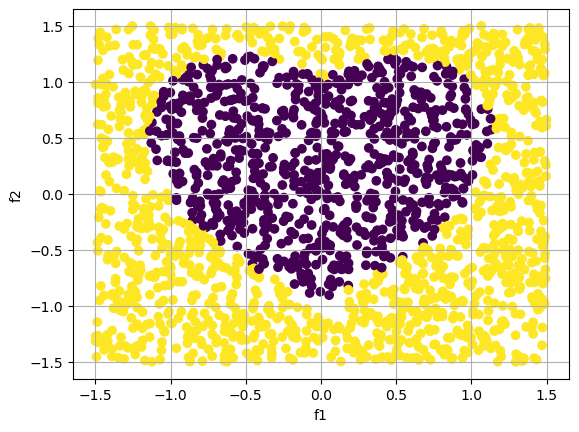

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


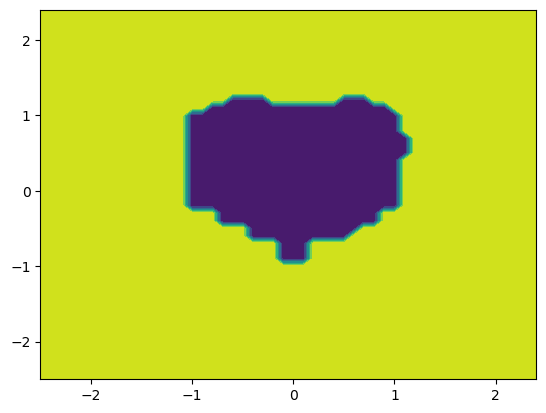

In [467]:
dBigTrain2048 = dbig_tr[0:2048]
dBigTrain2048Root = Dtree(dBigTrain2048)
node2048 = visualise(dBigTrain2048Root, 0, None)
print("Node count: ",node2048)
ratio = predictions(dBigTrain2048Root, dbig_ts)
correct  = sum(ratio[2]==dbig_ts[:,-1])
incorrect = len(dbig_ts)-correct
err2048 = incorrect/(correct+incorrect)
error.append(err2048)

# correct  = prediction[0]
# incorrect = prediction[1]

#Visualise and print Nodes, Accuracy Score
print("Accuracy :" , correct/(correct+incorrect), err2048)


plt.scatter(dBigTrain2048[:,0],dBigTrain2048[:,1], c=dBigTrain2048[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
plt.grid(True)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(dBigTrain32.iloc[:,0],dBigTrain32.iloc[:,1],dBigTrain32.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
plt.show()
plot_contourf(dBigTrain2048[:,:-1], dBigTrain2048[:,-1], dBigTrain2048Root)

feat 0  split -1.499224  grainRatio 0.051238782223730885
feat 0  split -1.49888  grainRatio 0.05505520403922999
feat 0  split -1.498383  grainRatio 0.05756496089965242
feat 0  split -1.498293  grainRatio 0.059490300983309416
feat 0  split -1.498142  grainRatio 0.061075729051037524
feat 0  split -1.497804  grainRatio 0.062436039426442935
feat 0  split -1.497497  grainRatio 0.06363502749735879
feat 0  split -1.497494  grainRatio 0.06471208543442833
feat 0  split -1.497064  grainRatio 0.06569337034110595
feat 0  split -1.496801  grainRatio 0.0665972029179923
feat 0  split -1.495546  grainRatio 0.06743695119733034
feat 0  split -1.495352  grainRatio 0.06822269082649791
feat 0  split -1.494591  grainRatio 0.0689622186061254
feat 0  split -1.494011  grainRatio 0.0696617010551021
feat 0  split -1.493574  grainRatio 0.07032610582987146
feat 0  split -1.493254  grainRatio 0.07095949817500753
feat 0  split -1.492381  grainRatio 0.07156525033730472
feat 0  split -1.49234  grainRatio 0.07214619306

feat 0  split -1.323007  grainRatio 0.1392477867710284
feat 0  split -1.322405  grainRatio 0.13933932216251246
feat 0  split -1.321894  grainRatio 0.13943080098228766
feat 0  split -1.321844  grainRatio 0.1395222235077511
feat 0  split -1.321497  grainRatio 0.1396135900147399
feat 0  split -1.32147  grainRatio 0.13970490077754277
feat 0  split -1.321316  grainRatio 0.13979615606891324
feat 0  split -1.320644  grainRatio 0.1398873561600818
feat 0  split -1.320484  grainRatio 0.13997850132076614
feat 0  split -1.320248  grainRatio 0.1400695918191864
feat 0  split -1.319917  grainRatio 0.14016062792207432
feat 0  split -1.319915  grainRatio 0.1402516098946841
feat 0  split -1.319567  grainRatio 0.1403425380008066
feat 0  split -1.319151  grainRatio 0.14043341250278005
feat 0  split -1.318679  grainRatio 0.14052423366149916
feat 0  split -1.31815  grainRatio 0.14061500173642857
feat 0  split -1.317845  grainRatio 0.1407057169856123
feat 0  split -1.317818  grainRatio 0.1407963796656876
fea

feat 0  split -1.138472  grainRatio 0.18053390191322563
feat 0  split -1.138432  grainRatio 0.18061544697795628
feat 0  split -1.138188  grainRatio 0.17810217289758767
feat 0  split -1.138076  grainRatio 0.17818504713146147
feat 0  split -1.138029  grainRatio 0.1782679186260914
feat 0  split -1.137697  grainRatio 0.17835078743647204
feat 0  split -1.137204  grainRatio 0.1784336536174714
feat 0  split -1.136455  grainRatio 0.17851651722383002
feat 0  split -1.136089  grainRatio 0.1785993783101615
feat 0  split -1.135754  grainRatio 0.17868223693095364
feat 0  split -1.135581  grainRatio 0.17876509314056963
feat 0  split -1.135491  grainRatio 0.17673077626889755
feat 0  split -1.135363  grainRatio 0.17681462156143118
feat 0  split -1.134888  grainRatio 0.17689846277495833
feat 0  split -1.134266  grainRatio 0.17698229996819045
feat 0  split -1.134165  grainRatio 0.1770661331996975
feat 0  split -1.133903  grainRatio 0.17714996252790913
feat 0  split -1.133419  grainRatio 0.17723378801111

feat 0  split -0.959658  grainRatio 0.11586470484221846
feat 0  split -0.958437  grainRatio 0.1159616971353085
feat 0  split -0.956785  grainRatio 0.11605868625432335
feat 0  split -0.956772  grainRatio 0.11615567224476456
feat 0  split -0.956762  grainRatio 0.11625265515208953
feat 0  split -0.955861  grainRatio 0.11634963502171189
feat 0  split -0.955301  grainRatio 0.11583830103645501
feat 0  split -0.955215  grainRatio 0.11532954789728979
feat 0  split -0.954887  grainRatio 0.11542646806346676
feat 0  split -0.954844  grainRatio 0.11492024289909472
feat 0  split -0.954592  grainRatio 0.11441655218821023
feat 0  split -0.954496  grainRatio 0.11451340846658067
feat 0  split -0.954054  grainRatio 0.1140121979424482
feat 0  split -0.953606  grainRatio 0.11351347697394769
feat 0  split -0.953439  grainRatio 0.11301722418589524
feat 0  split -0.952888  grainRatio 0.1131139782335203
feat 0  split -0.952817  grainRatio 0.11262013725583196
feat 0  split -0.952627  grainRatio 0.1121287216578

feat 0  split -0.785042  grainRatio 0.0681395553673212
feat 0  split -0.7847  grainRatio 0.06822312529666658
feat 0  split -0.782952  grainRatio 0.06830671645808081
feat 0  split -0.782706  grainRatio 0.06805604680355994
feat 0  split -0.782399  grainRatio 0.06813955975291779
feat 0  split -0.781718  grainRatio 0.06788956693872002
feat 0  split -0.781135  grainRatio 0.06764034752851171
feat 0  split -0.780918  grainRatio 0.06739189865551867
feat 0  split -0.780578  grainRatio 0.0671442174704667
feat 0  split -0.779319  grainRatio 0.06722735264131337
feat 0  split -0.779171  grainRatio 0.06698033612337241
feat 0  split -0.779165  grainRatio 0.06706339288411298
feat 0  split -0.779163  grainRatio 0.06714647142675866
feat 0  split -0.778264  grainRatio 0.06722957175448434
feat 0  split -0.778254  grainRatio 0.06731269387052748
feat 0  split -0.778152  grainRatio 0.06706603871744218
feat 0  split -0.777798  grainRatio 0.06714908271855896
feat 0  split -0.777688  grainRatio 0.06690308593580

feat 0  split -0.625224  grainRatio 0.037884234813797005
feat 0  split -0.624284  grainRatio 0.03774188179299849
feat 0  split -0.622495  grainRatio 0.037806680491477555
feat 0  split -0.622494  grainRatio 0.03787151750397405
feat 0  split -0.622222  grainRatio 0.03772933228636263
feat 0  split -0.622064  grainRatio 0.03758751986247794
feat 0  split -0.621838  grainRatio 0.037446079387385076
feat 0  split -0.621789  grainRatio 0.0373050100193282
feat 0  split -0.621307  grainRatio 0.037164310919715136
feat 0  split -0.621181  grainRatio 0.03702398125310025
feat 0  split -0.621097  grainRatio 0.03688402018717038
feat 0  split -0.620695  grainRatio 0.03674442689272728
feat 0  split -0.619495  grainRatio 0.03680847857896818
feat 0  split -0.618839  grainRatio 0.03666914915596345
feat 0  split -0.618679  grainRatio 0.03653018582940895
feat 0  split -0.618449  grainRatio 0.03659407022831562
feat 0  split -0.618107  grainRatio 0.03665799350177856
feat 0  split -0.618101  grainRatio 0.0365191

feat 0  split -0.451509  grainRatio 0.018077811556740774
feat 0  split -0.451206  grainRatio 0.017995682501684405
feat 0  split -0.451133  grainRatio 0.01791377821415382
feat 0  split -0.450524  grainRatio 0.01783209836020577
feat 0  split -0.450311  grainRatio 0.01775064260686945
feat 0  split -0.44985  grainRatio 0.017795831878443163
feat 0  split -0.449162  grainRatio 0.017714502985305896
feat 0  split -0.448324  grainRatio 0.017759644285609062
feat 0  split -0.448286  grainRatio 0.01767844196141992
feat 0  split -0.448285  grainRatio 0.01759746274814144
feat 0  split -0.448268  grainRatio 0.017642459304978746
feat 0  split -0.448125  grainRatio 0.017687504842716344
feat 0  split -0.447768  grainRatio 0.017606554786617348
feat 0  split -0.44768  grainRatio 0.017525827187914924
feat 0  split -0.447393  grainRatio 0.017570728177835646
feat 0  split -0.4471  grainRatio 0.01761567819220566
feat 0  split -0.446945  grainRatio 0.017534979250992854
feat 0  split -0.44684  grainRatio 0.0174

feat 0  split -0.290945  grainRatio 0.0068015914802911645
feat 0  split -0.290865  grainRatio 0.006829667028747841
feat 0  split -0.290698  grainRatio 0.006857796987838605
feat 0  split -0.290477  grainRatio 0.006885981345984422
feat 0  split -0.290167  grainRatio 0.006840669552338365
feat 0  split -0.289744  grainRatio 0.006795519576430845
feat 0  split -0.289673  grainRatio 0.0067505312699585535
feat 0  split -0.289655  grainRatio 0.006705704485040819
feat 0  split -0.289544  grainRatio 0.006661039074218825
feat 0  split -0.289503  grainRatio 0.0066888234378351145
feat 0  split -0.289421  grainRatio 0.006644228394479167
feat 0  split -0.288939  grainRatio 0.006671976398074083
feat 0  split -0.28858  grainRatio 0.006699778889712877
feat 0  split -0.287435  grainRatio 0.006655163285930378
feat 0  split -0.287023  grainRatio 0.006610708633287227
feat 0  split -0.286988  grainRatio 0.006566414786050859
feat 0  split -0.286152  grainRatio 0.006593999393141042
feat 0  split -0.286093  grai

feat 0  split -0.11819  grainRatio 0.001330861051911447
feat 0  split -0.117864  grainRatio 0.0013121215831338254
feat 0  split -0.117686  grainRatio 0.0012935172916211943
feat 0  split -0.117682  grainRatio 0.0013057724134852922
feat 0  split -0.117445  grainRatio 0.0012872160069239368
feat 0  split -0.116621  grainRatio 0.0012994409405378473
feat 0  split -0.116614  grainRatio 0.0012809323778485105
feat 0  split -0.11632  grainRatio 0.0012625588266867904
feat 0  split -0.116297  grainRatio 0.0012443202298546288
feat 0  split -0.116121  grainRatio 0.0012563405771424882
feat 0  split -0.116061  grainRatio 0.001238149676452572
feat 0  split -0.115414  grainRatio 0.001220093620120001
feat 0  split -0.114764  grainRatio 0.0012319966469543234
feat 0  split -0.114464  grainRatio 0.001213988193690436
feat 0  split -0.113386  grainRatio 0.0012258611163833643
feat 0  split -0.113008  grainRatio 0.0012079002263049683
feat 0  split -0.112618  grainRatio 0.0011900740192991365
feat 0  split -0.112

feat 0  split 0.03624  grainRatio 0.00014726711552647662
feat 0  split 0.036619  grainRatio 0.00015348004508470257
feat 0  split 0.036687  grainRatio 0.0001598214163212197
feat 0  split 0.036713  grainRatio 0.0001662912367398096
feat 0  split 0.037022  grainRatio 0.00017288951405956352
feat 0  split 0.037313  grainRatio 0.00017961625621489068
feat 0  split 0.038026  grainRatio 0.00018647147135563845
feat 0  split 0.038082  grainRatio 0.00019345516784654605
feat 0  split 0.038432  grainRatio 0.00020056735426814219
feat 0  split 0.038702  grainRatio 0.00020780803941564447
feat 0  split 0.038772  grainRatio 0.00020294346305915287
feat 0  split 0.038999  grainRatio 0.00021022668289771262
feat 0  split 0.03911  grainRatio 0.00021763842023073495
feat 0  split 0.039679  grainRatio 0.00022517868450113219
feat 0  split 0.039965  grainRatio 0.0002201138220311248
feat 0  split 0.040525  grainRatio 0.00021510658884959954
feat 0  split 0.040775  grainRatio 0.00022260344458618642
feat 0  split 0.041

feat 0  split 0.194856  grainRatio 0.0041207337371522625
feat 0  split 0.194989  grainRatio 0.004154191192619271
feat 0  split 0.195494  grainRatio 0.0041324316632769115
feat 0  split 0.195552  grainRatio 0.0041107282185793475
feat 0  split 0.195564  grainRatio 0.004144152152057005
feat 0  split 0.195648  grainRatio 0.004122417812624442
feat 0  split 0.195688  grainRatio 0.004155895246385983
feat 0  split 0.19636  grainRatio 0.004189513239813682
feat 0  split 0.196471  grainRatio 0.004223271871356884
feat 0  split 0.196847  grainRatio 0.004257171219744769
feat 0  split 0.198012  grainRatio 0.004291211363987825
feat 0  split 0.198166  grainRatio 0.004325392383376191
feat 0  split 0.198691  grainRatio 0.004359714357480909
feat 0  split 0.198905  grainRatio 0.0043941773661556344
feat 0  split 0.199238  grainRatio 0.00442878148953463
feat 0  split 0.199614  grainRatio 0.0044635268080357145
feat 0  split 0.199765  grainRatio 0.004440978517112211
feat 0  split 0.199908  grainRatio 0.00447577

feat 0  split 0.352537  grainRatio 0.012486938174660202
feat 0  split 0.35306  grainRatio 0.012549364707876487
feat 0  split 0.354212  grainRatio 0.012611966161696686
feat 0  split 0.354443  grainRatio 0.012674742720017791
feat 0  split 0.354918  grainRatio 0.012636946774769451
feat 0  split 0.35521  grainRatio 0.012699808365553351
feat 0  split 0.355302  grainRatio 0.012661974458086051
feat 0  split 0.355629  grainRatio 0.012724921239500392
feat 0  split 0.355691  grainRatio 0.012687049329619367
feat 0  split 0.356254  grainRatio 0.012750081460301
feat 0  split 0.356292  grainRatio 0.01281328942887076
feat 0  split 0.356687  grainRatio 0.01277528914678529
feat 0  split 0.357115  grainRatio 0.01283858280779474
feat 0  split 0.358126  grainRatio 0.012800544418171977
feat 0  split 0.35837  grainRatio 0.012863923931740441
feat 0  split 0.358612  grainRatio 0.012825847394071443
feat 0  split 0.359098  grainRatio 0.01288931292079367
feat 0  split 0.359245  grainRatio 0.012952955027367754
fe

feat 0  split 0.516714  grainRatio 0.026229641483303714
feat 0  split 0.516819  grainRatio 0.026331738254153723
feat 0  split 0.517412  grainRatio 0.026434085203811516
feat 0  split 0.517427  grainRatio 0.026380030095278673
feat 0  split 0.517959  grainRatio 0.026482532296923822
feat 0  split 0.518473  grainRatio 0.026428427587798235
feat 0  split 0.518817  grainRatio 0.026374368620589343
feat 0  split 0.519044  grainRatio 0.026476931052625313
feat 0  split 0.519184  grainRatio 0.026422822393888552
feat 0  split 0.519245  grainRatio 0.026525540811927886
feat 0  split 0.519808  grainRatio 0.026628511069253635
feat 0  split 0.520032  grainRatio 0.026731733578849864
feat 0  split 0.520173  grainRatio 0.026835208754955667
feat 0  split 0.520918  grainRatio 0.02693893701307139
feat 0  split 0.52094  grainRatio 0.027042918769962752
feat 0  split 0.52097  grainRatio 0.027147154443665264
feat 0  split 0.5221  grainRatio 0.02725164445348921
feat 0  split 0.522378  grainRatio 0.02719681788495682

feat 0  split 0.665189  grainRatio 0.05094260706737436
feat 0  split 0.665471  grainRatio 0.050869718889336654
feat 0  split 0.666509  grainRatio 0.05104275947798342
feat 0  split 0.666539  grainRatio 0.05096980731966537
feat 0  split 0.666649  grainRatio 0.05114318669713158
feat 0  split 0.666789  grainRatio 0.05131700408229523
feat 0  split 0.667529  grainRatio 0.05149126057736539
feat 0  split 0.66825  grainRatio 0.05141804826070192
feat 0  split 0.668418  grainRatio 0.05159264699117703
feat 0  split 0.668503  grainRatio 0.051519370546112
feat 0  split 0.668614  grainRatio 0.05169431266573049
feat 0  split 0.669116  grainRatio 0.051620972027430226
feat 0  split 0.670146  grainRatio 0.05154766518746354
feat 0  split 0.670154  grainRatio 0.051722853799211654
feat 0  split 0.670357  grainRatio 0.05189848618063904
feat 0  split 0.670706  grainRatio 0.05207456345868578
feat 0  split 0.67104  grainRatio 0.0520009962270351
feat 0  split 0.671199  grainRatio 0.052177421572501374
feat 0  spl

feat 0  split 0.82094  grainRatio 0.0804068223958403
feat 0  split 0.821156  grainRatio 0.08031911792604085
feat 0  split 0.821603  grainRatio 0.08023143135727571
feat 0  split 0.821651  grainRatio 0.08014376267782254
feat 0  split 0.822329  grainRatio 0.08043017497791252
feat 0  split 0.822632  grainRatio 0.08071750034190679
feat 0  split 0.822847  grainRatio 0.08100574257509183
feat 0  split 0.82333  grainRatio 0.0812949055096071
feat 0  split 0.824037  grainRatio 0.08158499300472749
feat 0  split 0.824156  grainRatio 0.08149689262415703
feat 0  split 0.825175  grainRatio 0.08178781934319068
feat 0  split 0.825307  grainRatio 0.08207967865860447
feat 0  split 0.825334  grainRatio 0.08199141735059465
feat 0  split 0.825453  grainRatio 0.08190317331444416
feat 0  split 0.825893  grainRatio 0.08181494653738779
feat 0  split 0.82653  grainRatio 0.08172673700670048
feat 0  split 0.826665  grainRatio 0.0820191770263673
feat 0  split 0.82749  grainRatio 0.08231255851260388
feat 0  split 0.8

feat 0  split 0.991401  grainRatio 0.13565818212821537
feat 0  split 0.991779  grainRatio 0.13556104450526904
feat 0  split 0.992238  grainRatio 0.13618085757428297
feat 0  split 0.992445  grainRatio 0.1368044319967524
feat 0  split 0.992469  grainRatio 0.13670733557448442
feat 0  split 0.993611  grainRatio 0.1366102350133648
feat 0  split 0.993919  grainRatio 0.1365131302608685
feat 0  split 0.994501  grainRatio 0.1364160212643979
feat 0  split 0.994915  grainRatio 0.13631890797128543
feat 0  split 0.995138  grainRatio 0.13694641797499707
feat 0  split 0.995674  grainRatio 0.13757779471286427
feat 0  split 0.995812  grainRatio 0.1382130882474788
feat 0  split 0.995834  grainRatio 0.13811605219832995
feat 0  split 0.996068  grainRatio 0.13801901176910095
feat 0  split 0.996159  grainRatio 0.13865833532404287
feat 0  split 0.99637  grainRatio 0.1393016834993228
feat 0  split 0.996481  grainRatio 0.13920470248573602
feat 0  split 0.996485  grainRatio 0.13910771701245336
feat 0  split 0.9

feat 0  split 1.160018  grainRatio 0.17686321675973327
feat 0  split 1.160065  grainRatio 0.1767816018865611
feat 0  split 1.160128  grainRatio 0.17669998427554576
feat 0  split 1.160274  grainRatio 0.17661836387283933
feat 0  split 1.160835  grainRatio 0.17653674062446967
feat 0  split 1.160912  grainRatio 0.17645511447633505
feat 0  split 1.161456  grainRatio 0.17637348537420766
feat 0  split 1.161774  grainRatio 0.17629185326373156
feat 0  split 1.162329  grainRatio 0.17621021809042126
feat 0  split 1.162452  grainRatio 0.1761285797996628
feat 0  split 1.16295  grainRatio 0.17604693833671195
feat 0  split 1.163168  grainRatio 0.17596529364669342
feat 0  split 1.16325  grainRatio 0.17588364567460307
feat 0  split 1.165005  grainRatio 0.17580199436530258
feat 0  split 1.165059  grainRatio 0.17572033966352238
feat 0  split 1.165229  grainRatio 0.17563868151386144
feat 0  split 1.165676  grainRatio 0.17555701986078354
feat 0  split 1.165727  grainRatio 0.17547535464862007
feat 0  split 

feat 0  split 1.346939  grainRatio 0.13534829143834798
feat 0  split 1.347486  grainRatio 0.1352540366862507
feat 0  split 1.347749  grainRatio 0.13515971140038224
feat 0  split 1.347916  grainRatio 0.13506531521804108
feat 0  split 1.348072  grainRatio 0.13497084777423096
feat 0  split 1.348878  grainRatio 0.1348763087016477
feat 0  split 1.349772  grainRatio 0.13478169763065043
feat 0  split 1.349909  grainRatio 0.13468701418924792
feat 0  split 1.350121  grainRatio 0.13459225800307292
feat 0  split 1.351193  grainRatio 0.13449742869536338
feat 0  split 1.351215  grainRatio 0.1344025258869401
feat 0  split 1.352398  grainRatio 0.1343075491961859
feat 0  split 1.352565  grainRatio 0.13421249823902204
feat 0  split 1.352943  grainRatio 0.1341173726288878
feat 0  split 1.353118  grainRatio 0.1340221719767177
feat 0  split 1.353163  grainRatio 0.1339268958909165
feat 0  split 1.354003  grainRatio 0.13383154397733904
feat 0  split 1.354183  grainRatio 0.13373611583926706
feat 0  split 1.3

feat 1  split -1.472602  grainRatio 0.09003238498729238
feat 1  split -1.472587  grainRatio 0.09025788038734166
feat 1  split -1.472183  grainRatio 0.09048149531004146
feat 1  split -1.471755  grainRatio 0.09070327440471283
feat 1  split -1.471202  grainRatio 0.09092326068574783
feat 1  split -1.470323  grainRatio 0.09114149561323671
feat 1  split -1.469752  grainRatio 0.09135801916862347
feat 1  split -1.468769  grainRatio 0.09157286992577798
feat 1  split -1.46821  grainRatio 0.09178608511775412
feat 1  split -1.46808  grainRatio 0.0919977006996286
feat 1  split -1.467539  grainRatio 0.09220775140762279
feat 1  split -1.467286  grainRatio 0.09241627081482522
feat 1  split -1.466717  grainRatio 0.09262329138370874
feat 1  split -1.466502  grainRatio 0.09282884451568281
feat 1  split -1.466473  grainRatio 0.09303296059789318
feat 1  split -1.46638  grainRatio 0.09323566904740614
feat 1  split -1.466083  grainRatio 0.09343699835301877
feat 1  split -1.465918  grainRatio 0.09363697611477

feat 1  split -1.287549  grainRatio 0.14798665178099815
feat 1  split -1.287311  grainRatio 0.14807376187993335
feat 1  split -1.287259  grainRatio 0.14816083669243524
feat 1  split -1.28706  grainRatio 0.14824787638718576
feat 1  split -1.286228  grainRatio 0.14833488113209917
feat 1  split -1.286213  grainRatio 0.14842185109432676
feat 1  split -1.285866  grainRatio 0.14850878644026355
feat 1  split -1.285682  grainRatio 0.14859568733555029
feat 1  split -1.28541  grainRatio 0.14868255394508156
feat 1  split -1.284776  grainRatio 0.1487693864330082
feat 1  split -1.284538  grainRatio 0.14885618496274422
feat 1  split -1.284528  grainRatio 0.1489429496969698
feat 1  split -1.28432  grainRatio 0.1490296807976377
feat 1  split -1.284303  grainRatio 0.14911637842597497
feat 1  split -1.284248  grainRatio 0.1492030427424929
feat 1  split -1.283856  grainRatio 0.14928967390698483
feat 1  split -1.283416  grainRatio 0.149376272078539
feat 1  split -1.283369  grainRatio 0.149462837415535
fea

feat 1  split -1.1095  grainRatio 0.18951171688992688
feat 1  split -1.109447  grainRatio 0.1895934946765432
feat 1  split -1.109382  grainRatio 0.18967527691196845
feat 1  split -1.108878  grainRatio 0.18975706363549744
feat 1  split -1.108748  grainRatio 0.1898388548863595
feat 1  split -1.108287  grainRatio 0.18992065070371814
feat 1  split -1.107403  grainRatio 0.19000245112667316
feat 1  split -1.107223  grainRatio 0.1900842561942586
feat 1  split -1.107115  grainRatio 0.1901660659454449
feat 1  split -1.106901  grainRatio 0.19024788041913906
feat 1  split -1.106636  grainRatio 0.19032969965418273
feat 1  split -1.105645  grainRatio 0.19041152368935535
feat 1  split -1.104435  grainRatio 0.1904933525633728
feat 1  split -1.104404  grainRatio 0.1905751863148869
feat 1  split -1.104048  grainRatio 0.19065702498248888
feat 1  split -1.103975  grainRatio 0.1907388686047051
feat 1  split -1.103613  grainRatio 0.19082071722000107
feat 1  split -1.103319  grainRatio 0.19090257086678025
f

feat 1  split -0.940047  grainRatio 0.2293887412716414
feat 1  split -0.940005  grainRatio 0.22947724560690558
feat 1  split -0.93998  grainRatio 0.2295657686772706
feat 1  split -0.939613  grainRatio 0.22965431050942992
feat 1  split -0.939502  grainRatio 0.2297428711300686
feat 1  split -0.939388  grainRatio 0.2298314505658644
feat 1  split -0.939244  grainRatio 0.22992004884348619
feat 1  split -0.939186  grainRatio 0.23000866598959632
feat 1  split -0.939145  grainRatio 0.23009730203084738
feat 1  split -0.938432  grainRatio 0.23018595699388553
feat 1  split -0.938226  grainRatio 0.23027463090534894
feat 1  split -0.938158  grainRatio 0.2303633237918681
feat 1  split -0.937432  grainRatio 0.2304520356800655
feat 1  split -0.937355  grainRatio 0.23054076659655698
feat 1  split -0.936881  grainRatio 0.23062951656794972
feat 1  split -0.936663  grainRatio 0.23071828562084387
feat 1  split -0.935775  grainRatio 0.23080707378183277
feat 1  split -0.935303  grainRatio 0.23089588107750217

feat 1  split -0.767833  grainRatio 0.218456756826917
feat 1  split -0.767179  grainRatio 0.2185602688611741
feat 1  split -0.76712  grainRatio 0.21866380436185684
feat 1  split -0.76642  grainRatio 0.21876736336276
feat 1  split -0.766358  grainRatio 0.21887094589767853
feat 1  split -0.766291  grainRatio 0.21897455200040736
feat 1  split -0.76602  grainRatio 0.2182824284987959
feat 1  split -0.765889  grainRatio 0.21838608822990288
feat 1  split -0.765447  grainRatio 0.21848977154389201
feat 1  split -0.765275  grainRatio 0.21859347847458757
feat 1  split -0.76503  grainRatio 0.21869720905581436
feat 1  split -0.764962  grainRatio 0.21880096332139712
feat 1  split -0.764897  grainRatio 0.21890474130516116
feat 1  split -0.764371  grainRatio 0.21821688709408107
feat 1  split -0.764344  grainRatio 0.21753305407367948
feat 1  split -0.763676  grainRatio 0.21763691186367717
feat 1  split -0.763154  grainRatio 0.2177407933383047
feat 1  split -0.762925  grainRatio 0.21784469853144095
feat

feat 1  split -0.594998  grainRatio 0.18878006985279114
feat 1  split -0.594836  grainRatio 0.18889235490257483
feat 1  split -0.594716  grainRatio 0.18847213532979626
feat 1  split -0.593198  grainRatio 0.18858441266017784
feat 1  split -0.592345  grainRatio 0.18869672522127012
feat 1  split -0.591845  grainRatio 0.18880907304922115
feat 1  split -0.591483  grainRatio 0.18838984443848114
feat 1  split -0.591083  grainRatio 0.18850218445520425
feat 1  split -0.590698  grainRatio 0.18861455981642836
feat 1  split -0.588412  grainRatio 0.1887269705583436
feat 1  split -0.587249  grainRatio 0.18883941671716373
feat 1  split -0.587244  grainRatio 0.18842112861680427
feat 1  split -0.586676  grainRatio 0.18853356691648968
feat 1  split -0.58584  grainRatio 0.18811634242624362
feat 1  split -0.585768  grainRatio 0.18822877269628188
feat 1  split -0.585557  grainRatio 0.18834123850276924
feat 1  split -0.585001  grainRatio 0.1879250277222594
feat 1  split -0.584963  grainRatio 0.1875099120164

feat 1  split -0.376061  grainRatio 0.14374770729518058
feat 1  split -0.375011  grainRatio 0.14347993233244177
feat 1  split -0.374889  grainRatio 0.14359161362473857
feat 1  split -0.374446  grainRatio 0.14332421810457524
feat 1  split -0.374418  grainRatio 0.14343588228845108
feat 1  split -0.374226  grainRatio 0.143168865003163
feat 1  split -0.372608  grainRatio 0.14328051208807321
feat 1  split -0.372281  grainRatio 0.1430138718355675
feat 1  split -0.371404  grainRatio 0.1431255018312155
feat 1  split -0.371118  grainRatio 0.14285923741497
feat 1  split -0.370661  grainRatio 0.14259341536310927
feat 1  split -0.370149  grainRatio 0.1423280345900409
feat 1  split -0.370124  grainRatio 0.14206309401497372
feat 1  split -0.36992  grainRatio 0.14179859256188626
feat 1  split -0.369774  grainRatio 0.14190993426385545
feat 1  split -0.36928  grainRatio 0.14164580291777085
feat 1  split -0.36857  grainRatio 0.14138210850018296
feat 1  split -0.368446  grainRatio 0.14111884994940208
fea

feat 1  split -0.147084  grainRatio 0.09712423325933382
feat 1  split -0.14684  grainRatio 0.09694658834183763
feat 1  split -0.146698  grainRatio 0.09676917079809597
feat 1  split -0.146401  grainRatio 0.09659198030851159
feat 1  split -0.145818  grainRatio 0.09669384834448772
feat 1  split -0.145013  grainRatio 0.09651680818445588
feat 1  split -0.144354  grainRatio 0.0963399944211711
feat 1  split -0.143545  grainRatio 0.09616340673774616
feat 1  split -0.143197  grainRatio 0.09598704481817637
feat 1  split -0.143152  grainRatio 0.09608867352752648
feat 1  split -0.142975  grainRatio 0.09591246057549577
feat 1  split -0.142093  grainRatio 0.09573647273721675
feat 1  split -0.141942  grainRatio 0.09583801495251865
feat 1  split -0.14165  grainRatio 0.09593962370788528
feat 1  split -0.14023  grainRatio 0.09604129905439589
feat 1  split -0.140119  grainRatio 0.09614304104320931
feat 1  split -0.1398  grainRatio 0.09624484972556512
feat 1  split -0.139329  grainRatio 0.0960687041939933

feat 1  split 0.094654  grainRatio 0.056878762219149274
feat 1  split 0.095329  grainRatio 0.05696383026479261
feat 1  split 0.095371  grainRatio 0.05704897857462112
feat 1  split 0.095563  grainRatio 0.056927600424467546
feat 1  split 0.095661  grainRatio 0.056806366824178285
feat 1  split 0.095828  grainRatio 0.05689143020762812
feat 1  split 0.097583  grainRatio 0.05677025839654066
feat 1  split 0.097824  grainRatio 0.05685531952243078
feat 1  split 0.099479  grainRatio 0.056734209359897696
feat 1  split 0.09962  grainRatio 0.05661324339473217
feat 1  split 0.100032  grainRatio 0.05649242152130703
feat 1  split 0.101165  grainRatio 0.05637174363429145
feat 1  split 0.101493  grainRatio 0.0564565544331831
feat 1  split 0.101586  grainRatio 0.056335937687491976
feat 1  split 0.101918  grainRatio 0.05642074627409528
feat 1  split 0.102416  grainRatio 0.05630019053037793
feat 1  split 0.102608  grainRatio 0.05638499695368813
feat 1  split 0.102921  grainRatio 0.05646988403894998
feat 1 

feat 1  split 0.326672  grainRatio 0.02448220853294058
feat 1  split 0.326901  grainRatio 0.024541951014184993
feat 1  split 0.328245  grainRatio 0.024463744210589642
feat 1  split 0.328352  grainRatio 0.024385655727658193
feat 1  split 0.329033  grainRatio 0.024307685561442194
feat 1  split 0.329041  grainRatio 0.024229833708205164
feat 1  split 0.329506  grainRatio 0.024289295406588977
feat 1  split 0.329784  grainRatio 0.02421146930211502
feat 1  split 0.330592  grainRatio 0.02413376147939227
feat 1  split 0.331088  grainRatio 0.024056171935307635
feat 1  split 0.331093  grainRatio 0.02411544508319066
feat 1  split 0.331531  grainRatio 0.024174807521564205
feat 1  split 0.333959  grainRatio 0.02409715094333419
feat 1  split 0.334664  grainRatio 0.024019612589176318
feat 1  split 0.33506  grainRatio 0.023942192456587647
feat 1  split 0.335827  grainRatio 0.023864890543277464
feat 1  split 0.335839  grainRatio 0.023787706847168633
feat 1  split 0.335868  grainRatio 0.02371064136639723

feat 1  split 0.55296  grainRatio 0.00473433592285612
feat 1  split 0.553592  grainRatio 0.004696908128213295
feat 1  split 0.55364  grainRatio 0.00465961685705395
feat 1  split 0.553867  grainRatio 0.004622462228519152
feat 1  split 0.554074  grainRatio 0.0045854443621572
feat 1  split 0.554468  grainRatio 0.00461290824428246
feat 1  split 0.55478  grainRatio 0.004640464523550145
feat 1  split 0.554822  grainRatio 0.004603362160872869
feat 1  split 0.554968  grainRatio 0.004566396720666438
feat 1  split 0.555036  grainRatio 0.004593823968700399
feat 1  split 0.555141  grainRatio 0.00455688474288114
feat 1  split 0.555332  grainRatio 0.00458429365821201
feat 1  split 0.555661  grainRatio 0.004547380647802411
feat 1  split 0.555698  grainRatio 0.00451060484289852
feat 1  split 0.555728  grainRatio 0.004537884426025533
feat 1  split 0.555797  grainRatio 0.0045011349192719445
feat 1  split 0.555859  grainRatio 0.004464522821964486
feat 1  split 0.556386  grainRatio 0.004428048256852485
fe

feat 1  split 0.772998  grainRatio 0.0013209279917458993
feat 1  split 0.773071  grainRatio 0.0013459320752100296
feat 1  split 0.773547  grainRatio 0.001371188047428396
feat 1  split 0.77374  grainRatio 0.0013555774120950616
feat 1  split 0.774101  grainRatio 0.0013809429663857809
feat 1  split 0.77419  grainRatio 0.0014065614029633682
feat 1  split 0.774274  grainRatio 0.0014324332475660919
feat 1  split 0.77471  grainRatio 0.0014585590277691744
feat 1  split 0.775396  grainRatio 0.0014849392729927
feat 1  split 0.775466  grainRatio 0.0015115745145084277
feat 1  split 0.775694  grainRatio 0.0015384652854491191
feat 1  split 0.775776  grainRatio 0.001521934358855456
feat 1  split 0.776014  grainRatio 0.0015054841620038926
feat 1  split 0.776418  grainRatio 0.001489114820319478
feat 1  split 0.777741  grainRatio 0.0015158314633443098
feat 1  split 0.778527  grainRatio 0.0015428045516308734
feat 1  split 0.77892  grainRatio 0.00157003462421203
feat 1  split 0.779018  grainRatio 0.001597

feat 1  split 1.008774  grainRatio 0.0338094806806916
feat 1  split 1.009479  grainRatio 0.03401422542635642
feat 1  split 1.010133  grainRatio 0.033938960910452794
feat 1  split 1.010202  grainRatio 0.033863724468206256
feat 1  split 1.01058  grainRatio 0.034069070679113286
feat 1  split 1.011624  grainRatio 0.03427536556891875
feat 1  split 1.01217  grainRatio 0.034482613423385704
feat 1  split 1.012326  grainRatio 0.03440689078377745
feat 1  split 1.012584  grainRatio 0.03433119557973412
feat 1  split 1.012596  grainRatio 0.03425552787486298
feat 1  split 1.012804  grainRatio 0.03446321917659896
feat 1  split 1.012851  grainRatio 0.034671872752149314
feat 1  split 1.013975  grainRatio 0.03488149298460149
feat 1  split 1.014038  grainRatio 0.03509208428752067
feat 1  split 1.014099  grainRatio 0.03530365110524806
feat 1  split 1.01441  grainRatio 0.03522715419120361
feat 1  split 1.014562  grainRatio 0.03543953031386484
feat 1  split 1.01461  grainRatio 0.03536288879141125
feat 1  sp

feat 1  split 1.246857  grainRatio 0.16098881304131923
feat 1  split 1.247052  grainRatio 0.16090548433111496
feat 1  split 1.247054  grainRatio 0.16082213928454794
feat 1  split 1.247118  grainRatio 0.16073877780834153
feat 1  split 1.247309  grainRatio 0.16065539980889892
feat 1  split 1.247835  grainRatio 0.16057200519230566
feat 1  split 1.247934  grainRatio 0.1604885938643236
feat 1  split 1.248213  grainRatio 0.16040516573039154
feat 1  split 1.248243  grainRatio 0.16032172069562292
feat 1  split 1.248389  grainRatio 0.16023825866480473
feat 1  split 1.248457  grainRatio 0.16015477954239388
feat 1  split 1.249926  grainRatio 0.16007128323251835
feat 1  split 1.250531  grainRatio 0.15998776963897224
feat 1  split 1.25071  grainRatio 0.1599042386652162
feat 1  split 1.251278  grainRatio 0.15982069021437542
feat 1  split 1.251759  grainRatio 0.15973712418923652
feat 1  split 1.252369  grainRatio 0.15965354049224734
feat 1  split 1.252547  grainRatio 0.15956993902551292
feat 1  split

feat 1  split 1.467882  grainRatio 0.0950011254049513
feat 1  split 1.468196  grainRatio 0.09480990291643808
feat 1  split 1.468967  grainRatio 0.09461750010949543
feat 1  split 1.469148  grainRatio 0.09442389465970419
feat 1  split 1.469415  grainRatio 0.09422906357847562
feat 1  split 1.470082  grainRatio 0.09403298318577338
feat 1  split 1.470782  grainRatio 0.09383562908140824
feat 1  split 1.47097  grainRatio 0.09363697611477677
feat 1  split 1.471006  grainRatio 0.09343699835301877
feat 1  split 1.471248  grainRatio 0.09323566904740614
feat 1  split 1.472071  grainRatio 0.09303296059789318
feat 1  split 1.472499  grainRatio 0.09282884451568281
feat 1  split 1.473724  grainRatio 0.09262329138370874
feat 1  split 1.473733  grainRatio 0.09241627081482522
feat 1  split 1.473746  grainRatio 0.09220775140762279
feat 1  split 1.474695  grainRatio 0.0919977006996286
feat 1  split 1.474929  grainRatio 0.09178608511775412
feat 1  split 1.475199  grainRatio 0.09157286992577798
feat 1  split

feat 0  split -1.169527  grainRatio 0.24104736753905456
feat 0  split -1.169401  grainRatio 0.24119604132857186
feat 0  split -1.168926  grainRatio 0.2413447095719193
feat 0  split -1.168688  grainRatio 0.2414933724461334
feat 0  split -1.168533  grainRatio 0.24164203012770782
feat 0  split -1.168478  grainRatio 0.24179068279259636
feat 0  split -1.168178  grainRatio 0.2419393306162174
feat 0  split -1.166898  grainRatio 0.24208797377345478
feat 0  split -1.166762  grainRatio 0.2422366124386643
feat 0  split -1.166292  grainRatio 0.24238524678567308
feat 0  split -1.166257  grainRatio 0.24253387698778536
feat 0  split -1.166097  grainRatio 0.2426825032177843
feat 0  split -1.164613  grainRatio 0.24283112564793566
feat 0  split -1.164255  grainRatio 0.24297974444998974
feat 0  split -1.16393  grainRatio 0.24312835979518554
feat 0  split -1.163667  grainRatio 0.24327697185425423
feat 0  split -1.163546  grainRatio 0.24342558079741977
feat 0  split -1.163474  grainRatio 0.2435741867944037

feat 0  split -0.802014  grainRatio 0.10648992277210753
feat 0  split -0.800811  grainRatio 0.10613998158051079
feat 0  split -0.800465  grainRatio 0.10579113443839985
feat 0  split -0.799784  grainRatio 0.10544337677359411
feat 0  split -0.799664  grainRatio 0.10560222716786878
feat 0  split -0.799321  grainRatio 0.1057611282329612
feat 0  split -0.799219  grainRatio 0.1054141307750948
feat 0  split -0.796385  grainRatio 0.10557292048385626
feat 0  split -0.796259  grainRatio 0.10522684050239613
feat 0  split -0.794961  grainRatio 0.10488183558518822
feat 0  split -0.794895  grainRatio 0.1045379012864595
feat 0  split -0.794587  grainRatio 0.1046962545933052
feat 0  split -0.794059  grainRatio 0.10485465947796001
feat 0  split -0.793195  grainRatio 0.10501311597479353
feat 0  split -0.792821  grainRatio 0.10466975940113504
feat 0  split -0.792781  grainRatio 0.10432746378789962
feat 0  split -0.792456  grainRatio 0.10398622478274125
feat 0  split -0.792276  grainRatio 0.10414424479530

feat 0  split -0.448125  grainRatio 0.025941800414517307
feat 0  split -0.447768  grainRatio 0.025839495948891508
feat 0  split -0.44768  grainRatio 0.025737447911009497
feat 0  split -0.447393  grainRatio 0.02582265344934321
feat 0  split -0.4471  grainRatio 0.025907980111639348
feat 0  split -0.446945  grainRatio 0.025805869613924646
feat 0  split -0.44684  grainRatio 0.025704014721227252
feat 0  split -0.446204  grainRatio 0.02560241499879032
feat 0  split -0.445934  grainRatio 0.025687385500207945
feat 0  split -0.445699  grainRatio 0.025585881482516098
feat 0  split -0.445479  grainRatio 0.025484631795074774
feat 0  split -0.445332  grainRatio 0.025569405697178308
feat 0  split -0.444932  grainRatio 0.025654301002735608
feat 0  split -0.444614  grainRatio 0.02555298748393026
feat 0  split -0.443898  grainRatio 0.025451927486160788
feat 0  split -0.443717  grainRatio 0.025351120581448307
feat 0  split -0.443178  grainRatio 0.025250566343118265
feat 0  split -0.443135  grainRatio 0.

feat 0  split -0.103163  grainRatio 0.0014125737075780047
feat 0  split -0.101701  grainRatio 0.001392861469637619
feat 0  split -0.100887  grainRatio 0.0014129077489114818
feat 0  split -0.100554  grainRatio 0.0013931961002832435
feat 0  split -0.10039  grainRatio 0.001413243654293095
feat 0  split -0.099953  grainRatio 0.0013935325692065754
feat 0  split -0.098711  grainRatio 0.0014135814243818477
feat 0  split -0.098584  grainRatio 0.0013938708770797749
feat 0  split -0.098426  grainRatio 0.0013743012632978077
feat 0  split -0.098112  grainRatio 0.00135487251773149
feat 0  split -0.09803  grainRatio 0.0013355845754083084
feat 0  split -0.098019  grainRatio 0.0013164373716845004
feat 0  split -0.097483  grainRatio 0.0012974308422468905
feat 0  split -0.097362  grainRatio 0.0012785649231109308
feat 0  split -0.097193  grainRatio 0.0012598395506215319
feat 0  split -0.096714  grainRatio 0.0012412546614518872
feat 0  split -0.096447  grainRatio 0.0012228101926028546
feat 0  split -0.096

feat 0  split 0.207798  grainRatio 0.00676534066317751
feat 0  split 0.207831  grainRatio 0.006809534800465175
feat 0  split 0.208258  grainRatio 0.00676571925055888
feat 0  split 0.208369  grainRatio 0.006809924999044505
feat 0  split 0.209462  grainRatio 0.006854283474825523
feat 0  split 0.209579  grainRatio 0.006898794790711015
feat 0  split 0.211413  grainRatio 0.006943459059907543
feat 0  split 0.212152  grainRatio 0.006899217984339799
feat 0  split 0.212313  grainRatio 0.006943894234922355
feat 0  split 0.212528  grainRatio 0.0069887236549151304
feat 0  split 0.213744  grainRatio 0.007033706358702065
feat 0  split 0.214184  grainRatio 0.007078842461068075
feat 0  split 0.214257  grainRatio 0.0071241320771986945
feat 0  split 0.214258  grainRatio 0.007169575322680918
feat 0  split 0.215082  grainRatio 0.007215172313504522
feat 0  split 0.215227  grainRatio 0.007260923166061922
feat 0  split 0.2154  grainRatio 0.007306827997149805
feat 0  split 0.216405  grainRatio 0.0073528869239

feat 0  split 0.538107  grainRatio 0.04443280158692632
feat 0  split 0.538293  grainRatio 0.04457589043219757
feat 0  split 0.538453  grainRatio 0.04471929999186614
feat 0  split 0.53856  grainRatio 0.04486303090180038
feat 0  split 0.538766  grainRatio 0.045007083799952226
feat 0  split 0.538856  grainRatio 0.0451514593263655
feat 0  split 0.539026  grainRatio 0.04529615812318395
feat 0  split 0.53926  grainRatio 0.04518619992869874
feat 0  split 0.539846  grainRatio 0.045331064595681196
feat 0  split 0.540051  grainRatio 0.04547625381651199
feat 0  split 0.54009  grainRatio 0.045621768239842445
feat 0  split 0.540785  grainRatio 0.0455114453411933
feat 0  split 0.540984  grainRatio 0.04565712746310921
feat 0  split 0.541166  grainRatio 0.0458031360844112
feat 0  split 0.541336  grainRatio 0.04594947186034256
feat 0  split 0.542348  grainRatio 0.04609613544830941
feat 0  split 0.542747  grainRatio 0.046243127507890676
feat 0  split 0.543269  grainRatio 0.046390448700845584
feat 0  spl

feat 0  split 0.862751  grainRatio 0.13483473909094942
feat 0  split 0.864318  grainRatio 0.135280538940307
feat 0  split 0.865007  grainRatio 0.13572789124653015
feat 0  split 0.865297  grainRatio 0.13555766619341786
feat 0  split 0.865611  grainRatio 0.13538747629082268
feat 0  split 0.866358  grainRatio 0.13521732146328042
feat 0  split 0.866429  grainRatio 0.1350472016354251
feat 0  split 0.866616  grainRatio 0.13487711673198965
feat 0  split 0.867546  grainRatio 0.13532537889568969
feat 0  split 0.867678  grainRatio 0.13515519814117619
feat 0  split 0.868018  grainRatio 0.13560490189414895
feat 0  split 0.868123  grainRatio 0.13605618622844132
feat 0  split 0.868162  grainRatio 0.1365090595086486
feat 0  split 0.868727  grainRatio 0.1363385242355369
feat 0  split 0.869176  grainRatio 0.13679286640055657
feat 0  split 0.869355  grainRatio 0.13662223639526916
feat 0  split 0.869453  grainRatio 0.13645164007974608
feat 0  split 0.869477  grainRatio 0.1369073324182192
feat 0  split 0.

feat 0  split 1.227796  grainRatio 0.2277699789318701
feat 0  split 1.228336  grainRatio 0.22762000220629697
feat 0  split 1.22843  grainRatio 0.22747000106081688
feat 0  split 1.229145  grainRatio 0.22731997525122552
feat 0  split 1.229502  grainRatio 0.22716992453235352
feat 0  split 1.229721  grainRatio 0.22701984865805797
feat 0  split 1.229724  grainRatio 0.22686974738121737
feat 0  split 1.229887  grainRatio 0.2267196204537244
feat 0  split 1.230767  grainRatio 0.22656946762647975
feat 0  split 1.231042  grainRatio 0.22641928864938418
feat 0  split 1.231075  grainRatio 0.22626908327133574
feat 0  split 1.23169  grainRatio 0.2261188512402176
feat 0  split 1.232496  grainRatio 0.22596859230289582
feat 0  split 1.23297  grainRatio 0.22581830620521026
feat 0  split 1.23308  grainRatio 0.22566799269196852
feat 0  split 1.233928  grainRatio 0.22551765150693898
feat 0  split 1.234064  grainRatio 0.22536728239284315
feat 0  split 1.234206  grainRatio 0.22521688509134868
feat 0  split 1.2

feat 1  split -0.803915  grainRatio 0.06514747469163731
feat 1  split -0.802866  grainRatio 0.0655160421951912
feat 1  split -0.802848  grainRatio 0.06588338923858215
feat 1  split -0.802127  grainRatio 0.06624952417964368
feat 1  split -0.80138  grainRatio 0.06661445533259534
feat 1  split -0.801242  grainRatio 0.06510460479873818
feat 1  split -0.800815  grainRatio 0.0654677729824152
feat 1  split -0.800457  grainRatio 0.06582977768600792
feat 1  split -0.800453  grainRatio 0.06619062662348164
feat 1  split -0.800392  grainRatio 0.06655032747175722
feat 1  split -0.800211  grainRatio 0.06690888786981213
feat 1  split -0.799967  grainRatio 0.0672663154178423
feat 1  split -0.79673  grainRatio 0.06578939182129782
feat 1  split -0.796663  grainRatio 0.06614515133102669
feat 1  split -0.796271  grainRatio 0.0664998148808102
feat 1  split -0.795935  grainRatio 0.06685338953806788
feat 1  split -0.794799  grainRatio 0.06720588233711773
feat 1  split -0.793476  grainRatio 0.0657612678039779

feat 1  split -0.526747  grainRatio 0.058149035517734586
feat 1  split -0.526679  grainRatio 0.05830039377685454
feat 1  split -0.526677  grainRatio 0.057981283869907904
feat 1  split -0.5266  grainRatio 0.058132389022111264
feat 1  split -0.525924  grainRatio 0.058283537428777406
feat 1  split -0.525555  grainRatio 0.0584347289545589
feat 1  split -0.524988  grainRatio 0.05811625435199848
feat 1  split -0.524857  grainRatio 0.05826719450056306
feat 1  split -0.524701  grainRatio 0.058418178141273966
feat 1  split -0.523914  grainRatio 0.05856920514051964
feat 1  split -0.523841  grainRatio 0.058720275365953006
feat 1  split -0.523336  grainRatio 0.05887138868648588
feat 1  split -0.523106  grainRatio 0.059022544972279135
feat 1  split -0.521492  grainRatio 0.05917374409473427
feat 1  split -0.521314  grainRatio 0.059324985926486
feat 1  split -0.521152  grainRatio 0.05947627034139364
feat 1  split -0.520055  grainRatio 0.0596275972145323
feat 1  split -0.520033  grainRatio 0.059778966

feat 1  split -0.244077  grainRatio 0.029900684412580498
feat 1  split -0.244076  grainRatio 0.029996810964931554
feat 1  split -0.243803  grainRatio 0.029866541878282762
feat 1  split -0.24374  grainRatio 0.029736662886908228
feat 1  split -0.243712  grainRatio 0.02960717303895791
feat 1  split -0.243391  grainRatio 0.02970283650303885
feat 1  split -0.24309  grainRatio 0.029798612620318438
feat 1  split -0.242563  grainRatio 0.029894501291193965
feat 1  split -0.241737  grainRatio 0.029990502416602876
feat 1  split -0.241619  grainRatio 0.0298606348069649
feat 1  split -0.241184  grainRatio 0.029731154592643673
feat 1  split -0.241001  grainRatio 0.02960206083355801
feat 1  split -0.240855  grainRatio 0.029697601106200292
feat 1  split -0.240123  grainRatio 0.02956870186808349
feat 1  split -0.239887  grainRatio 0.029664164011851832
feat 1  split -0.239876  grainRatio 0.029535458586497466
feat 1  split -0.23923  grainRatio 0.029630842843241002
feat 1  split -0.239223  grainRatio 0.02

feat 1  split 0.02894  grainRatio 0.00966064952485927
feat 1  split 0.029261  grainRatio 0.009604632659405941
feat 1  split 0.03024  grainRatio 0.00965730010951003
feat 1  split 0.030318  grainRatio 0.009601315022738349
feat 1  split 0.030524  grainRatio 0.00954551188056522
feat 1  split 0.030902  grainRatio 0.00948989047142914
feat 1  split 0.030906  grainRatio 0.009434450584402475
feat 1  split 0.031231  grainRatio 0.009379192009189253
feat 1  split 0.03193  grainRatio 0.009324114536124205
feat 1  split 0.032075  grainRatio 0.009269217956170446
feat 1  split 0.032118  grainRatio 0.009214502060918875
feat 1  split 0.032451  grainRatio 0.009159966642585744
feat 1  split 0.032542  grainRatio 0.009105611494010905
feat 1  split 0.032543  grainRatio 0.009156911800903956
feat 1  split 0.033344  grainRatio 0.009208347235203043
feat 1  split 0.033704  grainRatio 0.009153872122562386
feat 1  split 0.034827  grainRatio 0.009099576920203741
feat 1  split 0.034868  grainRatio 0.009045461422814344

feat 1  split 0.311124  grainRatio 0.0001053278198381931
feat 1  split 0.311267  grainRatio 0.00011088539579407265
feat 1  split 0.31142  grainRatio 0.00010549477803688358
feat 1  split 0.311465  grainRatio 0.00010023857082521117
feat 1  split 0.311619  grainRatio 9.511676408527152e-05
feat 1  split 0.311827  grainRatio 0.00010040169513080631
feat 1  split 0.312586  grainRatio 9.527577681334492e-05
feat 1  split 0.313387  grainRatio 9.028424026878099e-05
feat 1  split 0.313698  grainRatio 9.54350456895695e-05
feat 1  split 0.314687  grainRatio 9.043938239821838e-05
feat 1  split 0.314756  grainRatio 8.557808315769084e-05
feat 1  split 0.314772  grainRatio 8.085113928130825e-05
feat 1  split 0.315945  grainRatio 7.62585423715888e-05
feat 1  split 0.316066  grainRatio 7.18002843190088e-05
feat 1  split 0.316182  grainRatio 6.747635730276308e-05
feat 1  split 0.316996  grainRatio 6.328675379063777e-05
feat 1  split 0.317572  grainRatio 5.923146653899489e-05
feat 1  split 0.317894  grainRa

feat 1  split 0.570723  grainRatio 0.006785885175583481
feat 1  split 0.57163  grainRatio 0.006741664958365943
feat 1  split 0.571817  grainRatio 0.006787659648052001
feat 1  split 0.571977  grainRatio 0.00674342818886593
feat 1  split 0.572089  grainRatio 0.006789444775036677
feat 1  split 0.572125  grainRatio 0.006745202007476164
feat 1  split 0.572246  grainRatio 0.006701096528119497
feat 1  split 0.572473  grainRatio 0.006657128381649091
feat 1  split 0.57264  grainRatio 0.006702869578480708
feat 1  split 0.573312  grainRatio 0.0066588900614654705
feat 1  split 0.574418  grainRatio 0.0067046531836151765
feat 1  split 0.57445  grainRatio 0.006660662229788303
feat 1  split 0.574604  grainRatio 0.006706447360114767
feat 1  split 0.574626  grainRatio 0.006662444903119684
feat 1  split 0.574629  grainRatio 0.006708252124663769
feat 1  split 0.574973  grainRatio 0.00675423050284938
feat 1  split 0.575937  grainRatio 0.006800380217174612
feat 1  split 0.576739  grainRatio 0.00675606819981

feat 1  split 0.835492  grainRatio 0.040567763420486756
feat 1  split 0.835663  grainRatio 0.04071935514488071
feat 1  split 0.835705  grainRatio 0.04061144372275619
feat 1  split 0.836246  grainRatio 0.04076326155763691
feat 1  split 0.837035  grainRatio 0.04091548608260382
feat 1  split 0.837342  grainRatio 0.04106811828366151
feat 1  split 0.837524  grainRatio 0.04122115915053835
feat 1  split 0.837768  grainRatio 0.041112632458887244
feat 1  split 0.837915  grainRatio 0.04126590318831853
feat 1  split 0.838032  grainRatio 0.041419584562718464
feat 1  split 0.838211  grainRatio 0.041310801289362334
feat 1  split 0.838464  grainRatio 0.04120212109407885
feat 1  split 0.83895  grainRatio 0.04135585405931906
feat 1  split 0.839092  grainRatio 0.04150999965351241
feat 1  split 0.839159  grainRatio 0.041664558886216375
feat 1  split 0.839557  grainRatio 0.04155544108078499
feat 1  split 0.839982  grainRatio 0.04171023469539777
feat 1  split 0.840049  grainRatio 0.04186544396860118
feat 1

feat 1  split 1.114483  grainRatio 0.1425208753963282
feat 1  split 1.114717  grainRatio 0.14234440703113382
feat 1  split 1.115304  grainRatio 0.1421679346686557
feat 1  split 1.116934  grainRatio 0.14199145817491207
feat 1  split 1.117469  grainRatio 0.14181497741582524
feat 1  split 1.117817  grainRatio 0.14241853994619563
feat 1  split 1.117838  grainRatio 0.1430250768377428
feat 1  split 1.11787  grainRatio 0.14284840841827348
feat 1  split 1.11818  grainRatio 0.14345785467691183
feat 1  split 1.119056  grainRatio 0.14407032552234444
feat 1  split 1.119797  grainRatio 0.1438934751646282
feat 1  split 1.120148  grainRatio 0.14371661913800887
feat 1  split 1.120199  grainRatio 0.14433196745471846
feat 1  split 1.121415  grainRatio 0.1449503938351746
feat 1  split 1.12244  grainRatio 0.14477336114808
feat 1  split 1.122599  grainRatio 0.14459632202474784
feat 1  split 1.123054  grainRatio 0.1452176863024055
feat 1  split 1.123144  grainRatio 0.14584218375035593
feat 1  split 1.123159

feat 1  split 1.399699  grainRatio 0.17864553825000448
feat 1  split 1.399888  grainRatio 0.17846721191999856
feat 1  split 1.400067  grainRatio 0.17828866441157173
feat 1  split 1.400306  grainRatio 0.1781098940873888
feat 1  split 1.400415  grainRatio 0.17793089929435868
feat 1  split 1.401032  grainRatio 0.17775167836342104
feat 1  split 1.401214  grainRatio 0.17757222960932814
feat 1  split 1.401575  grainRatio 0.1773925513304324
feat 1  split 1.401768  grainRatio 0.17721264180845794
feat 1  split 1.402091  grainRatio 0.177032499308279
feat 1  split 1.402124  grainRatio 0.17685212207768738
feat 1  split 1.40224  grainRatio 0.17667150834715892
feat 1  split 1.402681  grainRatio 0.1764906563296173
feat 1  split 1.403061  grainRatio 0.17630956422018812
feat 1  split 1.403828  grainRatio 0.17612823019595666
feat 1  split 1.404602  grainRatio 0.17594665241571175
feat 1  split 1.404672  grainRatio 0.17576482901969717
feat 1  split 1.405645  grainRatio 0.17558275812934476
feat 1  split 1.

feat 0  split -1.215594  grainRatio 0.2948567688620304
feat 0  split -1.214382  grainRatio 0.2950702891751692
feat 0  split -1.2138  grainRatio 0.29528380913844354
feat 0  split -1.213544  grainRatio 0.2954973290946338
feat 0  split -1.212604  grainRatio 0.2957108493853805
feat 0  split -1.211687  grainRatio 0.29592437035119185
feat 0  split -1.211078  grainRatio 0.2961378923314524
feat 0  split -1.211028  grainRatio 0.29635141566443157
feat 0  split -1.210937  grainRatio 0.2965649406872885
feat 0  split -1.209785  grainRatio 0.29677846773608363
feat 0  split -1.209475  grainRatio 0.2969919971457828
feat 0  split -1.208335  grainRatio 0.29720552925026755
feat 0  split -1.208271  grainRatio 0.2974190643823413
feat 0  split -1.206924  grainRatio 0.2976326028737369
feat 0  split -1.205664  grainRatio 0.29784614505512436
feat 0  split -1.205472  grainRatio 0.29805969125611814
feat 0  split -1.203676  grainRatio 0.29827324180528436
feat 0  split -1.203003  grainRatio 0.29848679703014847
fea

feat 0  split -0.781718  grainRatio 0.17344884391888282
feat 0  split -0.781135  grainRatio 0.17302837521310968
feat 0  split -0.780918  grainRatio 0.17260899605438818
feat 0  split -0.780578  grainRatio 0.1721907022468596
feat 0  split -0.779319  grainRatio 0.1724403132454148
feat 0  split -0.779165  grainRatio 0.17202292353150497
feat 0  split -0.779163  grainRatio 0.17227248464872005
feat 0  split -0.778264  grainRatio 0.17252217314583082
feat 0  split -0.778254  grainRatio 0.17277198919737405
feat 0  split -0.778152  grainRatio 0.17235514524680828
feat 0  split -0.777798  grainRatio 0.17260491241411863
feat 0  split -0.777688  grainRatio 0.1721889633305734
feat 0  split -0.777005  grainRatio 0.17243868188146666
feat 0  split -0.776598  grainRatio 0.1726885288912801
feat 0  split -0.776417  grainRatio 0.17293850453538745
feat 0  split -0.775965  grainRatio 0.17318860898960486
feat 0  split -0.775879  grainRatio 0.1727730204550352
feat 0  split -0.775874  grainRatio 0.173023077654556

feat 0  split -0.384126  grainRatio 0.06376360465421908
feat 0  split -0.383992  grainRatio 0.06361656464875408
feat 0  split -0.381669  grainRatio 0.06346975764766793
feat 0  split -0.381323  grainRatio 0.063641764374657
feat 0  split -0.380341  grainRatio 0.06349501067897854
feat 0  split -0.380019  grainRatio 0.06334848928039881
feat 0  split -0.379621  grainRatio 0.06352037875149971
feat 0  split -0.379544  grainRatio 0.06369250982293403
feat 0  split -0.379319  grainRatio 0.06354586193250336
feat 0  split -0.379294  grainRatio 0.06339944564561924
feat 0  split -0.379145  grainRatio 0.06325326060710361
feat 0  split -0.378984  grainRatio 0.0631073064627544
feat 0  split -0.377345  grainRatio 0.06327896293176088
feat 0  split -0.377167  grainRatio 0.06313306025517884
feat 0  split -0.376701  grainRatio 0.06298738777705541
feat 0  split -0.376319  grainRatio 0.06315892849843478
feat 0  split -0.376183  grainRatio 0.06301330688229985
feat 0  split -0.375954  grainRatio 0.0628679147727

feat 0  split 0.003041  grainRatio 0.01821376849237582
feat 0  split 0.003061  grainRatio 0.018146007817441853
feat 0  split 0.003434  grainRatio 0.018078372439642686
feat 0  split 0.003965  grainRatio 0.018010862321673256
feat 0  split 0.003979  grainRatio 0.017943477426539765
feat 0  split 0.004127  grainRatio 0.017876217717559588
feat 0  split 0.004255  grainRatio 0.01780908315836234
feat 0  split 0.004268  grainRatio 0.017742073712888315
feat 0  split 0.004385  grainRatio 0.01767518934538963
feat 0  split 0.005735  grainRatio 0.0177737519770703
feat 0  split 0.006204  grainRatio 0.017706813648541975
feat 0  split 0.006449  grainRatio 0.017640000291771266
feat 0  split 0.006494  grainRatio 0.017573311871856814
feat 0  split 0.006815  grainRatio 0.017506748354207128
feat 0  split 0.0076  grainRatio 0.017604898918054366
feat 0  split 0.007739  grainRatio 0.017703353996872853
feat 0  split 0.007896  grainRatio 0.01763655706947459
feat 0  split 0.007935  grainRatio 0.01773513788798599
f

feat 0  split 0.368148  grainRatio 0.00042570215291406083
feat 0  split 0.368491  grainRatio 0.0004137512544824721
feat 0  split 0.368625  grainRatio 0.0004019643470063173
feat 0  split 0.370044  grainRatio 0.00039034168496615345
feat 0  split 0.371811  grainRatio 0.00037888352380330823
feat 0  split 0.372109  grainRatio 0.0003675901199249467
feat 0  split 0.37261  grainRatio 0.0003836785825804406
feat 0  split 0.372821  grainRatio 0.0003723084201491948
feat 0  split 0.373115  grainRatio 0.0003611033692867143
feat 0  split 0.373127  grainRatio 0.0003500636890730907
feat 0  split 0.373259  grainRatio 0.0003391896395659448
feat 0  split 0.373731  grainRatio 0.00032848148180340077
feat 0  split 0.373862  grainRatio 0.0003179394778085809
feat 0  split 0.374209  grainRatio 0.00030756389059247234
feat 0  split 0.374372  grainRatio 0.00032231115446352626
feat 0  split 0.375479  grainRatio 0.0003118592289820503
feat 0  split 0.376408  grainRatio 0.0003267186788331149
feat 0  split 0.378219  gr

feat 0  split 0.740022  grainRatio 0.013689175663332463
feat 0  split 0.740124  grainRatio 0.01381628404818722
feat 0  split 0.740985  grainRatio 0.013944207410750654
feat 0  split 0.741309  grainRatio 0.014072949772985411
feat 0  split 0.742219  grainRatio 0.014202515183541901
feat 0  split 0.742228  grainRatio 0.014332907717978995
feat 0  split 0.742234  grainRatio 0.014464131478988413
feat 0  split 0.742415  grainRatio 0.014596190596620965
feat 0  split 0.742577  grainRatio 0.01447133679709951
feat 0  split 0.743237  grainRatio 0.01434683342866938
feat 0  split 0.743528  grainRatio 0.014478630721363253
feat 0  split 0.744571  grainRatio 0.014611270449145416
feat 0  split 0.745332  grainRatio 0.014486013865653742
feat 0  split 0.745646  grainRatio 0.014361108888239785
feat 0  split 0.745652  grainRatio 0.014493486850370736
feat 0  split 0.746107  grainRatio 0.014368379291309545
feat 0  split 0.746207  grainRatio 0.01450105030252211
feat 0  split 0.746412  grainRatio 0.014375738965493

feat 1  split -0.871259  grainRatio 0.053648838191698495
feat 1  split -0.871093  grainRatio 0.04240420197158436
feat 1  split -0.870228  grainRatio 0.04539612473757716
feat 1  split -0.87018  grainRatio 0.04825286471071009
feat 1  split -0.869902  grainRatio 0.050983359742848525
feat 1  split -0.869714  grainRatio 0.05359615807566553
feat 1  split -0.868451  grainRatio 0.056099304556114726
feat 1  split -0.868242  grainRatio 0.05850029449467855
feat 1  split -0.867371  grainRatio 0.06080606717214421
feat 1  split -0.867157  grainRatio 0.06302302198559051
feat 1  split -0.867151  grainRatio 0.06515704685865645
feat 1  split -0.866279  grainRatio 0.06721355259689067
feat 1  split -0.866207  grainRatio 0.06919750937199617
feat 1  split -0.865712  grainRatio 0.07111348307343988
feat 1  split -0.865701  grainRatio 0.07296567023402525
feat 1  split -0.86463  grainRatio 0.07475793083870626
feat 1  split -0.863858  grainRatio 0.07649381869804495
feat 1  split -0.863817  grainRatio 0.067633815

feat 1  split -0.521152  grainRatio 0.0784680221411499
feat 1  split -0.520055  grainRatio 0.07868840869523777
feat 1  split -0.520033  grainRatio 0.07890886340823919
feat 1  split -0.519998  grainRatio 0.07912938611336992
feat 1  split -0.519681  grainRatio 0.07874883140327729
feat 1  split -0.518346  grainRatio 0.07896904335419837
feat 1  split -0.517983  grainRatio 0.0785898359920198
feat 1  split -0.517888  grainRatio 0.0788097383723229
feat 1  split -0.516926  grainRatio 0.07902971009262905
feat 1  split -0.516887  grainRatio 0.07924975098862172
feat 1  split -0.516009  grainRatio 0.07887112667231423
feat 1  split -0.515442  grainRatio 0.07909086067319104
feat 1  split -0.515201  grainRatio 0.07871356514989969
feat 1  split -0.514794  grainRatio 0.07833796482768192
feat 1  split -0.514436  grainRatio 0.07855701713860909
feat 1  split -0.514218  grainRatio 0.07818272616450216
feat 1  split -0.514181  grainRatio 0.07840147434452029
feat 1  split -0.514146  grainRatio 0.0786202946540

feat 1  split -0.154923  grainRatio 0.030416106580260626
feat 1  split -0.154843  grainRatio 0.030540128540657754
feat 1  split -0.154741  grainRatio 0.030421879634337776
feat 1  split -0.154487  grainRatio 0.03030394204139949
feat 1  split -0.15406  grainRatio 0.030427713096588902
feat 1  split -0.153734  grainRatio 0.03030985719497658
feat 1  split -0.152993  grainRatio 0.030192311359766192
feat 1  split -0.152872  grainRatio 0.03007507493182693
feat 1  split -0.152198  grainRatio 0.02995814725427141
feat 1  split -0.151991  grainRatio 0.029841527672446036
feat 1  split -0.151866  grainRatio 0.029725215533921025
feat 1  split -0.151128  grainRatio 0.029847822394364763
feat 1  split -0.150258  grainRatio 0.029731588716585104
feat 1  split -0.1486  grainRatio 0.029615661262087957
feat 1  split -0.148347  grainRatio 0.029500039385118984
feat 1  split -0.147159  grainRatio 0.029384722442112217
feat 1  split -0.147084  grainRatio 0.0292697097916824
feat 1  split -0.14684  grainRatio 0.029

feat 1  split 0.207077  grainRatio 0.002997690988203965
feat 1  split 0.207835  grainRatio 0.0029691982791978477
feat 1  split 0.208147  grainRatio 0.0029408460501344894
feat 1  split 0.208179  grainRatio 0.002912634218302175
feat 1  split 0.209429  grainRatio 0.0028845627013774086
feat 1  split 0.20966  grainRatio 0.0029224061442676146
feat 1  split 0.209904  grainRatio 0.002960493761295064
feat 1  split 0.21007  grainRatio 0.002932197505769458
feat 1  split 0.210086  grainRatio 0.002904041440180253
feat 1  split 0.210589  grainRatio 0.002876025483229742
feat 1  split 0.210998  grainRatio 0.0029138099780364425
feat 1  split 0.211363  grainRatio 0.002885751659653199
feat 1  split 0.212439  grainRatio 0.0028578333073492235
feat 1  split 0.215541  grainRatio 0.0028300548409158177
feat 1  split 0.215693  grainRatio 0.0028024161805302907
feat 1  split 0.215768  grainRatio 0.002774917246753244
feat 1  split 0.215857  grainRatio 0.0027475579605299913
feat 1  split 0.215948  grainRatio 0.0027

feat 1  split 0.545225  grainRatio 0.00515081846038696
feat 1  split 0.545231  grainRatio 0.005189913704954412
feat 1  split 0.545843  grainRatio 0.0052291681140932186
feat 1  split 0.546267  grainRatio 0.005268581847151726
feat 1  split 0.546447  grainRatio 0.005217343755611899
feat 1  split 0.546571  grainRatio 0.0052567252957398366
feat 1  split 0.546826  grainRatio 0.005296266436641021
feat 1  split 0.54684  grainRatio 0.0053359673392331915
feat 1  split 0.547155  grainRatio 0.005375828164983505
feat 1  split 0.547362  grainRatio 0.005415849075908826
feat 1  split 0.548252  grainRatio 0.005456030234578311
feat 1  split 0.548275  grainRatio 0.005496371804113712
feat 1  split 0.548729  grainRatio 0.005536873948190476
feat 1  split 0.549332  grainRatio 0.005577536831039771
feat 1  split 0.549859  grainRatio 0.00561836061744924
feat 1  split 0.550176  grainRatio 0.00556544466185963
feat 1  split 0.550218  grainRatio 0.0056062373483253556
feat 1  split 0.550282  grainRatio 0.00564719122

feat 1  split 0.858206  grainRatio 0.05789650055532031
feat 1  split 0.858242  grainRatio 0.05808881244327283
feat 1  split 0.858409  grainRatio 0.05792107526072182
feat 1  split 0.858673  grainRatio 0.058113645397444014
feat 1  split 0.858691  grainRatio 0.058306721053959225
feat 1  split 0.859392  grainRatio 0.058500303637290314
feat 1  split 0.859429  grainRatio 0.05833199834397777
feat 1  split 0.859653  grainRatio 0.0585258429985033
feat 1  split 0.859853  grainRatio 0.05835746101893735
feat 1  split 0.860909  grainRatio 0.058189248701537334
feat 1  split 0.860937  grainRatio 0.058383109741647725
feat 1  split 0.862218  grainRatio 0.05821482014085778
feat 1  split 0.862443  grainRatio 0.05840894517944896
feat 1  split 0.862686  grainRatio 0.058240577855780275
feat 1  split 0.863138  grainRatio 0.05807237995791251
feat 1  split 0.863307  grainRatio 0.05826652251709301
feat 1  split 0.8647  grainRatio 0.0584611788925231
feat 1  split 0.865374  grainRatio 0.05865635052943929
feat 1  

feat 1  split 1.237075  grainRatio 0.30982015343543073
feat 1  split 1.237311  grainRatio 0.3096059065693454
feat 1  split 1.237696  grainRatio 0.3093916804200455
feat 1  split 1.239364  grainRatio 0.30917747470608153
feat 1  split 1.239411  grainRatio 0.3089632891452793
feat 1  split 1.239524  grainRatio 0.3087491234547364
feat 1  split 1.239725  grainRatio 0.3085349773508159
feat 1  split 1.239816  grainRatio 0.30832085054914354
feat 1  split 1.239847  grainRatio 0.3081067427645991
feat 1  split 1.240312  grainRatio 0.30789265371131574
feat 1  split 1.240326  grainRatio 0.30767858310267093
feat 1  split 1.241254  grainRatio 0.30746453065128304
feat 1  split 1.241321  grainRatio 0.3072504960690066
feat 1  split 1.2418  grainRatio 0.3070364790669267
feat 1  split 1.241975  grainRatio 0.30682247935535295
feat 1  split 1.242156  grainRatio 0.30660849664381506
feat 1  split 1.242942  grainRatio 0.3063945306410576
feat 1  split 1.243259  grainRatio 0.3061805810550331
feat 1  split 1.243311

feat 0  split -0.984409  grainRatio 0.09007418633512207
feat 0  split -0.984333  grainRatio 0.0906104362184245
feat 0  split -0.984238  grainRatio 0.09114594499696872
feat 0  split -0.984162  grainRatio 0.09012843082119963
feat 0  split -0.983287  grainRatio 0.08912350540146315
feat 0  split -0.982888  grainRatio 0.08813095975563362
feat 0  split -0.982691  grainRatio 0.08715058980969885
feat 0  split -0.981683  grainRatio 0.08767873305594892
feat 0  split -0.981345  grainRatio 0.08820620941807156
feat 0  split -0.979929  grainRatio 0.08873301928799196
feat 0  split -0.978599  grainRatio 0.08775958418761845
feat 0  split -0.978451  grainRatio 0.08679788410773409
feat 0  split -0.978169  grainRatio 0.08584773058948152
feat 0  split -0.977558  grainRatio 0.08490893943555423
feat 0  split -0.977097  grainRatio 0.08398133057895713
feat 0  split -0.975604  grainRatio 0.08449909774281406
feat 0  split -0.975401  grainRatio 0.08501628545432632
feat 0  split -0.974949  grainRatio 0.08553289334

feat 0  split -0.51195  grainRatio 0.016340691193306597
feat 0  split -0.511202  grainRatio 0.01625287900476881
feat 0  split -0.511145  grainRatio 0.016165381643682572
feat 0  split -0.510878  grainRatio 0.016078198275623356
feat 0  split -0.510617  grainRatio 0.016214953443663
feat 0  split -0.510612  grainRatio 0.01612771188283107
feat 0  split -0.510592  grainRatio 0.016264575796187824
feat 0  split -0.509939  grainRatio 0.016177276145487376
feat 0  split -0.509618  grainRatio 0.01631424887385315
feat 0  split -0.509178  grainRatio 0.016451700267706357
feat 0  split -0.508993  grainRatio 0.016589629456327838
feat 0  split -0.508042  grainRatio 0.016501532582151385
feat 0  split -0.507109  grainRatio 0.016413747897952427
feat 0  split -0.505646  grainRatio 0.01632627458396965
feat 0  split -0.50554  grainRatio 0.01623911182369924
feat 0  split -0.504072  grainRatio 0.016152258803881152
feat 0  split -0.50265  grainRatio 0.01606571471448195
feat 0  split -0.50242  grainRatio 0.015979

feat 0  split -0.06444  grainRatio 0.00015489780785811092
feat 0  split -0.064332  grainRatio 0.00014883161037909708
feat 0  split -0.062384  grainRatio 0.0001428872618923646
feat 0  split -0.062073  grainRatio 0.0001370647158705444
feat 0  split -0.061844  grainRatio 0.00013136392617200363
feat 0  split -0.06135  grainRatio 0.00012578484703905854
feat 0  split -0.060858  grainRatio 0.0001203274330978625
feat 0  split -0.060341  grainRatio 0.00013135512616195338
feat 0  split -0.060203  grainRatio 0.00014286488498289708
feat 0  split -0.060087  grainRatio 0.0001370451271603372
feat 0  split -0.059427  grainRatio 0.0001313470097273545
feat 0  split -0.058843  grainRatio 0.0001257704881163255
feat 0  split -0.058604  grainRatio 0.00012031551814206909
feat 0  split -0.0581  grainRatio 0.00013133957634749635
feat 0  split -0.05798  grainRatio 0.0001428454835943385
feat 0  split -0.057564  grainRatio 0.00013702839099217476
feat 0  split -0.05693  grainRatio 0.00013133282551867063
feat 0  sp

feat 0  split 0.358612  grainRatio 0.00942683363205835
feat 0  split 0.359098  grainRatio 0.009481881625522283
feat 0  split 0.359245  grainRatio 0.009537118489051066
feat 0  split 0.359844  grainRatio 0.009438924299002553
feat 0  split 0.361695  grainRatio 0.009494063379540764
feat 0  split 0.362205  grainRatio 0.00939605254944705
feat 0  split 0.362971  grainRatio 0.009451093739731539
feat 0  split 0.363157  grainRatio 0.009353266266473178
feat 0  split 0.363282  grainRatio 0.009408209458406864
feat 0  split 0.363385  grainRatio 0.009463342361799099
feat 0  split 0.363395  grainRatio 0.009365410425656725
feat 0  split 0.363575  grainRatio 0.009267949665294007
feat 0  split 0.3643  grainRatio 0.009170960504602064
feat 0  split 0.364634  grainRatio 0.009225419132884832
feat 0  split 0.365419  grainRatio 0.009280067672789766
feat 0  split 0.366005  grainRatio 0.009334906448393613
feat 0  split 0.366077  grainRatio 0.009389935784876518
feat 0  split 0.366785  grainRatio 0.009292264251019

feat 0  split 0.796629  grainRatio 0.0576119094282974
feat 0  split 0.796991  grainRatio 0.05731499578067215
feat 0  split 0.797521  grainRatio 0.05701837668357146
feat 0  split 0.797598  grainRatio 0.056722053665814766
feat 0  split 0.798208  grainRatio 0.057034348784626286
feat 0  split 0.798268  grainRatio 0.05673759708051243
feat 0  split 0.798386  grainRatio 0.057050740116027454
feat 0  split 0.79847  grainRatio 0.057365466675116474
feat 0  split 0.798487  grainRatio 0.0576817861285017
feat 0  split 0.798785  grainRatio 0.05799970792213906
feat 0  split 0.799396  grainRatio 0.058319241577999045
feat 0  split 0.79978  grainRatio 0.058019138041999145
feat 0  split 0.80008  grainRatio 0.057719322828904546
feat 0  split 0.800111  grainRatio 0.057419797484816806
feat 0  split 0.800161  grainRatio 0.05773875274868168
feat 0  split 0.800968  grainRatio 0.05743878132997037
feat 0  split 0.802624  grainRatio 0.0577586283971206
feat 0  split 0.802642  grainRatio 0.05745820775728848
feat 0  

feat 1  split -0.726121  grainRatio 0.1345115685316312
feat 1  split -0.725651  grainRatio 0.13502620932768894
feat 1  split -0.725204  grainRatio 0.13373188220989424
feat 1  split -0.723773  grainRatio 0.1324528282837333
feat 1  split -0.72334  grainRatio 0.13296546360003692
feat 1  split -0.722636  grainRatio 0.13347731826352885
feat 1  split -0.721825  grainRatio 0.13398839646965444
feat 1  split -0.721399  grainRatio 0.1344987023996407
feat 1  split -0.720397  grainRatio 0.13500824022032198
feat 1  split -0.71976  grainRatio 0.1355170140839732
feat 1  split -0.719625  grainRatio 0.1360250281281467
feat 1  split -0.718504  grainRatio 0.1365322864755278
feat 1  split -0.718326  grainRatio 0.13703879323378765
feat 1  split -0.71816  grainRatio 0.13576929741484411
feat 1  split -0.717735  grainRatio 0.13627449729017407
feat 1  split -0.716993  grainRatio 0.13677896250576935
feat 1  split -0.716821  grainRatio 0.13728269701867646
feat 1  split -0.716791  grainRatio 0.1377857047718291
fe

feat 1  split -0.228028  grainRatio 0.05367972229260957
feat 1  split -0.227883  grainRatio 0.053907909592308685
feat 1  split -0.227845  grainRatio 0.05413647330219039
feat 1  split -0.227653  grainRatio 0.05396540875584539
feat 1  split -0.226802  grainRatio 0.05379477647356183
feat 1  split -0.226723  grainRatio 0.05402303248811981
feat 1  split -0.225907  grainRatio 0.05385248961234664
feat 1  split -0.225666  grainRatio 0.0536823768316766
feat 1  split -0.224929  grainRatio 0.053910327017310064
feat 1  split -0.224618  grainRatio 0.05374030217926567
feat 1  split -0.224222  grainRatio 0.05357070528528014
feat 1  split -0.224103  grainRatio 0.05340153517632297
feat 1  split -0.223176  grainRatio 0.05323279069789242
feat 1  split -0.222371  grainRatio 0.0530644706999924
feat 1  split -0.221321  grainRatio 0.053291096579486934
feat 1  split -0.221201  grainRatio 0.053122860165588884
feat 1  split -0.219682  grainRatio 0.05295504612606933
feat 1  split -0.219456  grainRatio 0.05318137

feat 1  split 0.269066  grainRatio 0.0015329923318846623
feat 1  split 0.269089  grainRatio 0.0015138114344260835
feat 1  split 0.270939  grainRatio 0.0014947531550706182
feat 1  split 0.271972  grainRatio 0.0014758174437745132
feat 1  split 0.273049  grainRatio 0.00145700425087467
feat 1  split 0.273208  grainRatio 0.0014383135270868974
feat 1  split 0.273353  grainRatio 0.0014197452235072796
feat 1  split 0.273384  grainRatio 0.0014012992916100973
feat 1  split 0.273613  grainRatio 0.0013829756832483095
feat 1  split 0.274046  grainRatio 0.0013647743506534813
feat 1  split 0.274219  grainRatio 0.0013466952464351544
feat 1  split 0.274944  grainRatio 0.0013287383235801099
feat 1  split 0.275708  grainRatio 0.0013109035354534134
feat 1  split 0.27603  grainRatio 0.0012931908357960112
feat 1  split 0.276091  grainRatio 0.0012756001787267788
feat 1  split 0.276227  grainRatio 0.0012581315187401212
feat 1  split 0.277042  grainRatio 0.0012407848107073556
feat 1  split 0.277056  grainRatio

feat 1  split 0.72992  grainRatio 0.0420009692947464
feat 1  split 0.730042  grainRatio 0.0421312866414255
feat 1  split 0.730404  grainRatio 0.04226189733399047
feat 1  split 0.730422  grainRatio 0.04239280201020148
feat 1  split 0.731005  grainRatio 0.04252400130996828
feat 1  split 0.73189  grainRatio 0.042655495875357906
feat 1  split 0.731942  grainRatio 0.042787286350604616
feat 1  split 0.732433  grainRatio 0.04291937338211698
feat 1  split 0.732811  grainRatio 0.04305175761848795
feat 1  split 0.733267  grainRatio 0.04318443971050191
feat 1  split 0.733305  grainRatio 0.04331742031114402
feat 1  split 0.734054  grainRatio 0.043450700075609756
feat 1  split 0.735396  grainRatio 0.043584279661312626
feat 1  split 0.7358  grainRatio 0.04371815972789277
feat 1  split 0.736562  grainRatio 0.04385234093722678
feat 1  split 0.73795  grainRatio 0.04398682395343622
feat 1  split 0.738874  grainRatio 0.04412160944289608
feat 1  split 0.738923  grainRatio 0.04425669807424478
feat 1  split

feat 1  split 1.241321  grainRatio 0.403032413787246
feat 1  split 1.2418  grainRatio 0.4026957176351023
feat 1  split 1.241975  grainRatio 0.40235910451164214
feat 1  split 1.242156  grainRatio 0.4020225737789729
feat 1  split 1.242942  grainRatio 0.4016861247979133
feat 1  split 1.243259  grainRatio 0.4013497569279799
feat 1  split 1.243311  grainRatio 0.40101346952737393
feat 1  split 1.244439  grainRatio 0.40067726195296804
feat 1  split 1.245005  grainRatio 0.40034113356029255
feat 1  split 1.245509  grainRatio 0.4000050837035203
feat 1  split 1.245922  grainRatio 0.39966911173545505
feat 1  split 1.246453  grainRatio 0.3993332170075164
feat 1  split 1.247052  grainRatio 0.39899739886972657
feat 1  split 1.247118  grainRatio 0.3986616566706939
feat 1  split 1.247835  grainRatio 0.3983259897576021
feat 1  split 1.248243  grainRatio 0.397990397476194
feat 1  split 1.248389  grainRatio 0.39765487917075654
feat 1  split 1.248457  grainRatio 0.3973194341841076
feat 1  split 1.249926  g

feat 0  split -0.808762  grainRatio 0.07385633698104244
feat 0  split -0.80824  grainRatio 0.07348006484187344
feat 0  split -0.807702  grainRatio 0.07310576710212427
feat 0  split -0.806102  grainRatio 0.0735879701308165
feat 0  split -0.805863  grainRatio 0.07407076496931533
feat 0  split -0.805469  grainRatio 0.07369611558498433
feat 0  split -0.805451  grainRatio 0.07417834794293854
feat 0  split -0.805255  grainRatio 0.07380450095551239
feat 0  split -0.805201  grainRatio 0.0734325940899482
feat 0  split -0.804832  grainRatio 0.07306261461861248
feat 0  split -0.80472  grainRatio 0.07354200442477757
feat 0  split -0.803224  grainRatio 0.07317279914725729
feat 0  split -0.803198  grainRatio 0.07280549767383102
feat 0  split -0.803074  grainRatio 0.07244008761288782
feat 0  split -0.802752  grainRatio 0.07207655668001132
feat 0  split -0.802507  grainRatio 0.07255200485406275
feat 0  split -0.802468  grainRatio 0.07302806080404727
feat 0  split -0.802293  grainRatio 0.07266413923994

feat 0  split -0.201474  grainRatio 0.0059002158878957
feat 0  split -0.199612  grainRatio 0.005863767063064351
feat 0  split -0.199525  grainRatio 0.005827444332270398
feat 0  split -0.199495  grainRatio 0.005935234987823339
feat 0  split -0.199089  grainRatio 0.005898701465566195
feat 0  split -0.199033  grainRatio 0.005862293853510392
feat 0  split -0.198808  grainRatio 0.005826011988855312
feat 0  split -0.198645  grainRatio 0.005789855709409679
feat 0  split -0.196764  grainRatio 0.005753824853589835
feat 0  split -0.196668  grainRatio 0.005717919260418257
feat 0  split -0.196557  grainRatio 0.005682138769520472
feat 0  split -0.195551  grainRatio 0.005646483221126317
feat 0  split -0.195171  grainRatio 0.005610952456065959
feat 0  split -0.195077  grainRatio 0.005575546315768994
feat 0  split -0.194364  grainRatio 0.005540264642263557
feat 0  split -0.19386  grainRatio 0.00550510727817417
feat 0  split -0.193322  grainRatio 0.005470074066720296
feat 0  split -0.192774  grainRatio

feat 0  split 0.373127  grainRatio 0.012380787528836569
feat 0  split 0.373259  grainRatio 0.012440016755481514
feat 0  split 0.373731  grainRatio 0.012499424344170498
feat 0  split 0.373862  grainRatio 0.012559010654329222
feat 0  split 0.374209  grainRatio 0.012618776046669175
feat 0  split 0.374372  grainRatio 0.012457780706557156
feat 0  split 0.375479  grainRatio 0.012517333981799066
feat 0  split 0.376408  grainRatio 0.012356903431334944
feat 0  split 0.378513  grainRatio 0.012416244213829525
feat 0  split 0.379437  grainRatio 0.012475764605298098
feat 0  split 0.379955  grainRatio 0.012535464970430387
feat 0  split 0.380163  grainRatio 0.012595345675224806
feat 0  split 0.380275  grainRatio 0.012655407086992903
feat 0  split 0.380411  grainRatio 0.012715649574363257
feat 0  split 0.380617  grainRatio 0.012776073507288077
feat 0  split 0.38064  grainRatio 0.012613848929832337
feat 0  split 0.380759  grainRatio 0.012674060492057267
feat 0  split 0.38115  grainRatio 0.0125123985683

feat 0  split 0.988013  grainRatio 0.12712861889816557
feat 0  split 0.989261  grainRatio 0.12629667466465255
feat 0  split 0.989601  grainRatio 0.12546333343196758
feat 0  split 0.990094  grainRatio 0.12674058282298262
feat 0  split 0.991401  grainRatio 0.1280340275765332
feat 0  split 0.991779  grainRatio 0.12719456151547698
feat 0  split 0.992238  grainRatio 0.12850217235930878
feat 0  split 0.992445  grainRatio 0.129826598255318
feat 0  split 0.993611  grainRatio 0.12898098428099075
feat 0  split 0.994501  grainRatio 0.12813382970649287
feat 0  split 0.994915  grainRatio 0.1272851282437282
feat 0  split 0.995138  grainRatio 0.12861969434830064
feat 0  split 0.995674  grainRatio 0.12997179297322753
feat 0  split 0.995812  grainRatio 0.1313417529674208
feat 0  split 0.995834  grainRatio 0.13048440940505515
feat 0  split 0.996068  grainRatio 0.12962540429390576
feat 0  split 0.996159  grainRatio 0.13100893336658653
feat 0  split 0.99637  grainRatio 0.1324110782378632
feat 0  split 0.9

feat 1  split -0.426157  grainRatio 0.19265932478851075
feat 1  split -0.425981  grainRatio 0.1921983962240347
feat 1  split -0.421942  grainRatio 0.1927717321335985
feat 1  split -0.421897  grainRatio 0.19334570644440066
feat 1  split -0.421304  grainRatio 0.19392032058690417
feat 1  split -0.421058  grainRatio 0.1934591709917937
feat 1  split -0.419451  grainRatio 0.1929993545501492
feat 1  split -0.419392  grainRatio 0.1925408656610423
feat 1  split -0.418667  grainRatio 0.19311456670302513
feat 1  split -0.418599  grainRatio 0.19265688163383568
feat 1  split -0.418353  grainRatio 0.192200513000175
feat 1  split -0.417712  grainRatio 0.1917454553026242
feat 1  split -0.417236  grainRatio 0.19129170307378413
feat 1  split -0.416913  grainRatio 0.1908392508780291
feat 1  split -0.416839  grainRatio 0.1914110110893184
feat 1  split -0.416074  grainRatio 0.19095933624078826
feat 1  split -0.414482  grainRatio 0.1915312316062149
feat 1  split -0.413901  grainRatio 0.19210378085693158
fea

feat 1  split 0.162157  grainRatio 0.08736105531418009
feat 1  split 0.162711  grainRatio 0.08723039530604436
feat 1  split 0.163759  grainRatio 0.08709988102113679
feat 1  split 0.163935  grainRatio 0.08696951222662183
feat 1  split 0.164538  grainRatio 0.08683928869021215
feat 1  split 0.164721  grainRatio 0.08670921018016747
feat 1  split 0.164922  grainRatio 0.08657927646529251
feat 1  split 0.165033  grainRatio 0.08644948731493629
feat 1  split 0.165123  grainRatio 0.08631984249899076
feat 1  split 0.165452  grainRatio 0.086190341787889
feat 1  split 0.165721  grainRatio 0.08606098495260417
feat 1  split 0.166509  grainRatio 0.08593177176464774
feat 1  split 0.167451  grainRatio 0.08580270199606879
feat 1  split 0.167506  grainRatio 0.08567377541945227
feat 1  split 0.167576  grainRatio 0.08554499180791772
feat 1  split 0.167707  grainRatio 0.08541635093511771
feat 1  split 0.168362  grainRatio 0.0852878525752367
feat 1  split 0.168441  grainRatio 0.08515949650299001
feat 1  split

feat 1  split 0.711381  grainRatio 0.004291596761512249
feat 1  split 0.71165  grainRatio 0.004257659730841945
feat 1  split 0.712993  grainRatio 0.004223828998966189
feat 1  split 0.713443  grainRatio 0.004190104820521091
feat 1  split 0.713461  grainRatio 0.004156487451535858
feat 1  split 0.713648  grainRatio 0.004122977149440999
feat 1  split 0.71368  grainRatio 0.004089574173076155
feat 1  split 0.713903  grainRatio 0.004056278782696038
feat 1  split 0.713924  grainRatio 0.004023091239979703
feat 1  split 0.714093  grainRatio 0.003990011808036691
feat 1  split 0.714501  grainRatio 0.003957040751414031
feat 1  split 0.71466  grainRatio 0.00392417833610576
feat 1  split 0.714671  grainRatio 0.003891424829558474
feat 1  split 0.714681  grainRatio 0.0038587805006803683
feat 1  split 0.715683  grainRatio 0.0038262456198478274
feat 1  split 0.717089  grainRatio 0.0037938204589146704
feat 1  split 0.71723  grainRatio 0.003761505291217987
feat 1  split 0.717506  grainRatio 0.0037293003915

feat 0  split -1.018379  grainRatio 0.1325184062271179
feat 0  split -1.01816  grainRatio 0.13084143139671647
feat 0  split -1.018077  grainRatio 0.1321177052533361
feat 0  split -1.017296  grainRatio 0.1333904602702538
feat 0  split -1.017077  grainRatio 0.1346597119966898
feat 0  split -1.016619  grainRatio 0.135925476538202
feat 0  split -1.015473  grainRatio 0.13718777052017983
feat 0  split -1.014802  grainRatio 0.1384466110532185
feat 0  split -1.014389  grainRatio 0.13676840403372506
feat 0  split -1.012679  grainRatio 0.13801932180439852
feat 0  split -1.011527  grainRatio 0.1392669049954955
feat 0  split -1.010247  grainRatio 0.1376062966750496
feat 0  split -1.008838  grainRatio 0.13884618698822773
feat 0  split -1.00809  grainRatio 0.1400828565228619
feat 0  split -1.006651  grainRatio 0.1384393775517035
feat 0  split -1.006625  grainRatio 0.13682113378777752
feat 0  split -1.006326  grainRatio 0.13522757770057028
feat 0  split -1.006166  grainRatio 0.13644809669442176
feat 

feat 0  split -0.266589  grainRatio 0.0060622380870879134
feat 0  split -0.26417  grainRatio 0.006026431131082424
feat 0  split -0.263883  grainRatio 0.005990747523377939
feat 0  split -0.262824  grainRatio 0.005955187058382555
feat 0  split -0.2611  grainRatio 0.005919749531288027
feat 0  split -0.261087  grainRatio 0.005884434738065722
feat 0  split -0.260959  grainRatio 0.005849242475464066
feat 0  split -0.260901  grainRatio 0.005814172541007739
feat 0  split -0.260761  grainRatio 0.0057792247329931865
feat 0  split -0.26005  grainRatio 0.005744398850487594
feat 0  split -0.258919  grainRatio 0.005709694693325456
feat 0  split -0.258366  grainRatio 0.0056751120621067585
feat 0  split -0.257996  grainRatio 0.005640650758193913
feat 0  split -0.257849  grainRatio 0.005777460892818985
feat 0  split -0.257568  grainRatio 0.005742697746922824
feat 0  split -0.257232  grainRatio 0.005708055793260679
feat 0  split -0.257054  grainRatio 0.005673534834722766
feat 0  split -0.256287  grainRa

feat 0  split 0.450573  grainRatio 0.018277903881824428
feat 0  split 0.450891  grainRatio 0.018352248072410197
feat 0  split 0.451315  grainRatio 0.01842680705259342
feat 0  split 0.451347  grainRatio 0.018501581383947346
feat 0  split 0.451487  grainRatio 0.01857657163027952
feat 0  split 0.451752  grainRatio 0.018651778357643187
feat 0  split 0.452555  grainRatio 0.0187272021343462
feat 0  split 0.452962  grainRatio 0.01880284353096273
feat 0  split 0.453617  grainRatio 0.018878703120342274
feat 0  split 0.453969  grainRatio 0.018954781477621217
feat 0  split 0.454168  grainRatio 0.019031079180231524
feat 0  split 0.454421  grainRatio 0.019107596807913747
feat 0  split 0.454476  grainRatio 0.0191843349427251
feat 0  split 0.45453  grainRatio 0.019261294169051524
feat 0  split 0.454562  grainRatio 0.019003269233854023
feat 0  split 0.455791  grainRatio 0.0190799075171667
feat 0  split 0.456454  grainRatio 0.019156767499523334
feat 0  split 0.456584  grainRatio 0.019233849771001246
fe

feat 1  split -0.659343  grainRatio 0.08831123407316081
feat 1  split -0.658983  grainRatio 0.08995911392481538
feat 1  split -0.658822  grainRatio 0.08813336694927779
feat 1  split -0.658718  grainRatio 0.08976177314992113
feat 1  split -0.65866  grainRatio 0.09138388824068595
feat 1  split -0.657312  grainRatio 0.09299967072289432
feat 1  split -0.657097  grainRatio 0.09460908631515941
feat 1  split -0.65687  grainRatio 0.09621210742443824
feat 1  split -0.655943  grainRatio 0.09437016895266935
feat 1  split -0.655145  grainRatio 0.09595540080252626
feat 1  split -0.654986  grainRatio 0.09414558125609133
feat 1  split -0.654797  grainRatio 0.09571352180307842
feat 1  split -0.654513  grainRatio 0.09727557609664561
feat 1  split -0.654479  grainRatio 0.09548574271886126
feat 1  split -0.654308  grainRatio 0.09373660927623999
feat 1  split -0.654214  grainRatio 0.09202692511326101
feat 1  split -0.653974  grainRatio 0.09355094304281444
feat 1  split -0.653772  grainRatio 0.095069803727

feat 1  split -0.023176  grainRatio 0.07160767987775318
feat 1  split -0.022858  grainRatio 0.07208874781223934
feat 1  split -0.022635  grainRatio 0.07194443280215232
feat 1  split -0.021699  grainRatio 0.07180037606261183
feat 1  split -0.021397  grainRatio 0.0716565769810606
feat 1  split -0.021209  grainRatio 0.07151303494696241
feat 1  split -0.020113  grainRatio 0.07199396674930295
feat 1  split -0.01769  grainRatio 0.07247663993542261
feat 1  split -0.017015  grainRatio 0.07233242043917254
feat 1  split -0.016781  grainRatio 0.07218845747405604
feat 1  split -0.016727  grainRatio 0.07204475043423474
feat 1  split -0.016338  grainRatio 0.07190129871586108
feat 1  split -0.016281  grainRatio 0.07175810171707037
feat 1  split -0.016156  grainRatio 0.0722401917015614
feat 1  split -0.01603  grainRatio 0.07209678404060538
feat 1  split -0.015526  grainRatio 0.07195363024660749
feat 1  split -0.015392  grainRatio 0.07181072972295215
feat 1  split -0.014528  grainRatio 0.07166808187497

feat 1  split 0.591556  grainRatio 0.002902709331394243
feat 1  split 0.591969  grainRatio 0.002879340260596728
feat 1  split 0.5924  grainRatio 0.0028560545204750717
feat 1  split 0.593426  grainRatio 0.002832852209137058
feat 1  split 0.593978  grainRatio 0.0028097334252891247
feat 1  split 0.596362  grainRatio 0.0027866982682377456
feat 1  split 0.596581  grainRatio 0.002763746837891068
feat 1  split 0.597338  grainRatio 0.0027408792347620036
feat 1  split 0.59762  grainRatio 0.002718095559969519
feat 1  split 0.597692  grainRatio 0.00269539591524126
feat 1  split 0.598073  grainRatio 0.0028038479849721064
feat 1  split 0.598397  grainRatio 0.002780801719271658
feat 1  split 0.598928  grainRatio 0.0027578393205364236
feat 1  split 0.599615  grainRatio 0.0027349608911787153
feat 1  split 0.600088  grainRatio 0.0027121665342257737
feat 1  split 0.60026  grainRatio 0.0026894563533209803
feat 1  split 0.600364  grainRatio 0.002666830452725797
feat 1  split 0.601255  grainRatio 0.0026442

feat 0  split 1.105217  grainRatio 0.014091966608652471
feat 0  split 1.105358  grainRatio 0.016303823564363905
feat 0  split 1.105891  grainRatio 0.01871337187061949
feat 0  split 1.105964  grainRatio 0.02133272293154471
feat 0  split 1.106388  grainRatio 0.013360036335299145
feat 0  split 1.106664  grainRatio 0.015625322950230544
feat 0  split 1.109134  grainRatio 0.00888884939725481
feat 0  split 1.111265  grainRatio 0.003986836430461642
feat 0  split 1.11396  grainRatio 0.0052747423806678235
feat 0  split 1.114354  grainRatio 0.006775504878502928
feat 0  split 1.116099  grainRatio 0.0025347998987998266
feat 0  split 1.116268  grainRatio 0.0036171881336984394
feat 0  split 1.116609  grainRatio 0.0049257321924128785
feat 0  split 1.116696  grainRatio 0.00647957140262438
feat 0  split 1.11746  grainRatio 0.0022231492345975695
feat 0  split 1.117585  grainRatio 0.003317561247642766
feat 0  split 1.118624  grainRatio 0.004675578511725764
feat 0  split 1.118697  grainRatio 0.001106758133

feat 0  split -0.398867  grainRatio 0.025848219731964484
feat 0  split -0.398744  grainRatio 0.025764627874495055
feat 0  split -0.398685  grainRatio 0.025681238131625626
feat 0  split -0.398408  grainRatio 0.02559805000256417
feat 0  split -0.398085  grainRatio 0.02551506298838763
feat 0  split -0.397783  grainRatio 0.025432276592033506
feat 0  split -0.397352  grainRatio 0.02534969031829161
feat 0  split -0.396225  grainRatio 0.025267303673796558
feat 0  split -0.395597  grainRatio 0.02518511616702044
feat 0  split -0.393394  grainRatio 0.025103127308263657
feat 0  split -0.393234  grainRatio 0.025021336609649107
feat 0  split -0.393066  grainRatio 0.024939743585113108
feat 0  split -0.392905  grainRatio 0.024858347750397802
feat 0  split -0.390777  grainRatio 0.024777148623044302
feat 0  split -0.389443  grainRatio 0.024696145722384946
feat 0  split -0.389357  grainRatio 0.02461533856953493
feat 0  split -0.389042  grainRatio 0.02453472668738592
feat 0  split -0.388835  grainRatio 0

feat 0  split 0.335551  grainRatio 0.001802231188495687
feat 0  split 0.335655  grainRatio 0.0018218635301205809
feat 0  split 0.335997  grainRatio 0.0018416141904884177
feat 0  split 0.336086  grainRatio 0.0018614833984879672
feat 0  split 0.336103  grainRatio 0.00188147138397765
feat 0  split 0.336875  grainRatio 0.0019015783777887722
feat 0  split 0.337491  grainRatio 0.0019218046117299703
feat 0  split 0.338388  grainRatio 0.0019421503185901184
feat 0  split 0.338667  grainRatio 0.001962615732143042
feat 0  split 0.339023  grainRatio 0.0019832010871511734
feat 0  split 0.339212  grainRatio 0.0020039066193684955
feat 0  split 0.339511  grainRatio 0.002024732565546027
feat 0  split 0.339549  grainRatio 0.00204567916343432
feat 0  split 0.33992  grainRatio 0.002066746651787768
feat 0  split 0.340512  grainRatio 0.002087935270369301
feat 0  split 0.341326  grainRatio 0.002109245259953042
feat 0  split 0.341613  grainRatio 0.0021306768623292702
feat 0  split 0.341773  grainRatio 0.00215

feat 1  split -0.677132  grainRatio 0.077485052443804
feat 1  split -0.677055  grainRatio 0.0746022493674195
feat 1  split -0.677006  grainRatio 0.07185054367255349
feat 1  split -0.676803  grainRatio 0.06922206843102609
feat 1  split -0.676564  grainRatio 0.07185725261449909
feat 1  split -0.67648  grainRatio 0.07447378978225783
feat 1  split -0.675905  grainRatio 0.0770711927834771
feat 1  split -0.67587  grainRatio 0.07964907278361412
feat 1  split -0.675725  grainRatio 0.07698047813265474
feat 1  split -0.675454  grainRatio 0.07950372839743154
feat 1  split -0.675307  grainRatio 0.08200846319275568
feat 1  split -0.674748  grainRatio 0.07938122449727295
feat 1  split -0.674126  grainRatio 0.07685758018502453
feat 1  split -0.674107  grainRatio 0.07443210439185366
feat 1  split -0.672964  grainRatio 0.07209974139644919
feat 1  split -0.672704  grainRatio 0.0698557739602265
feat 1  split -0.671657  grainRatio 0.07218176282808221
feat 1  split -0.671286  grainRatio 0.06998993516771308

feat 1  split -0.011046  grainRatio 0.07587720837363256
feat 1  split -0.01069  grainRatio 0.0757345299515836
feat 1  split -0.009768  grainRatio 0.07559209953621751
feat 1  split -0.009697  grainRatio 0.07544991653604037
feat 1  split -0.009535  grainRatio 0.07530798036149355
feat 1  split -0.009034  grainRatio 0.07516629042494591
feat 1  split -0.00791  grainRatio 0.07570912921415071
feat 1  split -0.007244  grainRatio 0.07556719194621168
feat 1  split -0.007114  grainRatio 0.07542550013789505
feat 1  split -0.006123  grainRatio 0.07528405320653402
feat 1  split -0.005999  grainRatio 0.07514285057135968
feat 1  split -0.005826  grainRatio 0.07500189165349466
feat 1  split -0.005778  grainRatio 0.0748611758759449
feat 1  split -0.005267  grainRatio 0.07472070266359249
feat 1  split -0.00378  grainRatio 0.07526232672714592
feat 1  split -0.003119  grainRatio 0.0751216055143163
feat 1  split -0.002604  grainRatio 0.07498112610732312
feat 1  split -0.00238  grainRatio 0.0748408879358674


feat 1  split 0.640653  grainRatio 0.0015082895042810996
feat 1  split 0.641077  grainRatio 0.001491163203241608
feat 1  split 0.641243  grainRatio 0.0014741239806691693
feat 1  split 0.641712  grainRatio 0.0014571719873568813
feat 1  split 0.641904  grainRatio 0.0014403073749217734
feat 1  split 0.642524  grainRatio 0.001423530295807816
feat 1  split 0.642561  grainRatio 0.0014068409032904476
feat 1  split 0.642902  grainRatio 0.0013902393514798666
feat 1  split 0.64325  grainRatio 0.00137372579532396
feat 1  split 0.643378  grainRatio 0.0013573003906127523
feat 1  split 0.644899  grainRatio 0.0013409632939814927
feat 1  split 0.646801  grainRatio 0.0013247146629145083
feat 1  split 0.646854  grainRatio 0.0013085546557489466
feat 1  split 0.647513  grainRatio 0.0012924834316782874
feat 1  split 0.648029  grainRatio 0.001276501150756241
feat 1  split 0.649545  grainRatio 0.0012606079739001677
feat 1  split 0.650703  grainRatio 0.001244804062895509
feat 1  split 0.650716  grainRatio 0.0

feat 0  split -0.969141  grainRatio 0.11819699465424272
feat 0  split -0.966715  grainRatio 0.11693541052993271
feat 0  split -0.96665  grainRatio 0.11569108950197583
feat 0  split -0.965388  grainRatio 0.11446370600370073
feat 0  split -0.96429  grainRatio 0.1132529426609836
feat 0  split -0.963884  grainRatio 0.1145513869229282
feat 0  split -0.963055  grainRatio 0.1133512173440826
feat 0  split -0.962893  grainRatio 0.11464241405249484
feat 0  split -0.962716  grainRatio 0.1134526146869607
feat 0  split -0.962528  grainRatio 0.1122785338404489
feat 0  split -0.96224  grainRatio 0.11355705157434658
feat 0  split -0.961975  grainRatio 0.11239284091143435
feat 0  split -0.961935  grainRatio 0.11124378792795632
feat 0  split -0.96122  grainRatio 0.11250990582021288
feat 0  split -0.961106  grainRatio 0.11137025320499912
feat 0  split -0.961051  grainRatio 0.11024522688157344
feat 0  split -0.960618  grainRatio 0.1114992174009568
feat 0  split -0.960538  grainRatio 0.11038314960519177
fe

feat 0  split -0.178387  grainRatio 0.0042053272924392135
feat 0  split -0.177335  grainRatio 0.004178218997807881
feat 0  split -0.176937  grainRatio 0.004151208029962341
feat 0  split -0.176877  grainRatio 0.004124294259242585
feat 0  split -0.176228  grainRatio 0.004097477556534428
feat 0  split -0.175832  grainRatio 0.004070757793266911
feat 0  split -0.17507  grainRatio 0.004044134841412201
feat 0  split -0.175007  grainRatio 0.004017608573482335
feat 0  split -0.174775  grainRatio 0.0039911788625297
feat 0  split -0.174331  grainRatio 0.003964845582144451
feat 0  split -0.174328  grainRatio 0.003938608606453204
feat 0  split -0.172057  grainRatio 0.003912467810118496
feat 0  split -0.171919  grainRatio 0.0038864230683357875
feat 0  split -0.171717  grainRatio 0.003860474256833735
feat 0  split -0.171295  grainRatio 0.0038346212518718717
feat 0  split -0.171044  grainRatio 0.003808863930239424
feat 0  split -0.170718  grainRatio 0.0037832021692539076
feat 0  split -0.17047  grainR

feat 0  split 0.559892  grainRatio 0.024428028870208
feat 0  split 0.559918  grainRatio 0.024531193681249248
feat 0  split 0.560995  grainRatio 0.02463471584282761
feat 0  split 0.5615  grainRatio 0.0242772292358812
feat 0  split 0.561538  grainRatio 0.02392189067869196
feat 0  split 0.56249  grainRatio 0.024024130329236244
feat 0  split 0.563099  grainRatio 0.02412672733860942
feat 0  split 0.563352  grainRatio 0.024229683048666826
feat 0  split 0.564907  grainRatio 0.023874030270493642
feat 0  split 0.565303  grainRatio 0.02397652041129946
feat 0  split 0.565641  grainRatio 0.024079370604320607
feat 0  split 0.566618  grainRatio 0.02372422309960419
feat 0  split 0.566853  grainRatio 0.02382660570185027
feat 0  split 0.566934  grainRatio 0.023929349715936556
feat 0  split 0.56824  grainRatio 0.024032456510934615
feat 0  split 0.568807  grainRatio 0.024135927463022535
feat 0  split 0.569906  grainRatio 0.02423976395552775
feat 0  split 0.57011  grainRatio 0.024343967378974905
feat 0  s

feat 1  split -0.470278  grainRatio 0.14093463149692198
feat 1  split -0.469729  grainRatio 0.14032919756063195
feat 1  split -0.469536  grainRatio 0.13972706687923794
feat 1  split -0.46931  grainRatio 0.1391282142195883
feat 1  split -0.468124  grainRatio 0.1400078147029653
feat 1  split -0.468117  grainRatio 0.13941050379295614
feat 1  split -0.467797  grainRatio 0.13881642326047666
feat 1  split -0.46776  grainRatio 0.13822554866002687
feat 1  split -0.467265  grainRatio 0.13763785579371454
feat 1  split -0.467112  grainRatio 0.13705332070805915
feat 1  split -0.466942  grainRatio 0.13647191969084804
feat 1  split -0.466787  grainRatio 0.13589362926804066
feat 1  split -0.464862  grainRatio 0.13531842620072407
feat 1  split -0.464505  grainRatio 0.13474628748211478
feat 1  split -0.46443  grainRatio 0.13417719033460962
feat 1  split -0.464052  grainRatio 0.13504074953788528
feat 1  split -0.46338  grainRatio 0.13447298854672982
feat 1  split -0.46243  grainRatio 0.13390822647114978

feat 1  split 0.230187  grainRatio 0.04003946589806951
feat 1  split 0.230522  grainRatio 0.03995978053000129
feat 1  split 0.233141  grainRatio 0.039880202792786625
feat 1  split 0.233329  grainRatio 0.03980073250938977
feat 1  split 0.234641  grainRatio 0.03972136950326955
feat 1  split 0.234766  grainRatio 0.03964211359837704
feat 1  split 0.235011  grainRatio 0.03956296461915591
feat 1  split 0.235214  grainRatio 0.039483922390540105
feat 1  split 0.235593  grainRatio 0.039404986737952494
feat 1  split 0.235792  grainRatio 0.039326157487304496
feat 1  split 0.235853  grainRatio 0.03924743446499398
feat 1  split 0.235888  grainRatio 0.039168817497904136
feat 1  split 0.236419  grainRatio 0.03909030641340278
feat 1  split 0.237736  grainRatio 0.039011901039340706
feat 1  split 0.238281  grainRatio 0.038933601204050566
feat 1  split 0.239625  grainRatio 0.03885540673634567
feat 1  split 0.240053  grainRatio 0.03877731746551848
feat 1  split 0.241418  grainRatio 0.038699333221339983
fe

feat 1  split 0.907611  grainRatio 0.010636624559956231
feat 1  split 0.908168  grainRatio 0.010720818312364032
feat 1  split 0.908195  grainRatio 0.010805519170216186
feat 1  split 0.908502  grainRatio 0.010890729969682357
feat 1  split 0.908933  grainRatio 0.010976453567894862
feat 1  split 0.909282  grainRatio 0.011062692843138879
feat 1  split 0.909826  grainRatio 0.011149450695039772
feat 1  split 0.910656  grainRatio 0.011236730044757469
feat 1  split 0.911191  grainRatio 0.011324533835177442
feat 1  split 0.911217  grainRatio 0.011412865031109326
feat 1  split 0.911235  grainRatio 0.011501726619482512
feat 1  split 0.911529  grainRatio 0.011591121609547693
feat 1  split 0.912459  grainRatio 0.011681053033079059
feat 1  split 0.912487  grainRatio 0.011771523944577306
feat 1  split 0.912501  grainRatio 0.011862537421478678
feat 1  split 0.913393  grainRatio 0.011954096564361258
feat 1  split 0.913629  grainRatio 0.012046204497157847
feat 1  split 0.914034  grainRatio 0.01213886436

feat 0  split -0.552868  grainRatio 0.025737743945942713
feat 0  split -0.552618  grainRatio 0.02564075789958684
feat 0  split -0.551606  grainRatio 0.02554409303396108
feat 0  split -0.551291  grainRatio 0.025447748100021542
feat 0  split -0.548899  grainRatio 0.025351721855323466
feat 0  split -0.548222  grainRatio 0.025256013063979153
feat 0  split -0.548043  grainRatio 0.025160620496614633
feat 0  split -0.54781  grainRatio 0.02506554293033037
feat 0  split -0.547722  grainRatio 0.024970779148658882
feat 0  split -0.547712  grainRatio 0.024876327941523963
feat 0  split -0.547212  grainRatio 0.02478218810520092
feat 0  split -0.54707  grainRatio 0.024688358442275272
feat 0  split -0.54674  grainRatio 0.024594837761603993
feat 0  split -0.545801  grainRatio 0.02450162487827489
feat 0  split -0.54569  grainRatio 0.02440871861356829
feat 0  split -0.545434  grainRatio 0.02431611779491722
feat 0  split -0.545188  grainRatio 0.024223821255869575
feat 0  split -0.54514  grainRatio 0.02413

feat 0  split 0.404849  grainRatio 0.0025039262525330982
feat 0  split 0.405045  grainRatio 0.0025260054628849734
feat 0  split 0.405947  grainRatio 0.002548199896562823
feat 0  split 0.406125  grainRatio 0.0025705098525811354
feat 0  split 0.406467  grainRatio 0.002592935631364525
feat 0  split 0.407276  grainRatio 0.002615477534753254
feat 0  split 0.407769  grainRatio 0.002638135866011254
feat 0  split 0.408322  grainRatio 0.002660910929831962
feat 0  split 0.408376  grainRatio 0.002683803032346533
feat 0  split 0.40868  grainRatio 0.002706812481129861
feat 0  split 0.409465  grainRatio 0.00272993958520763
feat 0  split 0.410003  grainRatio 0.0027531846550642525
feat 0  split 0.41014  grainRatio 0.0027765480026494932
feat 0  split 0.410559  grainRatio 0.0028000299413854903
feat 0  split 0.412305  grainRatio 0.002823630786174189
feat 0  split 0.41269  grainRatio 0.0028473508534051736
feat 0  split 0.413278  grainRatio 0.0028711904609613143
feat 0  split 0.413775  grainRatio 0.0028951

feat 1  split -0.271389  grainRatio 0.049145686834749486
feat 1  split -0.271031  grainRatio 0.04997426243861782
feat 1  split -0.270549  grainRatio 0.04972013588253056
feat 1  split -0.269105  grainRatio 0.049467425946834565
feat 1  split -0.268507  grainRatio 0.049216122359379985
feat 1  split -0.268083  grainRatio 0.050041608914538856
feat 1  split -0.268  grainRatio 0.05087131575828365
feat 1  split -0.267999  grainRatio 0.0506165634823912
feat 1  split -0.267813  grainRatio 0.05036321320921943
feat 1  split -0.267475  grainRatio 0.050111254882446714
feat 1  split -0.26729  grainRatio 0.05093793256137009
feat 1  split -0.26699  grainRatio 0.05068496657321038
feat 1  split -0.266534  grainRatio 0.050433380459512366
feat 1  split -0.265053  grainRatio 0.050183164408088024
feat 1  split -0.264095  grainRatio 0.05100688663851875
feat 1  split -0.263826  grainRatio 0.05075567031929762
feat 1  split -0.263684  grainRatio 0.051581196072273496
feat 1  split -0.263363  grainRatio 0.05241085

feat 1  split 0.506125  grainRatio 0.0001850896432804084
feat 1  split 0.506189  grainRatio 0.00018012020581538291
feat 1  split 0.506563  grainRatio 0.0001752172796069283
feat 1  split 0.50759  grainRatio 0.00017038090382578535
feat 1  split 0.507707  grainRatio 0.0001656111180492391
feat 1  split 0.508086  grainRatio 0.00016090796226141726
feat 1  split 0.510498  grainRatio 0.0001562714768534794
feat 1  split 0.510542  grainRatio 0.0001517017026251649
feat 1  split 0.511538  grainRatio 0.00014719868078487769
feat 1  split 0.511572  grainRatio 0.00014276245295135592
feat 1  split 0.511803  grainRatio 0.000138393061153201
feat 1  split 0.511914  grainRatio 0.00013409054783112035
feat 1  split 0.51322  grainRatio 0.00012985495583757805
feat 1  split 0.513619  grainRatio 0.00012568632843836916
feat 1  split 0.513641  grainRatio 0.00012158470931273024
feat 1  split 0.514051  grainRatio 0.00011755014255481028
feat 1  split 0.514152  grainRatio 0.00011358267267401555
feat 1  split 0.51447  

feat 1  split 1.205662  grainRatio 0.0027033545070440455
feat 1  split 1.205962  grainRatio 0.005089508316302621
feat 1  split 1.206389  grainRatio 0.0004034339267661542
feat 1  split 1.206574  grainRatio 0.001531608699592132
feat 1  split 1.207418  grainRatio 0.003286408956521523
feat 1  split 1.207614  grainRatio 0.005596161787150068
feat 1  split 1.207742  grainRatio 0.008409190081616126
feat 1  split 1.208118  grainRatio 0.002152144952547095
feat 1  split 1.209165  grainRatio 0.003999345533125355
feat 1  split 1.210217  grainRatio 0.0004260701030834123
feat 1  split 1.210692  grainRatio 0.0013978095852515882
feat 1  split 1.210913  grainRatio 1.1200028041796937e-05
feat 1  split 1.212089  grainRatio 0.001847516418646219
feat 1  split 1.212199  grainRatio 0.00671109469079639
feat 1  split 1.212659  grainRatio 0.004245567256728913
feat 1  split 1.213548  grainRatio 0.0023668604921223252
feat 1  split 1.213837  grainRatio 0.0010452781834011187
feat 1  split 1.21413  grainRatio 0.00026

feat 0  split -0.085123  grainRatio 0.0017275134046690608
feat 0  split -0.083905  grainRatio 0.0017127397484914633
feat 0  split -0.083889  grainRatio 0.0016980330908135221
feat 0  split -0.083531  grainRatio 0.0016833933637857383
feat 0  split -0.083115  grainRatio 0.0016688204999677299
feat 0  split -0.082837  grainRatio 0.0016543144323280861
feat 0  split -0.082718  grainRatio 0.001639875094242835
feat 0  split -0.082275  grainRatio 0.0016255024194953029
feat 0  split -0.082136  grainRatio 0.0016111963422745905
feat 0  split -0.082079  grainRatio 0.0015969567971754433
feat 0  split -0.081875  grainRatio 0.0015827837191972926
feat 0  split -0.081657  grainRatio 0.0015686770437431843
feat 0  split -0.080767  grainRatio 0.0015546367066192185
feat 0  split -0.079412  grainRatio 0.001540662644033825
feat 0  split -0.078878  grainRatio 0.0015267547925967603
feat 0  split -0.078871  grainRatio 0.0015129130893188401
feat 0  split -0.077116  grainRatio 0.0014991374716104967
feat 0  split -0

feat 0  split 0.868123  grainRatio 0.0860288588977232
feat 0  split 0.868727  grainRatio 0.08659105894812408
feat 0  split 0.869453  grainRatio 0.08715796514819298
feat 0  split 0.869477  grainRatio 0.08772963183456604
feat 0  split 0.869533  grainRatio 0.08637552229787078
feat 0  split 0.872045  grainRatio 0.08694698179917144
feat 0  split 0.87205  grainRatio 0.08752329077319815
feat 0  split 0.872224  grainRatio 0.0881045059946921
feat 0  split 0.872953  grainRatio 0.08869068511274736
feat 0  split 0.873346  grainRatio 0.0892818866676438
feat 0  split 0.873436  grainRatio 0.08987817010807732
feat 0  split 0.874551  grainRatio 0.09047959580879086
feat 0  split 0.875805  grainRatio 0.09108622508861741
feat 0  split 0.875925  grainRatio 0.09169812022895264
feat 0  split 0.876746  grainRatio 0.09231534449266322
feat 0  split 0.877445  grainRatio 0.09293796214344423
feat 0  split 0.87847  grainRatio 0.09356603846563957
feat 0  split 0.878481  grainRatio 0.0941996397845385
feat 0  split 0.

feat 1  split 0.135648  grainRatio 0.034374184316542655
feat 1  split 0.135657  grainRatio 0.03429420594171512
feat 1  split 0.136041  grainRatio 0.0342143869292942
feat 1  split 0.136244  grainRatio 0.034134726865996765
feat 1  split 0.136573  grainRatio 0.03405522534004843
feat 1  split 0.136591  grainRatio 0.03397588194117716
feat 1  split 0.137367  grainRatio 0.03389669626060761
feat 1  split 0.137638  grainRatio 0.03381766789105353
feat 1  split 0.137745  grainRatio 0.03373879642671276
feat 1  split 0.138207  grainRatio 0.033660081463260084
feat 1  split 0.138519  grainRatio 0.033581522597840884
feat 1  split 0.139005  grainRatio 0.033503119429065815
feat 1  split 0.139247  grainRatio 0.03342487155700326
feat 1  split 0.139646  grainRatio 0.03334677858317415
feat 1  split 0.139698  grainRatio 0.03326884011054604
feat 1  split 0.140655  grainRatio 0.03319105574352558
feat 1  split 0.140789  grainRatio 0.03311342508795403
feat 1  split 0.142311  grainRatio 0.03303594775110044
feat 1

feat 1  split 0.899647  grainRatio 0.015790035403711673
feat 1  split 0.900798  grainRatio 0.01588483542752095
feat 1  split 0.900953  grainRatio 0.015980133750366277
feat 1  split 0.90117  grainRatio 0.016075933303368244
feat 1  split 0.901563  grainRatio 0.016172237040404883
feat 1  split 0.902049  grainRatio 0.01626904793832664
feat 1  split 0.903212  grainRatio 0.016366368997175938
feat 1  split 0.903307  grainRatio 0.016464203240405317
feat 1  split 0.903986  grainRatio 0.016562553715101746
feat 1  split 0.905391  grainRatio 0.016661423492212203
feat 1  split 0.905425  grainRatio 0.016760815666770033
feat 1  split 0.906602  grainRatio 0.016860733358127267
feat 1  split 0.906662  grainRatio 0.01696117971018659
feat 1  split 0.906675  grainRatio 0.017062157891637546
feat 1  split 0.906693  grainRatio 0.017163671096195376
feat 1  split 0.906915  grainRatio 0.016637698935594622
feat 1  split 0.907108  grainRatio 0.0167379220664854
feat 1  split 0.907611  grainRatio 0.01683868102111983

feat 0  split -0.417709  grainRatio 0.010431379130871547
feat 0  split -0.417466  grainRatio 0.010384613314974344
feat 0  split -0.417265  grainRatio 0.010338000453086119
feat 0  split -0.415208  grainRatio 0.010291540071011183
feat 0  split -0.414553  grainRatio 0.010245231696749747
feat 0  split -0.413999  grainRatio 0.010199074860487064
feat 0  split -0.413783  grainRatio 0.010153069094580825
feat 0  split -0.413063  grainRatio 0.010107213933550165
feat 0  split -0.413046  grainRatio 0.010061508914064373
feat 0  split -0.412738  grainRatio 0.010015953574931699
feat 0  split -0.412555  grainRatio 0.009970547457087552
feat 0  split -0.412345  grainRatio 0.009925290103583426
feat 0  split -0.412103  grainRatio 0.009880181059576396
feat 0  split -0.411363  grainRatio 0.009835219872317601
feat 0  split -0.410882  grainRatio 0.009790406091140725
feat 0  split -0.410232  grainRatio 0.009745739267452464
feat 0  split -0.408749  grainRatio 0.009701218954720562
feat 0  split -0.408655  grainR

feat 0  split 0.575388  grainRatio 0.01944025339047927
feat 0  split 0.575404  grainRatio 0.019522326321069736
feat 0  split 0.575674  grainRatio 0.01960470126112234
feat 0  split 0.576032  grainRatio 0.01968737949597681
feat 0  split 0.57642  grainRatio 0.01977036231838759
feat 0  split 0.577292  grainRatio 0.01985365102857671
feat 0  split 0.579185  grainRatio 0.019937246934284225
feat 0  split 0.57949  grainRatio 0.020021151350822813
feat 0  split 0.580343  grainRatio 0.02010536560112914
feat 0  split 0.581535  grainRatio 0.020189891015819476
feat 0  split 0.582104  grainRatio 0.020274728933241434
feat 0  split 0.582268  grainRatio 0.020359880699529796
feat 0  split 0.582876  grainRatio 0.020445347668661667
feat 0  split 0.583585  grainRatio 0.02053113120251111
feat 0  split 0.585072  grainRatio 0.020617232670905174
feat 0  split 0.585089  grainRatio 0.020703653451680473
feat 0  split 0.585138  grainRatio 0.020790394930739794
feat 0  split 0.586086  grainRatio 0.020877458502109526
f

feat 1  split -0.094839  grainRatio 0.06253654382483777
feat 1  split -0.094806  grainRatio 0.06236874574134713
feat 1  split -0.094534  grainRatio 0.06220145336085335
feat 1  split -0.094329  grainRatio 0.06203466457634611
feat 1  split -0.093704  grainRatio 0.0618683772924101
feat 1  split -0.093371  grainRatio 0.061702589425146594
feat 1  split -0.093344  grainRatio 0.062545816240519
feat 1  split -0.093039  grainRatio 0.06339441891261938
feat 1  split -0.092448  grainRatio 0.06322658886476117
feat 1  split -0.092102  grainRatio 0.06305925897767958
feat 1  split -0.091575  grainRatio 0.06289242718625493
feat 1  split -0.09136  grainRatio 0.06374262155084237
feat 1  split -0.090258  grainRatio 0.06357502382172375
feat 1  split -0.089499  grainRatio 0.06340792249921168
feat 1  split -0.089474  grainRatio 0.06324131554423883
feat 1  split -0.089449  grainRatio 0.06307520092880115
feat 1  split -0.089303  grainRatio 0.06290957663588496
feat 1  split -0.088566  grainRatio 0.0627444406593

feat 1  split 0.693743  grainRatio 9.002779826653776e-05
feat 1  split 0.693807  grainRatio 9.391174479785986e-05
feat 1  split 0.693812  grainRatio 9.788119761691649e-05
feat 1  split 0.693885  grainRatio 0.00010193638339595163
feat 1  split 0.693932  grainRatio 0.00010607753003293641
feat 1  split 0.694354  grainRatio 0.00011030486665806953
feat 1  split 0.694532  grainRatio 0.00011461862364018542
feat 1  split 0.694904  grainRatio 0.0001190190325936395
feat 1  split 0.695787  grainRatio 0.00012350632638472232
feat 1  split 0.696049  grainRatio 0.00012808073913829767
feat 1  split 0.69647  grainRatio 0.00013274250624498396
feat 1  split 0.697791  grainRatio 0.0001374918643670387
feat 1  split 0.698323  grainRatio 0.00014232905144630884
feat 1  split 0.698366  grainRatio 0.00014725430671006016
feat 1  split 0.69853  grainRatio 0.00015226787067830174
feat 1  split 0.69902  grainRatio 0.0001573699851716569
feat 1  split 0.700591  grainRatio 0.0001625608933165383
feat 1  split 0.701777  

feat 0  split -0.741499  grainRatio 0.08049756608496067
feat 0  split -0.741188  grainRatio 0.08019038071104397
feat 0  split -0.740684  grainRatio 0.07988469367557073
feat 0  split -0.740221  grainRatio 0.07958049477258468
feat 0  split -0.740165  grainRatio 0.07927777388723216
feat 0  split -0.739893  grainRatio 0.07897652099475314
feat 0  split -0.739759  grainRatio 0.07867672615949009
feat 0  split -0.738782  grainRatio 0.07987169960399199
feat 0  split -0.738441  grainRatio 0.08107309793421227
feat 0  split -0.737919  grainRatio 0.08076939513003957
feat 0  split -0.73694  grainRatio 0.08046714747994384
feat 0  split -0.736859  grainRatio 0.08016634523674923
feat 0  split -0.73679  grainRatio 0.07986697873886207
feat 0  split -0.735965  grainRatio 0.07956903840934026
feat 0  split -0.73477  grainRatio 0.07927251475497472
feat 0  split -0.734661  grainRatio 0.07897739836538377
feat 0  split -0.7342  grainRatio 0.07868367991211864
feat 0  split -0.732898  grainRatio 0.078391350147780

feat 0  split 0.27461  grainRatio 0.0004271228226176672
feat 0  split 0.274632  grainRatio 0.0004201580195807204
feat 0  split 0.275363  grainRatio 0.00041324708982892066
feat 0  split 0.278946  grainRatio 0.0004063901033825296
feat 0  split 0.27947  grainRatio 0.00039958713075526916
feat 0  split 0.280025  grainRatio 0.00039283824295688194
feat 0  split 0.280059  grainRatio 0.00038614351149310783
feat 0  split 0.281388  grainRatio 0.0003795030083692634
feat 0  split 0.281663  grainRatio 0.00037291680609123786
feat 0  split 0.28224  grainRatio 0.00036638497766773543
feat 0  split 0.282926  grainRatio 0.00035990759661170174
feat 0  split 0.282995  grainRatio 0.00035348473694282083
feat 0  split 0.284075  grainRatio 0.00034711647318884126
feat 0  split 0.284181  grainRatio 0.00034080288038785585
feat 0  split 0.284462  grainRatio 0.00033454403408976415
feat 0  split 0.284511  grainRatio 0.00032834001035910294
feat 0  split 0.2875  grainRatio 0.00032219088577623174
feat 0  split 0.287511 

feat 1  split -0.263363  grainRatio 0.06842300608927455
feat 1  split -0.262128  grainRatio 0.06813899646952751
feat 1  split -0.26196  grainRatio 0.06928956392258179
feat 1  split -0.261689  grainRatio 0.06900416388756783
feat 1  split -0.260902  grainRatio 0.06872022422816051
feat 1  split -0.259549  grainRatio 0.06843773463232945
feat 1  split -0.259449  grainRatio 0.06815668488330273
feat 1  split -0.259201  grainRatio 0.06787706485847941
feat 1  split -0.258198  grainRatio 0.06902002755685911
feat 1  split -0.257768  grainRatio 0.06873902839234762
feat 1  split -0.256518  grainRatio 0.0698857337715266
feat 1  split -0.255366  grainRatio 0.06960336937953641
feat 1  split -0.255254  grainRatio 0.06932242332439355
feat 1  split -0.254019  grainRatio 0.07047010109529094
feat 1  split -0.253564  grainRatio 0.07018780274559315
feat 1  split -0.251758  grainRatio 0.0699069121743028
feat 1  split -0.250624  grainRatio 0.07105560057515146
feat 1  split -0.250099  grainRatio 0.0707733703685

feat 1  split 0.593978  grainRatio 0.0006024414692106323
feat 1  split 0.596362  grainRatio 0.0005942022416655011
feat 1  split 0.596581  grainRatio 0.000586015798119359
feat 1  split 0.597338  grainRatio 0.0005778822039109355
feat 1  split 0.59762  grainRatio 0.0005698015248589155
feat 1  split 0.598073  grainRatio 0.0005617738272643292
feat 1  split 0.598397  grainRatio 0.0005537991779122447
feat 1  split 0.598928  grainRatio 0.0005458776440732336
feat 1  split 0.599615  grainRatio 0.0005380092935056702
feat 1  split 0.600088  grainRatio 0.0005301941944565649
feat 1  split 0.60026  grainRatio 0.00052243241566459
feat 1  split 0.600364  grainRatio 0.0005147240263611073
feat 1  split 0.601255  grainRatio 0.0005070690962722088
feat 1  split 0.601976  grainRatio 0.0004994676956205882
feat 1  split 0.602055  grainRatio 0.0004919198951272451
feat 1  split 0.603584  grainRatio 0.00048442576601408536
feat 1  split 0.603693  grainRatio 0.0004769853800042821
feat 1  split 0.603807  grainRatio 

feat 0  split -0.678614  grainRatio 0.03322659660667495
feat 0  split -0.678449  grainRatio 0.03306655374359931
feat 0  split -0.677753  grainRatio 0.03290737653962402
feat 0  split -0.6775  grainRatio 0.03274905880006949
feat 0  split -0.675425  grainRatio 0.03259159438805323
feat 0  split -0.674734  grainRatio 0.032434977223827405
feat 0  split -0.674546  grainRatio 0.03227920128412644
feat 0  split -0.673736  grainRatio 0.03212426060152056
feat 0  split -0.673697  grainRatio 0.031970149263782326
feat 0  split -0.673617  grainRatio 0.031816861413257715
feat 0  split -0.673546  grainRatio 0.03166439124624779
feat 0  split -0.673211  grainRatio 0.031512733012399055
feat 0  split -0.67268  grainRatio 0.031361881014100264
feat 0  split -0.671961  grainRatio 0.031211829605889006
feat 0  split -0.671945  grainRatio 0.031062573193864844
feat 0  split -0.671613  grainRatio 0.030914106235112992
feat 0  split -0.671466  grainRatio 0.030766423237130382
feat 0  split -0.671317  grainRatio 0.0317

feat 0  split 0.392645  grainRatio 0.0029144231639177598
feat 0  split 0.392764  grainRatio 0.0029343918073246383
feat 0  split 0.393003  grainRatio 0.002954447360177608
feat 0  split 0.393141  grainRatio 0.0029745900785141054
feat 0  split 0.393244  grainRatio 0.002994820219646713
feat 0  split 0.394343  grainRatio 0.003015138042170362
feat 0  split 0.394791  grainRatio 0.003035543805968899
feat 0  split 0.39518  grainRatio 0.0030560377722224303
feat 0  split 0.39666  grainRatio 0.003076620203413525
feat 0  split 0.399706  grainRatio 0.003097291363334879
feat 0  split 0.400393  grainRatio 0.0031180515170959725
feat 0  split 0.401523  grainRatio 0.003138900931130058
feat 0  split 0.402874  grainRatio 0.003159839873201701
feat 0  split 0.403179  grainRatio 0.003180868612413414
feat 0  split 0.403457  grainRatio 0.0032019874192135193
feat 0  split 0.403465  grainRatio 0.00322319656540249
feat 0  split 0.403487  grainRatio 0.0032444963241415083
feat 0  split 0.404849  grainRatio 0.0032658

feat 1  split -0.127362  grainRatio 0.057028784840113915
feat 1  split -0.124772  grainRatio 0.05687144432367302
feat 1  split -0.124548  grainRatio 0.056714633456692705
feat 1  split -0.124251  grainRatio 0.05655834971828906
feat 1  split -0.122796  grainRatio 0.05640259060334577
feat 1  split -0.122424  grainRatio 0.05624735362239189
feat 1  split -0.122403  grainRatio 0.05609263630148183
feat 1  split -0.120539  grainRatio 0.055938436182075155
feat 1  split -0.119624  grainRatio 0.05578475082091849
feat 1  split -0.119271  grainRatio 0.05563157778992885
feat 1  split -0.118391  grainRatio 0.05547891467607614
feat 1  split -0.118085  grainRatio 0.05532675908126867
feat 1  split -0.117775  grainRatio 0.05517510862223893
feat 1  split -0.116972  grainRatio 0.055023960930430806
feat 1  split -0.115836  grainRatio 0.054873313651886524
feat 1  split -0.115536  grainRatio 0.054723164447136874
feat 1  split -0.114486  grainRatio 0.05457351099108994
feat 1  split -0.113236  grainRatio 0.0544

feat 1  split 0.799061  grainRatio 0.0034993165774928974
feat 1  split 0.799292  grainRatio 0.0035265781983338054
feat 1  split 0.799975  grainRatio 0.0035539883965915596
feat 1  split 0.80158  grainRatio 0.003581547839176201
feat 1  split 0.801983  grainRatio 0.0036092571972470874
feat 1  split 0.802948  grainRatio 0.0036371171462448964
feat 1  split 0.803003  grainRatio 0.003665128365924577
feat 1  split 0.803136  grainRatio 0.0036932915403868356
feat 1  split 0.804308  grainRatio 0.0037216073581112074
feat 1  split 0.804647  grainRatio 0.0037500765119900855
feat 1  split 0.804996  grainRatio 0.0037786996993610716
feat 1  split 0.805466  grainRatio 0.003807477622040928
feat 1  split 0.806874  grainRatio 0.0038364109863602744
feat 1  split 0.807595  grainRatio 0.003865500503197338
feat 1  split 0.80817  grainRatio 0.003894746888012088
feat 1  split 0.808274  grainRatio 0.003924150860883056
feat 1  split 0.8087  grainRatio 0.003953713146540225
feat 1  split 0.808797  grainRatio 0.00398

feat 0  split -0.457093  grainRatio 0.00875182254488296
feat 0  split -0.455772  grainRatio 0.008711256446384392
feat 0  split -0.455766  grainRatio 0.008670842628164394
feat 0  split -0.45546  grainRatio 0.008630580472627648
feat 0  split -0.455373  grainRatio 0.008590469365666816
feat 0  split -0.455333  grainRatio 0.008550508696638547
feat 0  split -0.454745  grainRatio 0.008510697858341253
feat 0  split -0.453558  grainRatio 0.00847103624699068
feat 0  split -0.451725  grainRatio 0.00843152326219825
feat 0  split -0.451509  grainRatio 0.008392158306947497
feat 0  split -0.451206  grainRatio 0.008352940787572424
feat 0  split -0.451133  grainRatio 0.008313870113734495
feat 0  split -0.450524  grainRatio 0.008274945698400513
feat 0  split -0.44985  grainRatio 0.008236166957821223
feat 0  split -0.448324  grainRatio 0.00819753331150908
feat 0  split -0.448286  grainRatio 0.008159044182216349
feat 0  split -0.448125  grainRatio 0.008120698995914605
feat 0  split -0.447768  grainRatio 0

feat 0  split 0.631757  grainRatio 0.023289471912058074
feat 0  split 0.631778  grainRatio 0.023390285549400567
feat 0  split 0.631825  grainRatio 0.023491559460335668
feat 0  split 0.631877  grainRatio 0.02359329638545702
feat 0  split 0.633213  grainRatio 0.02369549908685125
feat 0  split 0.634451  grainRatio 0.023798170348304126
feat 0  split 0.63526  grainRatio 0.02390131297551071
feat 0  split 0.635497  grainRatio 0.02400492979628772
feat 0  split 0.635601  grainRatio 0.024109023660787
feat 0  split 0.635779  grainRatio 0.024213597441714318
feat 0  split 0.635887  grainRatio 0.02431865403454747
feat 0  split 0.636013  grainRatio 0.024424196357758627
feat 0  split 0.636573  grainRatio 0.02453022735303964
feat 0  split 0.636747  grainRatio 0.02463674998552932
feat 0  split 0.63688  grainRatio 0.024743767244042557
feat 0  split 0.637312  grainRatio 0.024851282141303797
feat 0  split 0.637871  grainRatio 0.024959297714182368
feat 0  split 0.638111  grainRatio 0.02506781702393017
feat 

feat 1  split 0.126623  grainRatio 0.032786934538135935
feat 1  split 0.127128  grainRatio 0.03272240772867325
feat 1  split 0.127311  grainRatio 0.03265800866211972
feat 1  split 0.127662  grainRatio 0.032593736968559044
feat 1  split 0.127891  grainRatio 0.03252959227949574
feat 1  split 0.12818  grainRatio 0.03246557422784807
feat 1  split 0.130153  grainRatio 0.032401682447941636
feat 1  split 0.130172  grainRatio 0.03233791657550264
feat 1  split 0.130477  grainRatio 0.03227427624765165
feat 1  split 0.134134  grainRatio 0.0322107611028969
feat 1  split 0.134809  grainRatio 0.032147370781127754
feat 1  split 0.135246  grainRatio 0.032084104923608504
feat 1  split 0.135648  grainRatio 0.03202096317297193
feat 1  split 0.135657  grainRatio 0.03195794517321254
feat 1  split 0.136041  grainRatio 0.03189505056968122
feat 1  split 0.136244  grainRatio 0.03183227900907795
feat 1  split 0.136573  grainRatio 0.03176963013944593
feat 1  split 0.136591  grainRatio 0.03170710361016557
feat 1 

feat 1  split 1.044988  grainRatio 0.02090437281049255
feat 1  split 1.045614  grainRatio 0.021131288118267217
feat 1  split 1.048211  grainRatio 0.021360974037011968
feat 1  split 1.048328  grainRatio 0.021593474274285193
feat 1  split 1.048544  grainRatio 0.02182883342921067
feat 1  split 1.048625  grainRatio 0.02206709701490173
feat 1  split 1.049568  grainRatio 0.022308311481565275
feat 1  split 1.049866  grainRatio 0.02255252424029951
feat 1  split 1.050398  grainRatio 0.022799783687612492
feat 1  split 1.050603  grainRatio 0.023050139230690943
feat 1  split 1.050631  grainRatio 0.023303641313439986
feat 1  split 1.051224  grainRatio 0.02356034144332444
feat 1  split 1.05244  grainRatio 0.023820292219042118
feat 1  split 1.052808  grainRatio 0.024083547359054637
feat 1  split 1.05292  grainRatio 0.0243501617310105
feat 1  split 1.053897  grainRatio 0.024620191382092545
feat 1  split 1.054122  grainRatio 0.02489369357031985
feat 1  split 1.054247  grainRatio 0.025170726796844445
fe

feat 0  split -0.095084  grainRatio 0.0029846830300526875
feat 0  split -0.094506  grainRatio 0.0029698373784611608
feat 0  split -0.093982  grainRatio 0.002955034436456475
feat 0  split -0.093364  grainRatio 0.0029402741318444382
feat 0  split -0.092808  grainRatio 0.002925556392782765
feat 0  split -0.092532  grainRatio 0.0029108811477796667
feat 0  split -0.09117  grainRatio 0.0028962483256926713
feat 0  split -0.090865  grainRatio 0.0028816578557279483
feat 0  split -0.090566  grainRatio 0.002867109667438913
feat 0  split -0.087135  grainRatio 0.002852603690725566
feat 0  split -0.086312  grainRatio 0.0028381398558332696
feat 0  split -0.085916  grainRatio 0.002823718093351767
feat 0  split -0.0856  grainRatio 0.002809338334214303
feat 0  split -0.085507  grainRatio 0.0027950005096963712
feat 0  split -0.085352  grainRatio 0.0027807045514150683
feat 0  split -0.085282  grainRatio 0.0027664503913277967
feat 0  split -0.085123  grainRatio 0.0027522379617315766
feat 0  split -0.083905

feat 1  split -0.410182  grainRatio 0.07922404967710132
feat 1  split -0.409589  grainRatio 0.07850076067245437
feat 1  split -0.409587  grainRatio 0.08130259074664915
feat 1  split -0.409584  grainRatio 0.08412269453329162
feat 1  split -0.408813  grainRatio 0.08696051445557684
feat 1  split -0.406635  grainRatio 0.08619744235115996
feat 1  split -0.406085  grainRatio 0.08544414270825697
feat 1  split -0.406037  grainRatio 0.08470043886850832
feat 1  split -0.404231  grainRatio 0.0839661583371771
feat 1  split -0.403709  grainRatio 0.08324113266201442
feat 1  split -0.402896  grainRatio 0.08252519731632593
feat 1  split -0.402784  grainRatio 0.08528542591122369
feat 1  split -0.402628  grainRatio 0.08456309275579464
feat 1  split -0.402538  grainRatio 0.08384966274980017
feat 1  split -0.402351  grainRatio 0.08314498101329743
feat 1  split -0.40172  grainRatio 0.08244889617946007
feat 1  split -0.39989  grainRatio 0.08176126029620935
feat 1  split -0.398356  grainRatio 0.0810819287311

feat 1  split 0.616973  grainRatio 0.001844718830752979
feat 1  split 0.617572  grainRatio 0.0018333400458653104
feat 1  split 0.617688  grainRatio 0.00182199003329556
feat 1  split 0.618312  grainRatio 0.0018106688214741364
feat 1  split 0.618799  grainRatio 0.0017993764391706136
feat 1  split 0.619108  grainRatio 0.0017881129154943848
feat 1  split 0.619986  grainRatio 0.0017768782798968396
feat 1  split 0.620235  grainRatio 0.0017656725621728257
feat 1  split 0.620428  grainRatio 0.0017544957924615708
feat 1  split 0.620613  grainRatio 0.0017433480012487056
feat 1  split 0.620873  grainRatio 0.0017322292193678698
feat 1  split 0.620995  grainRatio 0.001721139478001845
feat 1  split 0.62212  grainRatio 0.0017100788086843594
feat 1  split 0.622187  grainRatio 0.0016990472433016622
feat 1  split 0.622622  grainRatio 0.001688044814094349
feat 1  split 0.622851  grainRatio 0.0016770715536582235
feat 1  split 0.623222  grainRatio 0.0016661274949466888
feat 1  split 0.623287  grainRatio 0.

feat 0  split -0.406602  grainRatio 0.004818593179072463
feat 0  split -0.406391  grainRatio 0.004797268019028284
feat 0  split -0.406373  grainRatio 0.004776018010137282
feat 0  split -0.405756  grainRatio 0.0047548428619097706
feat 0  split -0.405751  grainRatio 0.004733742285464246
feat 0  split -0.405466  grainRatio 0.004712715993516962
feat 0  split -0.405368  grainRatio 0.004691763700371828
feat 0  split -0.404134  grainRatio 0.004670885121910122
feat 0  split -0.403718  grainRatio 0.004650079975580463
feat 0  split -0.402707  grainRatio 0.004629347980388182
feat 0  split -0.4019  grainRatio 0.0046086888568859
feat 0  split -0.400885  grainRatio 0.004588102327163407
feat 0  split -0.399477  grainRatio 0.004567588114837803
feat 0  split -0.398744  grainRatio 0.004547145945043448
feat 0  split -0.398685  grainRatio 0.004526775544422658
feat 0  split -0.398408  grainRatio 0.00450647664111592
feat 0  split -0.398085  grainRatio 0.004486248964752331
feat 0  split -0.397352  grainRatio

feat 0  split 0.897074  grainRatio 0.02732530900714638
feat 0  split 0.897728  grainRatio 0.028386473252086417
feat 0  split 0.898941  grainRatio 0.02950513123994261
feat 0  split 0.899109  grainRatio 0.030685654534097547
feat 0  split 0.899288  grainRatio 0.03193285509414243
feat 0  split 0.899582  grainRatio 0.03325204126541527
feat 0  split 0.899746  grainRatio 0.03464908245341544
feat 0  split 0.899868  grainRatio 0.036130484087414524
feat 0  split 0.900344  grainRatio 0.0377034748243567
feat 0  split 0.900528  grainRatio 0.03937610837719077
feat 0  split 0.900815  grainRatio 0.04115738289601855
feat 0  split 0.901212  grainRatio 0.04305738151811111
feat 0  split 0.905664  grainRatio 0.045087438577604305
feat 0  split 0.909086  grainRatio 0.047260337085313096
feat 0  split 0.909453  grainRatio 0.049590544532740165
feat 0  split 0.910698  grainRatio 0.05209449594917618
feat 0  split 0.912541  grainRatio 0.054790935595110404
feat 0  split 0.913299  grainRatio 0.04361379773052068
feat

feat 1  split 0.626077  grainRatio 0.00030630078906361265
feat 1  split 0.627132  grainRatio 0.0003106741346153833
feat 1  split 0.627135  grainRatio 0.0003150819081764572
feat 1  split 0.627589  grainRatio 0.0003195241966508767
feat 1  split 0.627633  grainRatio 0.00032400108745577605
feat 1  split 0.627879  grainRatio 0.00032851266852279614
feat 1  split 0.628165  grainRatio 0.00033305902830141316
feat 1  split 0.628289  grainRatio 0.0003376402557616011
feat 1  split 0.628714  grainRatio 0.00034225644039621096
feat 1  split 0.629155  grainRatio 0.0003469076722238716
feat 1  split 0.629627  grainRatio 0.0003515940417916972
feat 1  split 0.629833  grainRatio 0.0003563156401782197
feat 1  split 0.630143  grainRatio 0.0003610725589955621
feat 1  split 0.630513  grainRatio 0.00036586489039293867
feat 1  split 0.631004  grainRatio 0.00037069272705909803
feat 1  split 0.63194  grainRatio 0.00037555616222490255
feat 1  split 0.631951  grainRatio 0.00038045528966663804
feat 1  split 0.631977 

feat 0  split -0.324482  grainRatio 0.0031653070619341514
feat 0  split -0.32446  grainRatio 0.003149985152771691
feat 0  split -0.324195  grainRatio 0.0031347158858117154
feat 0  split -0.323081  grainRatio 0.0031194990905396604
feat 0  split -0.322932  grainRatio 0.0031043345973145384
feat 0  split -0.322424  grainRatio 0.0030892222373633464
feat 0  split -0.322362  grainRatio 0.0030741618427765774
feat 0  split -0.321973  grainRatio 0.0030591532465031337
feat 0  split -0.320494  grainRatio 0.0030441962823458068
feat 0  split -0.319721  grainRatio 0.0030292907849562727
feat 0  split -0.319267  grainRatio 0.0030144365898305708
feat 0  split -0.318799  grainRatio 0.002999633533304093
feat 0  split -0.318613  grainRatio 0.002984881452547503
feat 0  split -0.31762  grainRatio 0.0029701801855614835
feat 0  split -0.317475  grainRatio 0.0029555295711724103
feat 0  split -0.317022  grainRatio 0.002940929449027867
feat 0  split -0.313885  grainRatio 0.002926379659592013
feat 0  split -0.3136

feat 1  split -0.329406  grainRatio 0.016878487747207425
feat 1  split -0.328521  grainRatio 0.016519463292220413
feat 1  split -0.327982  grainRatio 0.01616996795164784
feat 1  split -0.327961  grainRatio 0.015829666847504115
feat 1  split -0.32703  grainRatio 0.01549824011074459
feat 1  split -0.326442  grainRatio 0.015175382063023324
feat 1  split -0.326018  grainRatio 0.018504985105838753
feat 1  split -0.325727  grainRatio 0.02201132631931205
feat 1  split -0.325519  grainRatio 0.021600639184049062
feat 1  split -0.325297  grainRatio 0.021199879774703174
feat 1  split -0.325162  grainRatio 0.024766604982281615
feat 1  split -0.325073  grainRatio 0.024329078072106054
feat 1  split -0.324759  grainRatio 0.02390173225688056
feat 1  split -0.324724  grainRatio 0.023484246796517096
feat 1  split -0.324146  grainRatio 0.02307631391641547
feat 1  split -0.323983  grainRatio 0.026601356142359978
feat 1  split -0.323145  grainRatio 0.026159669985536933
feat 1  split -0.322489  grainRatio 0

feat 1  split 0.719973  grainRatio 0.001405156027315825
feat 1  split 0.720995  grainRatio 0.0014161387375855464
feat 1  split 0.721014  grainRatio 0.001427178382573465
feat 1  split 0.721329  grainRatio 0.001438275184586347
feat 1  split 0.722246  grainRatio 0.001449429367281929
feat 1  split 0.722968  grainRatio 0.0014606411556786364
feat 1  split 0.723255  grainRatio 0.0014719107761644356
feat 1  split 0.723858  grainRatio 0.001483238456506297
feat 1  split 0.724343  grainRatio 0.0014946244258601726
feat 1  split 0.724513  grainRatio 0.001506068914779721
feat 1  split 0.725761  grainRatio 0.0015175721552267074
feat 1  split 0.726262  grainRatio 0.0015291343805806656
feat 1  split 0.727753  grainRatio 0.0015407558256479207
feat 1  split 0.727924  grainRatio 0.0015524367266726421
feat 1  split 0.729879  grainRatio 0.001564177321345907
feat 1  split 0.72992  grainRatio 0.0015759778488164432
feat 1  split 0.730404  grainRatio 0.0015878385496999577
feat 1  split 0.730422  grainRatio 0.00

feat 0  split -0.093364  grainRatio 0.0005998906321472001
feat 0  split -0.092808  grainRatio 0.0006045842360312435
feat 0  split -0.092532  grainRatio 0.0006092952100061375
feat 0  split -0.09117  grainRatio 0.0006140235551020423
feat 0  split -0.090865  grainRatio 0.0006187692725162847
feat 0  split -0.087135  grainRatio 0.00062353236361417
feat 0  split -0.086312  grainRatio 0.0006283128299281879
feat 0  split -0.085916  grainRatio 0.0006331106731573921
feat 0  split -0.085507  grainRatio 0.0006379258951683328
feat 0  split -0.085352  grainRatio 0.000642758497993877
feat 0  split -0.085282  grainRatio 0.0006476084838330478
feat 0  split -0.085123  grainRatio 0.0006524758550513444
feat 0  split -0.083905  grainRatio 0.0006573606141799673
feat 0  split -0.083889  grainRatio 0.0006622627639159179
feat 0  split -0.083531  grainRatio 0.0006671823071215957
feat 0  split -0.083115  grainRatio 0.0006721192468250734
feat 0  split -0.082837  grainRatio 0.0006770735862192201
feat 0  split -0.0

feat 1  split -0.129332  grainRatio 0.0207606980957331
feat 1  split -0.128511  grainRatio 0.020673799134622278
feat 1  split -0.128044  grainRatio 0.020587371572407653
feat 1  split -0.12787  grainRatio 0.020501411810013272
feat 1  split -0.127734  grainRatio 0.020415916284316823
feat 1  split -0.127436  grainRatio 0.020330881467707423
feat 1  split -0.127398  grainRatio 0.020246303867648585
feat 1  split -0.127362  grainRatio 0.02016218002624782
feat 1  split -0.124772  grainRatio 0.02007850651983284
feat 1  split -0.124548  grainRatio 0.019995279958533747
feat 1  split -0.124251  grainRatio 0.019912496985871286
feat 1  split -0.122796  grainRatio 0.019830154278351542
feat 1  split -0.122424  grainRatio 0.019748248545065062
feat 1  split -0.122403  grainRatio 0.019666776527293626
feat 1  split -0.120539  grainRatio 0.01958573499812172
feat 1  split -0.119624  grainRatio 0.01950512076205317
feat 1  split -0.119271  grainRatio 0.01942493065463436
feat 1  split -0.118391  grainRatio 0.0

feat 1  split 1.038829  grainRatio 0.029193529147938956
feat 1  split 1.039245  grainRatio 0.02942387431923082
feat 1  split 1.044649  grainRatio 0.029656789209647875
feat 1  split 1.044679  grainRatio 0.02989231441242287
feat 1  split 1.044837  grainRatio 0.030130491363208136
feat 1  split 1.04493  grainRatio 0.030371362361812124
feat 1  split 1.044988  grainRatio 0.03061497059460587
feat 1  split 1.045614  grainRatio 0.030861360157627585
feat 1  split 1.048211  grainRatio 0.03111057608040752
feat 1  split 1.048328  grainRatio 0.03136266435054204
feat 1  split 1.048544  grainRatio 0.03161767193904286
feat 1  split 1.048625  grainRatio 0.031875646826491966
feat 1  split 1.049568  grainRatio 0.03213663803002715
feat 1  split 1.049866  grainRatio 0.03240069563119644
feat 1  split 1.050603  grainRatio 0.03266787080470886
feat 1  split 1.050631  grainRatio 0.03293821584811418
feat 1  split 1.051224  grainRatio 0.03321178421245375
feat 1  split 1.05244  grainRatio 0.03348863053390859
feat 1

feat 0  split 0.241883  grainRatio 0.0005132398920093033
feat 0  split 0.244969  grainRatio 0.0005091000093865136
feat 0  split 0.245019  grainRatio 0.0005049751952329673
feat 0  split 0.245916  grainRatio 0.000500865458342933
feat 0  split 0.246694  grainRatio 0.0004967708076881348
feat 0  split 0.248886  grainRatio 0.0004926912524180775
feat 0  split 0.250578  grainRatio 0.0004886268018605209
feat 0  split 0.251399  grainRatio 0.00048457746552227766
feat 0  split 0.251453  grainRatio 0.00048054325308969536
feat 0  split 0.251535  grainRatio 0.00047652417442908574
feat 0  split 0.251801  grainRatio 0.00047252023958782493
feat 0  split 0.251918  grainRatio 0.0004685314587945298
feat 0  split 0.256754  grainRatio 0.0004645578424597606
feat 0  split 0.257477  grainRatio 0.00046059940117698964
feat 0  split 0.258279  grainRatio 0.00045665614572247077
feat 0  split 0.258292  grainRatio 0.000452728087056681
feat 0  split 0.25839  grainRatio 0.00044881523632478107
feat 0  split 0.259957  gra

feat 1  split 0.191463  grainRatio 0.0025629468602585788
feat 1  split 0.191757  grainRatio 0.0025519253632715453
feat 1  split 0.192372  grainRatio 0.0025409378923533653
feat 1  split 0.192528  grainRatio 0.0025299843411014677
feat 1  split 0.1927  grainRatio 0.002519064603645148
feat 1  split 0.192746  grainRatio 0.0025081785746435686
feat 1  split 0.193094  grainRatio 0.0024973261492826646
feat 1  split 0.193524  grainRatio 0.002486507223272445
feat 1  split 0.196246  grainRatio 0.002475721692843815
feat 1  split 0.196638  grainRatio 0.002464969454745939
feat 1  split 0.196708  grainRatio 0.0024542504062441137
feat 1  split 0.198028  grainRatio 0.002443564445116056
feat 1  split 0.198502  grainRatio 0.0024329114696497478
feat 1  split 0.198661  grainRatio 0.002422291378640484
feat 1  split 0.19871  grainRatio 0.002411704071388662
feat 1  split 0.198913  grainRatio 0.0024011494476964203
feat 1  split 0.199697  grainRatio 0.0023906274078654578
feat 1  split 0.200131  grainRatio 0.0023

feat 0  split -0.768264  grainRatio 0.024266429008140366
feat 0  split -0.768048  grainRatio 0.02404327632967511
feat 0  split -0.768024  grainRatio 0.02382301892886594
feat 0  split -0.767962  grainRatio 0.02360560421914083
feat 0  split -0.767691  grainRatio 0.02339098085475904
feat 0  split -0.767618  grainRatio 0.023179098694804095
feat 0  split -0.767608  grainRatio 0.022969908768414742
feat 0  split -0.764432  grainRatio 0.022763363241207705
feat 0  split -0.7638  grainRatio 0.022559415382841973
feat 0  split -0.762469  grainRatio 0.022358019535680545
feat 0  split -0.762199  grainRatio 0.022159131084506963
feat 0  split -0.760507  grainRatio 0.021962706427258512
feat 0  split -0.759529  grainRatio 0.021768702946729564
feat 0  split -0.758967  grainRatio 0.02157707898321559
feat 0  split -0.75738  grainRatio 0.02138779380805731
feat 0  split -0.755467  grainRatio 0.021200807598051437
feat 0  split -0.754334  grainRatio 0.02101608141069506
feat 0  split -0.754259  grainRatio 0.020

feat 0  split 0.620615  grainRatio 0.0019487050622349674
feat 0  split 0.621383  grainRatio 0.001966042307471176
feat 0  split 0.622544  grainRatio 0.0019835108235792664
feat 0  split 0.622616  grainRatio 0.002001111685627673
feat 0  split 0.623188  grainRatio 0.002018845980278967
feat 0  split 0.624353  grainRatio 0.0020367148059437126
feat 0  split 0.624573  grainRatio 0.002054719272933992
feat 0  split 0.62552  grainRatio 0.0020728605036207806
feat 0  split 0.625858  grainRatio 0.002091139632593849
feat 0  split 0.625916  grainRatio 0.002109557806823908
feat 0  split 0.626249  grainRatio 0.0021281161858267344
feat 0  split 0.627407  grainRatio 0.0021468159418315987
feat 0  split 0.627605  grainRatio 0.0021656582599500905
feat 0  split 0.628509  grainRatio 0.002184644338349134
feat 0  split 0.628869  grainRatio 0.00220377538842679
feat 0  split 0.62943  grainRatio 0.0022230526349904514
feat 0  split 0.629798  grainRatio 0.0022424773164369037
feat 0  split 0.629879  grainRatio 0.00226

feat 1  split 0.542447  grainRatio 6.771840372000004e-05
feat 1  split 0.542672  grainRatio 6.62379382123294e-05
feat 1  split 0.543496  grainRatio 6.47732435109199e-05
feat 1  split 0.544288  grainRatio 6.332433548984719e-05
feat 1  split 0.544852  grainRatio 6.189123020871295e-05
feat 1  split 0.545018  grainRatio 6.04739439138441e-05
feat 1  split 0.545231  grainRatio 5.907249303780939e-05
feat 1  split 0.545843  grainRatio 5.768689420108431e-05
feat 1  split 0.546571  grainRatio 5.631716421219075e-05
feat 1  split 0.546826  grainRatio 5.49633200681838e-05
feat 1  split 0.54684  grainRatio 5.362537895567197e-05
feat 1  split 0.547155  grainRatio 5.230335825116964e-05
feat 1  split 0.547362  grainRatio 5.0997275521954305e-05
feat 1  split 0.548252  grainRatio 4.970714852641316e-05
feat 1  split 0.548275  grainRatio 4.843299521496637e-05
feat 1  split 0.548729  grainRatio 4.717483373069447e-05
feat 1  split 0.549332  grainRatio 4.593268240985516e-05
feat 1  split 0.550176  grainRatio 

feat 0  split -0.186018  grainRatio 0.001582230398353015
feat 0  split -0.183719  grainRatio 0.001588248346860262
feat 0  split -0.182694  grainRatio 0.0015942759554095584
feat 0  split -0.182679  grainRatio 0.0016003132322337653
feat 0  split -0.181957  grainRatio 0.0016063601856655667
feat 0  split -0.179838  grainRatio 0.001612416824137705
feat 0  split -0.179535  grainRatio 0.001618483156182519
feat 0  split -0.179393  grainRatio 0.0016245591904314692
feat 0  split -0.178888  grainRatio 0.0016306449356156888
feat 0  split -0.178775  grainRatio 0.0016367404005650879
feat 0  split -0.178387  grainRatio 0.0016428455942086014
feat 0  split -0.177335  grainRatio 0.0016489605255738846
feat 0  split -0.176937  grainRatio 0.001655085203787284
feat 0  split -0.176877  grainRatio 0.0016612196380736846
feat 0  split -0.176228  grainRatio 0.0016673638377557864
feat 0  split -0.175832  grainRatio 0.0016735178122547693
feat 0  split -0.17507  grainRatio 0.0016796815710899387
feat 0  split -0.175

feat 1  split -0.106232  grainRatio 0.01055174270883184
feat 1  split -0.10518  grainRatio 0.010506590094295566
feat 1  split -0.105059  grainRatio 0.010461674489848811
feat 1  split -0.104536  grainRatio 0.01041699416477074
feat 1  split -0.104245  grainRatio 0.010372547404890768
feat 1  split -0.104059  grainRatio 0.0103283325123926
feat 1  split -0.103763  grainRatio 0.010284347805623149
feat 1  split -0.103037  grainRatio 0.010240591618901148
feat 1  split -0.102718  grainRatio 0.010197062302332187
feat 1  split -0.101399  grainRatio 0.010153758221623167
feat 1  split -0.101339  grainRatio 0.010110677757901003
feat 1  split -0.101065  grainRatio 0.010067819307533006
feat 1  split -0.100304  grainRatio 0.010025181281951177
feat 1  split -0.099308  grainRatio 0.009982762107476135
feat 1  split -0.099254  grainRatio 0.009940560225146867
feat 1  split -0.099189  grainRatio 0.009898574090550357
feat 1  split -0.098383  grainRatio 0.009856802173654712
feat 1  split -0.097133  grainRatio 

feat 1  split 1.130427  grainRatio 0.006796021739034708
feat 1  split 1.131323  grainRatio 0.007163522363628837
feat 1  split 1.131591  grainRatio 0.007556709462866407
feat 1  split 1.132706  grainRatio 0.007978042313364528
feat 1  split 1.133171  grainRatio 0.008430291430395183
feat 1  split 1.133641  grainRatio 0.008916588374506856
feat 1  split 1.134248  grainRatio 0.009440485318077363
feat 1  split 1.134299  grainRatio 0.010006026659671607
feat 1  split 1.134408  grainRatio 0.010617835604692883
feat 1  split 1.134577  grainRatio 0.01128121946285756
feat 1  split 1.13492  grainRatio 0.012002298520837716
feat 1  split 1.135451  grainRatio 0.012788164836663693
feat 1  split 1.136956  grainRatio 0.013647079321926285
feat 1  split 1.137006  grainRatio 0.014588718246796426
feat 1  split 1.137024  grainRatio 0.0035735211218483657
feat 1  split 1.13716  grainRatio 0.003934947865379617
feat 1  split 1.137461  grainRatio 0.004340393941938571
feat 1  split 1.137595  grainRatio 0.0047970576207

feat 0  split 0.454562  grainRatio 0.00011688916610388867
feat 0  split 0.455791  grainRatio 0.00011914458798411398
feat 0  split 0.456454  grainRatio 0.00012142505772006866
feat 0  split 0.456584  grainRatio 0.00012373069102746678
feat 0  split 0.45722  grainRatio 0.00012606160449153854
feat 0  split 0.457965  grainRatio 0.0001284179155742743
feat 0  split 0.460067  grainRatio 0.00013079974262154457
feat 0  split 0.462314  grainRatio 0.00013320720487031308
feat 0  split 0.462821  grainRatio 0.0001356404224569848
feat 0  split 0.462997  grainRatio 0.00013809951642380458
feat 0  split 0.463031  grainRatio 0.00014058460872687652
feat 0  split 0.464007  grainRatio 0.00014309582224463635
feat 0  split 0.464985  grainRatio 0.0001456332807843876
feat 0  split 0.466383  grainRatio 0.00014819710909095334
feat 0  split 0.467113  grainRatio 0.00015078743285430155
feat 0  split 0.467219  grainRatio 0.00015340437871775854
feat 0  split 0.46722  grainRatio 0.00015604807428576793
feat 0  split 0.468

feat 1  split 0.450396  grainRatio 1.672184067642999e-05
feat 1  split 0.450698  grainRatio 1.737720063266244e-05
feat 1  split 0.450949  grainRatio 1.804530390814087e-05
feat 1  split 0.453054  grainRatio 1.872616055076501e-05
feat 1  split 0.454578  grainRatio 1.9419780746436735e-05
feat 1  split 0.455424  grainRatio 2.012617481916972e-05
feat 1  split 0.455433  grainRatio 2.0845353231745545e-05
feat 1  split 0.455731  grainRatio 2.1577326585131216e-05
feat 1  split 0.457294  grainRatio 2.2322105619921498e-05
feat 1  split 0.457444  grainRatio 2.30797012155663e-05
feat 1  split 0.457987  grainRatio 2.3850124391469747e-05
feat 1  split 0.458772  grainRatio 2.4633386306501564e-05
feat 1  split 0.460062  grainRatio 2.5429498259794606e-05
feat 1  split 0.460181  grainRatio 2.6238471691112617e-05
feat 1  split 0.460902  grainRatio 2.7060318180634487e-05
feat 1  split 0.461664  grainRatio 2.789504944989956e-05
feat 1  split 0.4622  grainRatio 2.874267736133191e-05
feat 1  split 0.463136  g

feat 0  split -0.54674  grainRatio 0.00162091655546471
feat 0  split -0.545801  grainRatio 0.0016096252116446182
feat 0  split -0.54569  grainRatio 0.0015984083911186541
feat 0  split -0.545434  grainRatio 0.0015872655015750266
feat 0  split -0.545188  grainRatio 0.0015761959568933986
feat 0  split -0.54514  grainRatio 0.0015651991770663013
feat 0  split -0.544457  grainRatio 0.0015542745881214595
feat 0  split -0.541448  grainRatio 0.0015434216220449393
feat 0  split -0.54089  grainRatio 0.0015326397167065224
feat 0  split -0.539821  grainRatio 0.0015219283157846281
feat 0  split -0.539819  grainRatio 0.0015112868686939867
feat 0  split -0.539079  grainRatio 0.0015007148305129592
feat 0  split -0.539053  grainRatio 0.0014902116619128257
feat 0  split -0.539002  grainRatio 0.0014797768290884274
feat 0  split -0.538193  grainRatio 0.0014694098036884353
feat 0  split -0.537566  grainRatio 0.0014591100627477705
feat 0  split -0.537471  grainRatio 0.0014488770886215087
feat 0  split -0.536

feat 1  split -0.298359  grainRatio 0.03351260097096853
feat 1  split -0.298246  grainRatio 0.033211757940246375
feat 1  split -0.297475  grainRatio 0.03291538816203218
feat 1  split -0.297186  grainRatio 0.03262339529263019
feat 1  split -0.296862  grainRatio 0.032335685705747866
feat 1  split -0.296734  grainRatio 0.032052168397896194
feat 1  split -0.296429  grainRatio 0.031772754897697195
feat 1  split -0.295956  grainRatio 0.03149735917892143
feat 1  split -0.295693  grainRatio 0.03122589757706968
feat 1  split -0.295346  grainRatio 0.030958288709334682
feat 1  split -0.294525  grainRatio 0.030694453397788098
feat 1  split -0.294451  grainRatio 0.03043431459563616
feat 1  split -0.293439  grainRatio 0.030177797316406674
feat 1  split -0.293318  grainRatio 0.029924828565930123
feat 1  split -0.293263  grainRatio 0.029675337276992186
feat 1  split -0.292983  grainRatio 0.029429254246527498
feat 1  split -0.292409  grainRatio 0.029186512075249305
feat 1  split -0.292401  grainRatio 0

feat 1  split 0.9677  grainRatio 1.8392395829313467e-06
feat 1  split 0.967801  grainRatio 2.5520034765742335e-06
feat 1  split 0.968039  grainRatio 3.390291398521847e-06
feat 1  split 0.968608  grainRatio 4.357900606061368e-06
feat 1  split 0.968761  grainRatio 5.458764292168898e-06
feat 1  split 0.969466  grainRatio 6.69695737488201e-06
feat 1  split 0.970056  grainRatio 8.076702578499202e-06
feat 1  split 0.970768  grainRatio 9.602376820822869e-06
feat 1  split 0.971047  grainRatio 1.1278517924677715e-05
feat 1  split 0.971517  grainRatio 1.3109831673298767e-05
feat 1  split 0.971762  grainRatio 1.510119922937892e-05
feat 1  split 0.972437  grainRatio 1.7257684940747828e-05
feat 1  split 0.97396  grainRatio 1.9584544552533804e-05
feat 1  split 0.974866  grainRatio 2.2087233857035937e-05
feat 1  split 0.97526  grainRatio 2.477141779835483e-05
feat 1  split 0.975706  grainRatio 2.7642980071727436e-05
feat 1  split 0.97582  grainRatio 3.07080332343849e-05
feat 1  split 0.977083  grainR

feat 0  split 0.750546  grainRatio 0.0019137962980445313
feat 0  split 0.750827  grainRatio 0.0019297596139428322
feat 0  split 0.751256  grainRatio 0.0019459221444455038
feat 0  split 0.75144  grainRatio 0.0019622874688657163
feat 0  split 0.751764  grainRatio 0.0019788592513838863
feat 0  split 0.752136  grainRatio 0.001995641243556602
feat 0  split 0.752771  grainRatio 0.0020126372869135106
feat 0  split 0.753277  grainRatio 0.002029851315647706
feat 0  split 0.755128  grainRatio 0.0020472873594030777
feat 0  split 0.756173  grainRatio 0.0020649495461609966
feat 0  split 0.756453  grainRatio 0.0020828421052344905
feat 0  split 0.756752  grainRatio 0.00210096937036848
feat 0  split 0.757483  grainRatio 0.0021193357829560056
feat 0  split 0.759013  grainRatio 0.002137945895374327
feat 0  split 0.759357  grainRatio 0.002156804374443252
feat 0  split 0.75971  grainRatio 0.002175916005013093
feat 0  split 0.760048  grainRatio 0.002195285693690096
feat 0  split 0.760654  grainRatio 0.0022

feat 1  split 0.949718  grainRatio 0.0022149184726996196
feat 1  split 0.950474  grainRatio 0.0022348195039003137
feat 1  split 0.950522  grainRatio 0.0022549940829494743
feat 1  split 0.951985  grainRatio 0.002275447643630069
feat 1  split 0.952474  grainRatio 0.0022961857623474222
feat 1  split 0.953425  grainRatio 0.0023172141628006286
feat 1  split 0.953581  grainRatio 0.0023385387208363843
feat 1  split 0.953927  grainRatio 0.0023601654694987238
feat 1  split 0.954725  grainRatio 0.0023821006042767327
feat 1  split 0.954792  grainRatio 0.0024043504885645126
feat 1  split 0.955056  grainRatio 0.002426921659342158
feat 1  split 0.955422  grainRatio 0.002449820833086939
feat 1  split 0.955979  grainRatio 0.002473054911926288
feat 1  split 0.956959  grainRatio 0.0024966309900448756
feat 1  split 0.957178  grainRatio 0.002520556360359463
feat 1  split 0.957448  grainRatio 0.0025448385214681154
feat 1  split 0.957587  grainRatio 0.0025694851848959382
feat 1  split 0.9577  grainRatio 0.0

feat 0  split 0.848917  grainRatio 0.01653397542233114
feat 0  split 0.849388  grainRatio 0.016905305438879012
feat 0  split 0.850636  grainRatio 0.017293068427184578
feat 0  split 0.851342  grainRatio 0.017698371866523607
feat 0  split 0.851538  grainRatio 0.00010259545449465747
feat 0  split 0.852556  grainRatio 0.00010207841801236431
feat 0  split 0.854212  grainRatio 0.0001015550572639698
feat 0  split 0.854703  grainRatio 0.00010102509990773859
feat 0  split 0.855574  grainRatio 0.00010048825521317227
feat 0  split 0.855846  grainRatio 9.994421231863017e-05
feat 0  split 0.856172  grainRatio 9.939263827544862e-05
feat 0  split 0.85876  grainRatio 9.88331758434668e-05
feat 0  split 0.859516  grainRatio 9.826544100388198e-05
feat 0  split 0.861405  grainRatio 9.768902013971984e-05
feat 0  split 0.862238  grainRatio 9.710346681837181e-05
feat 0  split 0.862601  grainRatio 9.650829813172923e-05
feat 0  split 0.862749  grainRatio 9.590299049809655e-05
feat 0  split 0.862751  grainRatio

feat 0  split 0.544466  grainRatio 0.06670373546544585
feat 0  split 0.558577  grainRatio 0.07076605504952993
feat 0  split 0.575388  grainRatio 0.07514161396530816
feat 0  split 0.57642  grainRatio 0.07986538585332917
feat 0  split 0.591004  grainRatio 0.0849776628604351
feat 0  split 0.610066  grainRatio 0.09052509631369349
feat 0  split 0.616089  grainRatio 0.09656199108727832
feat 0  split 0.625858  grainRatio 0.10315192896180529
feat 0  split 0.625916  grainRatio 0.11036982306629617
feat 0  split 0.630836  grainRatio 0.11830454358776517
feat 0  split 0.644906  grainRatio 0.12706230995005532
feat 0  split 0.660209  grainRatio 0.13677112549498005
feat 0  split 0.671895  grainRatio 0.14758665175115282
feat 0  split 0.674486  grainRatio 0.15970010459930653
feat 0  split 0.68833  grainRatio 0.1733490450472993
feat 0  split 0.688918  grainRatio 0.1888324055605482
feat 0  split 0.703588  grainRatio 0.20653187284750651
feat 0  split 0.709601  grainRatio 0.22694309832009005
feat 0  split 0

feat 0  split 0.303704  grainRatio 0.0779151579833798
feat 0  split 0.310463  grainRatio 0.08145109664032978
feat 0  split 0.312716  grainRatio 0.08511057127925856
feat 0  split 0.321843  grainRatio 0.0888985213794904
feat 0  split 0.325613  grainRatio 0.09282022707394898
feat 0  split 0.336875  grainRatio 0.09688134256837312
feat 0  split 0.339212  grainRatio 0.10108793416401397
feat 0  split 0.359098  grainRatio 0.10544652371575236
feat 0  split 0.3643  grainRatio 0.10996413854687762
feat 0  split 0.366005  grainRatio 0.11464836908365685
feat 0  split 0.366785  grainRatio 0.11950743578472611
feat 0  split 0.375479  grainRatio 0.12455026734651063
feat 0  split 0.378513  grainRatio 0.12232073566049978
feat 0  split 0.379955  grainRatio 0.1275278068348339
feat 0  split 0.382808  grainRatio 0.1329396711753072
feat 0  split 0.385269  grainRatio 0.13856807281253644
feat 0  split 0.394122  grainRatio 0.1444259595776353
feat 0  split 0.403035  grainRatio 0.15052767504887493
feat 0  split 0.4

feat 0  split -0.37075  grainRatio 0.14864229763572887
feat 0  split -0.353037  grainRatio 0.14976554770744546
feat 0  split -0.339007  grainRatio 0.15089831468874063
feat 0  split -0.330695  grainRatio 0.15204075079762677
feat 0  split -0.328269  grainRatio 0.13207461719075955
feat 0  split -0.325391  grainRatio 0.1332290321144553
feat 0  split -0.314949  grainRatio 0.13439266073411144
feat 0  split -0.312904  grainRatio 0.12030184469018915
feat 0  split -0.310473  grainRatio 0.12146087586520586
feat 0  split -0.307283  grainRatio 0.12262905101788758
feat 0  split -0.292056  grainRatio 0.12380654042467022
feat 0  split -0.288939  grainRatio 0.12499351694478585
feat 0  split -0.284058  grainRatio 0.12619015610463757
feat 0  split -0.281821  grainRatio 0.12739663618395963
feat 0  split -0.276326  grainRatio 0.12861313830385615
feat 0  split -0.275376  grainRatio 0.1298398465168097
feat 0  split -0.272735  grainRatio 0.1310769478987576
feat 0  split -0.267096  grainRatio 0.13232463264333

feat 0  split 0.774516  grainRatio 0.0026006195926366986
feat 0  split 0.77785  grainRatio 0.002596578237200585
feat 0  split 0.778386  grainRatio 0.0025925411811120076
feat 0  split 0.779497  grainRatio 0.0025885084056359842
feat 0  split 0.779535  grainRatio 0.002584479892041017
feat 0  split 0.780521  grainRatio 0.002580455621597927
feat 0  split 0.784526  grainRatio 0.0025764355755798535
feat 0  split 0.787627  grainRatio 0.002572419735261896
feat 0  split 0.790112  grainRatio 0.002568408081919857
feat 0  split 0.790585  grainRatio 0.0025644005968307425
feat 0  split 0.79518  grainRatio 0.0025603972612713447
feat 0  split 0.799164  grainRatio 0.0025563980565181544
feat 0  split 0.799842  grainRatio 0.0025524029638469767
feat 0  split 0.801093  grainRatio 0.002548411964532205
feat 0  split 0.805173  grainRatio 0.002544425039846234
feat 0  split 0.805921  grainRatio 0.0025404421710589547
feat 0  split 0.806401  grainRatio 0.0025364633394377016
feat 0  split 0.806517  grainRatio 0.002

feat 1  split -0.895915  grainRatio 0.001097355616908226
feat 1  split -0.895234  grainRatio 0.0009146857158436152
feat 1  split -0.895134  grainRatio 0.0007477521512555776
feat 1  split -0.894929  grainRatio 0.0005966911315939578
feat 1  split -0.89458  grainRatio 0.00046170513803382485
feat 1  split -0.893767  grainRatio 0.0003430667569577205
feat 1  split -0.89343  grainRatio 0.0002411232993949942
feat 1  split -0.892877  grainRatio 0.00015630230624475873
feat 1  split -0.892843  grainRatio 8.911805854973966e-05
feat 1  split -0.892751  grainRatio 4.0179236482998713e-05
feat 1  split -0.892642  grainRatio 1.0197900052162479e-05
feat 1  split -0.892209  grainRatio 0.0
feat 1  split -0.892202  grainRatio 1.0537670553777119e-05
feat 1  split -0.892022  grainRatio 4.290360849389465e-05
feat 1  split -0.891745  grainRatio 9.834790799409327e-05
feat 1  split -0.89035  grainRatio 0.00017829780108426265
feat 1  split -0.889958  grainRatio 0.0002843808535883072
feat 1  split -0.889478  grain

feat 1  split -1.263723  grainRatio 0.00047484566464145336
feat 1  split -1.263658  grainRatio 0.0004756337546414238
feat 1  split -1.263221  grainRatio 0.00047642340884118813
feat 1  split -1.262509  grainRatio 0.00047721463271224496
feat 1  split -1.262335  grainRatio 0.00047800743174778967
feat 1  split -1.261526  grainRatio 0.00047880181146259823
feat 1  split -1.260384  grainRatio 0.0004795977773933686
feat 1  split -1.260125  grainRatio 0.0004803953350986178
feat 1  split -1.259986  grainRatio 0.00048119449015892126
feat 1  split -1.258633  grainRatio 0.0004819952481771978
feat 1  split -1.258066  grainRatio 0.00048279761477847973
feat 1  split -1.257609  grainRatio 0.0004836015956102845
feat 1  split -1.257538  grainRatio 0.00048440719634288744
feat 1  split -1.255986  grainRatio 0.0004852144226689077
feat 1  split -1.254738  grainRatio 0.00048602328030416826
feat 1  split -1.25416  grainRatio 0.0004868337749871927
feat 1  split -1.254152  grainRatio 0.00048764591247968365
feat 

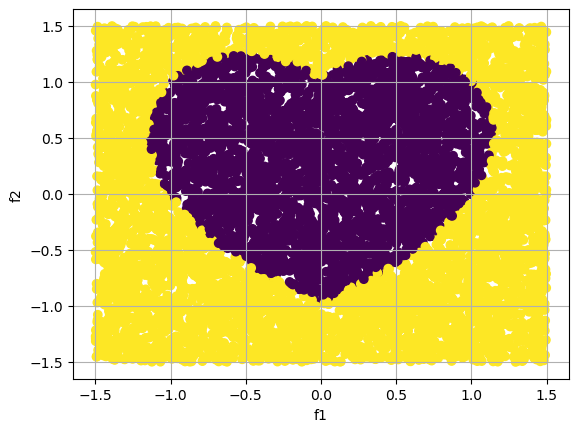

C:\Users\tapan\anaconda3\envs\al\lib\site-packages\sklearn\base.py:402: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


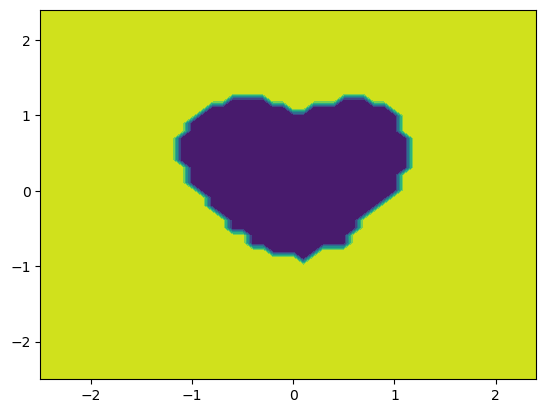

In [468]:
dBigTrain8192 = dbig_tr[0:8192]
dBigTrain8192Root = Dtree(dBigTrain8192)
node8192 = visualise(dBigTrain8192Root, 0, None)
print("Node count: ",node8192)
ratio = predictions(dBigTrain8192Root, dbig_ts)
correct  = sum(ratio[2]==dbig_ts[:,-1])
incorrect = len(dbig_ts)-correct
err8192 = incorrect/(correct+incorrect)
error.append(err8192)

# correct  = prediction[0]
# incorrect = prediction[1]

#Visualise and print Nodes, Accuracy Score
print("Accuracy :" , correct/(correct+incorrect), err8192)


plt.scatter(dBigTrain8192[:,0],dBigTrain8192[:,1], c=dBigTrain8192[:,2])
plt.xlabel("f1")
plt.ylabel("f2")
plt.grid(True)

# fig = plt.figure()
# projection = fig.add_subplot(projection='3d')
# projection.scatter(dBigTrain32.iloc[:,0],dBigTrain32.iloc[:,1],dBigTrain32.iloc[:,2])
# projection.set_xlabel("f1")
# projection.set_ylabel("f2")
# projection.set_zlabel('output')
plt.show()
plot_contourf(dBigTrain8192[:,:-1], dBigTrain8192[:,-1], dBigTrain8192Root)

In [469]:
error

[0.2179203539823009,
 0.0790929203539823,
 0.056969026548672565,
 0.04092920353982301,
 0.01825221238938053]

In [478]:
tr_size=[32,128,512,2048,8192]
nodes=[13,23,41,121,245]

Text(0, 0.5, 'error')

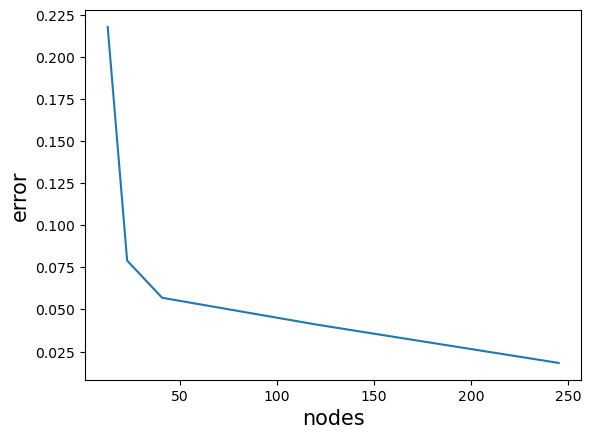

In [479]:
plt.plot(nodes,error)
plt.xlabel("nodes", fontsize=15)
plt.ylabel("error", fontsize=15)
# plt.savefig('lr_curve.png', dpi=500)

0.775995575221239


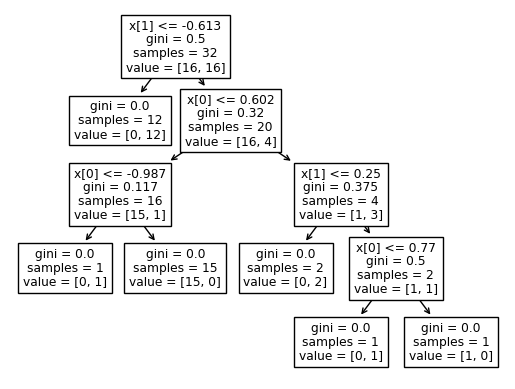

Node count: 11
0.9325221238938053


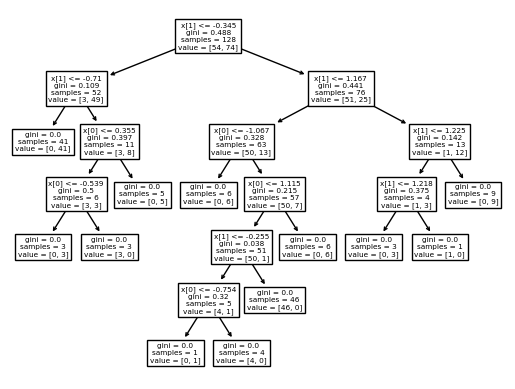

Node count: 23
0.9491150442477876


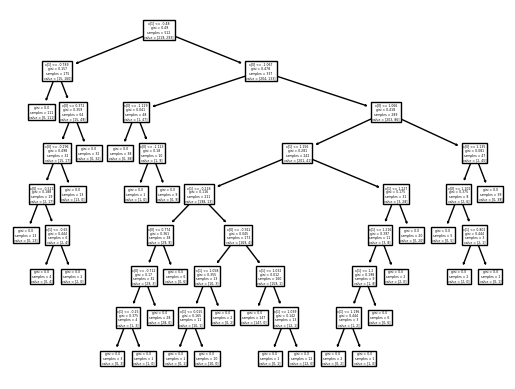

Node count: 55
0.9723451327433629


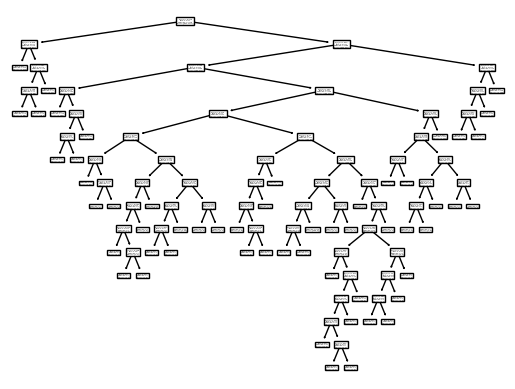

Node count: 109
0.9845132743362832


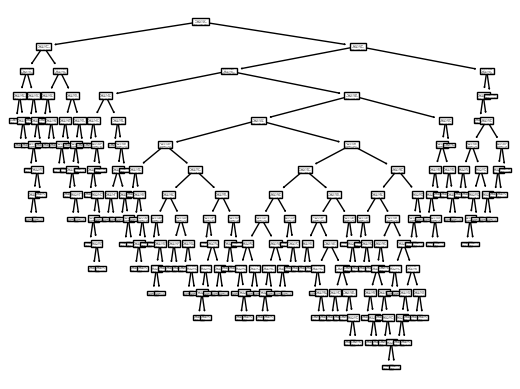

Node count: 247


In [486]:
tr_set=[dBigTrain32,dBigTrain128,dBigTrain512,dBigTrain2048,dBigTrain8192]
sk_errors=[]
sk_nodes=[]
for tr in tr_set:
    dt = DecisionTreeClassifier(random_state=2)
    dt.fit(tr[:,:-1], tr[:,-1])
    sk_nodes.append(dt.tree_.node_count)
    y_pred = dt.predict(dbig_ts[:,:-1])
    sk_errors.append(zero_one_loss(dbig_ts[:,-1], y_pred))
    print(accuracy_score(dbig_ts[:,-1], y_pred))
    
    tree.plot_tree(dt)
    plt.show()
    print("Node count:",dt.tree_.node_count)

[11, 23, 55, 109, 247] [0.22400442477876104, 0.06747787610619471, 0.05088495575221241, 0.027654867256637128, 0.015486725663716783]


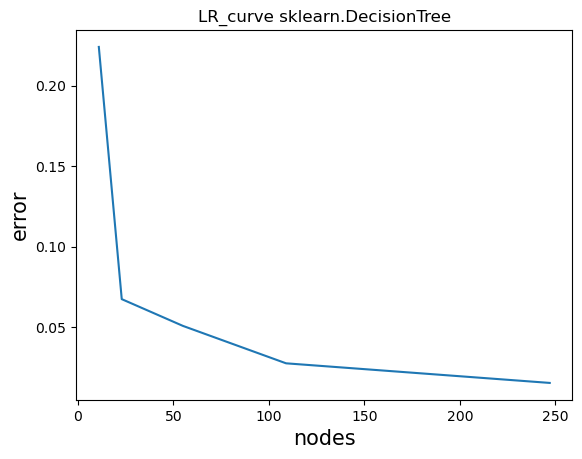

In [488]:
print(sk_nodes, sk_errors)
plt.plot(sk_nodes, sk_errors)
plt.xlabel("nodes", fontsize=15)
plt.ylabel("error", fontsize=15)
plt.title('LR_curve sklearn.DecisionTree')
# plt.savefig('sk_lr_curve.png', dpi=500)

INTERPOLATION

In [518]:
np.random.seed(101)
lgX_train = np.random.uniform(0, 1, 100) 
lgy_train = np.sin(lgX_train)
lgX_test = np.random.uniform(0, 1, 100) 
lgy_test = np.sin(lgX_test)

def lagrangeInterpolation(X, y, testX):
    preds=[]
    for x in testX:        
        y_pred = 0
        for i in range(len(X)):
            l = 1
            for j in range(len(X)):
                if i != j:
                    l = l * (x - X[j]) / (X[i] - X[j])
            y_pred = y_pred + y[i] * l
        preds.append(y_pred)
    return np.array(preds)


lgy_pred_train = lagrangeInterpolation(lgX_train, lgy_train, lgX_train)
lgTrain_error = mean_squared_error(lgy_train, lgy_pred_train) 
print("train error:", lgTrain_error)

lgy_pred_test = lagrangeInterpolation(lgX_train , lgy_test, lgX_test)
lgTest_error = mean_squared_error(lgy_test, lgy_pred_test) 
print("test error:", lgTest_error)

train error: 0.0
test error: 9.240933931770346e+71


In [519]:
mu=0.0
std = [0.1,0.25,0.5,1]
def gaussian_noise(x,mu,std):
    noise = np.random.normal(mu, std, size = x.shape)
    x_noisy = x + noise
    return x_noisy, np.sin(x_noisy)
for sd in std:
    Xtrain, ytrain = gaussian_noise(lgX_train, mu, sd)
    Xtest, ytest = gaussian_noise(lgX_test, mu, sd)
    print( 'mean: ',mu, ' sd: ', sd)
    lgy_pred_train = lagrangeInterpolation( Xtrain, ytrain, Xtrain)
    lgTrain_error = mean_squared_error(ytrain, lgy_pred_train) 
    print("train error:", lgTrain_error)

    lgy_pred_test = lagrangeInterpolation(Xtrain, ytest, Xtest)
    lgTest_error = mean_squared_error(ytest, lgy_pred_test) 
    print("test error:", lgTest_error)
    


mean:  0.0  sd:  0.1
train error: 0.0
test error: 4.3547244694361376e+105
mean:  0.0  sd:  0.25
train error: 0.0
test error: 1.4083235706959764e+125
mean:  0.0  sd:  0.5
train error: 0.0
test error: 1.2213046647505801e+158
mean:  0.0  sd:  1
train error: 0.0
test error: 4.948780083606297e+144
